In [1]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from torch.utils.data import DataLoader
from tqdm.auto import tqdm
import plotly.graph_objects as go
import json

In [2]:
from src.datasets.datamodules import DataModule
from src.my_model.transformer import *

In [3]:
publication = False
# if publication:
#     plt.style.use('seaborn-whitegrid')
#     plt.rcParams['font.family'] = 'serif'
#     plt.rcParams['font.serif'] = ['Times New Roman']
#     plt.rcParams['font.size'] = 12
#     plt.rcParams['axes.titlesize'] = 12
#     plt.rcParams['axes.labelsize'] = 12
#     plt.rcParams['xtick.labelsize'] = 12
#     plt.rcParams['ytick.labelsize'] = 12
#     plt.rcParams['legend.fontsize'] = 12
#     plt.rcParams['figure.titlesize'] = 12
#     plt.rcParams['figure.figsize'] = (6, 4)
#     plt.rcParams['lines.linewidth'] = 1.5
#     plt.rcParams['lines.markersize'] = 6
#     plt.rcParams['axes.linewidth'] = 1.5
#     plt.rcParams['legend.frameon'] = False
#     plt.rcParams['legend.handlelength'] = 1.5
#     plt.rcParams['legend.handleheight'] = 0.5
#     plt.rcParams['legend.borderpad'] = 0.5
#     plt.rcParams['legend.borderaxespad'] = 0.5
#     plt.rcParams['legend.labelspacing'] = 0.5
#     plt.rcParams['legend.columnspacing'] = 1.0
#     plt.rcParams['legend.loc'] = 'best'
#     plt.rcParams['legend.framealpha'] = 0.5

In [4]:
config = {}

In [5]:
# test_dir = "odd_output_muons_1"
# test_dir = "odd_output_muons_1_single_charge"
# test_dir = "test"
# test_dir = "Test"
# test_dir = "geant4_test_2"
# test_dir = "odd_output_muons_2_splits"
# test_dir = "ACAT_2025/" + "odd_output_muons_2_splits_eta_1"
# test_dir = "odd_output_muons_2_splits_eta_1"
test_dir = "odd_output_muons_2_splits_eta_1_1mm"
# test_dir = "odd_output_muons_2_splits_eta_1_test"
# test_dir = "odd_output_muons_10_splits_eta_1"
# test_dir = "odd_output_muons_100_splits_eta_1"
# test_dir = "odd_output_muons_1_splits_eta_1"

In [6]:
dataset_name = "Acts_muons"
dataset_name = "Acts_muons_root"
if "TrackML" in dataset_name:
    dataset_type = "tml"
elif "Acts" in dataset_name:
    dataset_type = "acts"
    if dataset_name.startswith("Acts_muons_root"):
        dataset_type = "acts_root"
if dataset_name.startswith("Acts_muons"):
    dataset_dir = Path("Data/Acts/Muons")

In [7]:
if dataset_name.startswith("Acts_muons"):
    config = {
        "min_hits": 7,
        "particle_types": [13, -13],
        "max_abs_eta": 1,
        # "max_abs_eta": 3,
    }
    # config["max_abs_eta"] = 3
    config["sort_by_radius"] = True
    # config["truth_position"] = True
    config["truth_position"] = False
    # config["particle_file"] = "particles_hits_helix"
    # config["particle_file"] = "particles_hits"
    # config["verbose"] = True

In [8]:
config["input_variables"] = ["tx", "ty", "tz"]
# config["input_variables"] = ["tr", "tphi", "tz"]
config["input_variables"] = ["tr", "dphi", "tz"]
config["input_variables"] = ["r", "dphi", "z"]
# config["input_variables"] = ["tx", "ty", "tz", "pT_circle_estimate"]


config["output_variables"] = ['pT', 'pz']
config["output_variables"] = ["qopT", "pz"]
# config["output_variables"] = ["q_over_p", "ptheta", "phi0", "d0", "z0"]
config["output_variables"] = ["q_over_p", "ptheta", "dphi0", "d0", "z0"]
# config["output_variables"] = ["qpT", "pz"]

In [9]:
import pandas as pd

# Creating a structured dataframe for the models
model_data = [
    (["r", "dphi", "z"], "Acts_muons_root", ['qopT', 'pz'], "Models/ActsODD/version_471"), # eta 1; min 7 hits # 32 - 16 # measurements # trained tt # mean
    (["tr", "dphi", "tz"], "Acts_muons_root", ["q_over_p", "ptheta", "phi0", "d0", "z0"], "Models/ActsODD/version_395"), # eta 1; min 7 hits # 32 - 2 # norm # geo mean
    (["tr", "dphi", "tz"], "Acts_muons_root", ["q_over_p", "ptheta", "dphi0", "d0", "z0"], "Models/ActsODD/version_414"), # eta 1; min 7 hits # 32 - 16 # geo mean # angles
    (["r", "dphi", "z"], "Acts_muons_root", ["q_over_p", "ptheta", "dphi0", "d0", "z0"], "Models/ActsODD/version_529"), # eta 1; min 7 hits # 32 - 16 # geo mean # finetuned muons # lr 1e-6
    (["r", "dphi", "z"], "Acts_muons_root", ["q_over_p", "ptheta", "phi0", "d0", "z0"], "Models/ActsODD/version_444/checkpoints/model-epoch=999-val_loss=2.287e-03.ckpt"), # eta 1; min 7 hits # 32 - 2 # geo mean # angles
]

# Creating a DataFrame
model_df = pd.DataFrame(
    model_data,
    columns=[
        "input_variables",
        "dataset_name",
        "output_variables",
        "mse_dir",
    ],
)
model_df["input_variables"] = model_df["input_variables"].apply(tuple)
model_df["output_variables"] = model_df["output_variables"].apply(tuple)

In [10]:
# Function to retrieve available models based on input configuration, dataset name, and DataFrame
def get_available_models(model_df, config_input, dataset_name, config_output):
    config_input = tuple(config_input)
    config_output = tuple(config_output)

    filtered_df = model_df[
        (model_df["input_variables"] == config_input)
        & (model_df["dataset_name"] == dataset_name)
        & (model_df["output_variables"] == config_output)
    ]

    if not filtered_df.empty:
        model_dict = {
            "mse_dir": filtered_df.iloc[0]["mse_dir"],
        }
        return {
            k: v for k, v in model_dict.items() if v is not None
        }  # Remove None values
    else:
        return {}


available_models = get_available_models(
    model_df, config["input_variables"], dataset_name, config["output_variables"]
)
print(available_models)

{'mse_dir': 'Models/ActsODD/version_529'}


In [11]:
models_dir = {
    "MSE": Path(available_models["mse_dir"]),
}

In [12]:
# Define models. (Assumes that p_pred_mse_list and p_pred_qloss_list are defined externally.)
models = {
    "MSE": {
        "color": "skyblue",
        "cmap": "Blues",
        "label": "MSE",
        "marker": "o",
    },
}
if "QLoss" in models_dir:
    models["QLoss"] = {
        "color": "coral",
        "cmap": "Reds",
        "label": "Quantile Loss",
        "marker": "^",
    }

In [13]:
from src.analysis.utils import (
    get_model_checkpoint_path,
    get_config,
    validate_model_config,
    compute_track_resolution,
)

In [14]:
# Load models
for model in models_dir:
    if model not in models:
        print(f"Skipping {model} model (not defined in models)")
        continue
    print(f"Loading {model} model")
    if models_dir[model].is_dir():
        ml_model_path = get_model_checkpoint_path(models_dir[model])[0]
    elif models_dir[model].is_file():
        ml_model_path = models_dir[model]
    else:
        raise ValueError(f"Model path {models_dir[model]} is neither a file nor a directory")
    # _instantiator is a function that is called to instantiate the model
    # Here the models have been trained using cli raising an error if _instantiator is not None
    ml_model = TrackFormer.load_from_checkpoint(
        checkpoint_path=ml_model_path, _instantiator=None, metric="sign",
    )
    ml_model.eval().to("cpu")
    ml_model_ = torch.load(ml_model_path, map_location="cpu")
    print(list(ml_model_['callbacks'].values())[0])

    # ml_model_ = torch.load(Path("/".join(str(ml_model_path).split("/")[:-1]) + "/last-v1.ckpt"), map_location="cpu")
    # ml_model_ = torch.load(Path("/".join(str(ml_model_path).split("/")[:-1]) + "/last.ckpt"), map_location="cpu")
    # print(list(ml_model_['callbacks'].values())[0])
    # print(ml_model_)
    print(ml_model)
    models[model]["model"] = ml_model

Loading MSE model
Found 2 checkpoints in Models/ActsODD/version_529/checkpoints


{'monitor': 'val_loss', 'best_model_score': tensor(3.5416e-05), 'best_model_path': 'Models/ActsODD/lightning_logs/version_529/checkpoints/model-epoch=1971-val_loss=3.542e-05.ckpt', 'current_score': tensor(3.5416e-05), 'dirpath': 'Models/ActsODD/lightning_logs/version_529/checkpoints', 'best_k_models': {'Models/ActsODD/lightning_logs/version_529/checkpoints/model-epoch=1971-val_loss=3.542e-05.ckpt': tensor(3.5416e-05)}, 'kth_best_model_path': 'Models/ActsODD/lightning_logs/version_529/checkpoints/model-epoch=1971-val_loss=3.542e-05.ckpt', 'kth_value': tensor(3.5416e-05), 'last_model_path': 'Models/ActsODD/lightning_logs/version_529/checkpoints/last.ckpt'}
TrackFormer(
  (embedding): Sequential(
    (0): Dropout(p=0.0, inplace=False)
    (1): Linear(in_features=3, out_features=32, bias=True)
    (2): LeakyReLU(negative_slope=0.01, inplace=True)
    (3): Linear(in_features=32, out_features=32, bias=True)
  )
  (transformer): TransformerEncoder(
    (layers): ModuleList(
      (0-15): 16 x

/tmp/ipykernel_47956/3447099240.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ml_model_ = torch.load(ml_model_path, map_location="cpu")


In [15]:
variable_labels = {
    "tx": r"x_{truth}",
    "ty": r"y_{truth}",
    "tz": r"z_{truth}",
    "tr": r"r_{truth}",
    "tphi": r"\varphi_{truth}",
    "dphi": r"\Delta\varphi",
    "pT": "p_T",
    # "qopT": r"\frac{q}{p_T}",
    "qopT": "q/p_T",
    "qpT": "q*p_T",
    "pz": "p_z",
    "pT_circle_estimate": "p_T (circle estimate)",
    "q_over_p": r"\frac{q}{p}",
    # "ptheta": r"\theta_{p}",
    "ptheta": r"\theta",
    # "phi0": r"\varphi_{0}",
    "phi0": r"\varphi",
    "dphi0": r"\Delta\varphi_{0}",
    "d0": r"d_{0}",
    "z0": r"z_{0}",
    "x": r"x_{reco}",
    "y": r"y_{reco}",
    "z": r"z_{reco}",
    "r": r"r_{reco}",
}

# variable_filenames is a reverse mapping of variable_labels
variable_filenames = {v: k for k, v in variable_labels.items()}

variable_units = {
    "tx": "mm",
    "ty": "mm",
    "tz": "mm",
    "tr": "mm",
    "tphi": "rad",
    "dphi": "rad",
    "dphi0": "rad",
    "pT": "GeV",
    "q_over_p": "1/GeV",
    "qopT": "1/GeV",
    "qpT": "GeV",
    "pz": "GeV",
    "d0": "mm",
    "z0": "mm",
    "ptheta": "rad",
    "phi0": "rad",
    "dphi0": "rad",
}

In [16]:
title_suffix = ""

# if publication:
#     title_suffix += r"$\mathrm{(TrackML)}$"
# else:
#     title_suffix += r"$\mathrm{(TrackML , \textit{zenodo})}$"
#     # title_suffix += r"$\mathrm{(Acts)}$"
#     # title_suffix += r"$\mathrm{(Acts \, \textit{zenodo})}$"
#     # title_suffix += r"$\mathrm{(Acts \, \textit{zenodo \, full})}$"

if not publication:
    # Add input and output variables to the title suffix
    title_suffix += (
        f" ((${'$, $'.join([variable_labels[var] for var in config['input_variables']])}$)"
    )
    title_suffix += r" $ \to $ "
    title_suffix += (
        f"(${'$, $'.join([variable_labels[var] for var in config['output_variables']])}$))"
    )

In [17]:
output_dir = Path("Results/TrackML/")
if dataset_type == "acts" or True:
    output_dir = Path("Results/ActsODD/")

input_variables = "".join(config["input_variables"]).replace("t", "")

output_variables = "_".join(config["output_variables"])

experiment_name = f"{input_variables}_n_hits_{config['min_hits']}_{output_variables}_POC_{dataset_name}"
# experiment_name = f"{input_variables}_n_hits_{config['min_hits']}_{output_variables}_POC_{dataset_name}_full_dataset"
# experiment_name += "_batch_size_2048"
# experiment_name += "_eta_4"
# experiment_name += "_eta_3"
experiment_name += f"_eta_{config['max_abs_eta']}"
# experiment_name += "_eta_1"
# experiment_name += "_trained_eta_1"
# experiment_name += "_trained_eta_3"
# experiment_name += "_trained_TrackML"
# experiment_name += "_trained_TrackML_first"
# experiment_name += "_z_symmetry"
experiment_name += "_trained_ODD_full"
# experiment_name += "_" + "_".join(test_dir.split("_")[-2:])  # Use the last two parts of the test_dir name
experiment_name += "_" + test_dir.replace("/", "_")  # Use the last two parts of the test_dir name
# experiment_name += "_e_32_h_8"
# experiment_name += "_e_128_h_2"
# experiment_name += "_trained_7_hits"
# experiment_name += "_huber"
# experiment_name += "_trained_with_scat"
# experiment_name += "_huber_resolution_e_32_h_2"
# experiment_name += "_huber_resolution_huber_e_32_h_2"
# experiment_name = f"{input_variables}_n_hits_{config['min_hits']}_{output_variables}_POC_no_scat_{dataset_name}_e_128_h_2_no_droupout"
if not any("t" in var for var in config["input_variables"]):
    experiment_name += "_measurements"

# Add model version to the output directory
model_version = str(models_dir["MSE"]).split("version_")[-1]
model_version = model_version.split("/")[0]
experiment_name += f"_version_{model_version}"

output_dir = output_dir / experiment_name

# Create the output directory if it does not exist
output_dir.mkdir(exist_ok=True, parents=True)

In [18]:
config["input_variables"] = ["tr", "dphi", "tz"]

In [19]:
# Instantiate the DataModule num_workers=16)
# dataset_wrapper = DataModule(dataset_type="tml", dataset_dir="Data/Tml/trackml_100_events_splits") # 20 000 particles
dataset_wrapper = DataModule(
    dataset_type=dataset_type,
    dataset_dir=dataset_dir,
    use_wrapper=False,
    kwargs=config,
)  # 1 404 273 particles

# dataset_wrapper.setup(stage="test")
dataset_wrapper.test_dataset = dataset_wrapper._create_dataset(test_dir)
tl = dataset_wrapper.test_dataloader()
# 1 min 41.4 s

Data/Acts/Muons/odd_output_muons_2_splits_eta_1_1mm/odd_output_muons_split_start_0_n_50000/hits.root
['hits;2', 'hits;1']
['event_id', 'geometry_id', 'barcode', 'tx', 'ty', 'tz', 'tt', 'tpx', 'tpy', 'tpz', 'te', 'deltapx', 'deltapy', 'deltapz', 'deltae', 'index', 'volume_id', 'boundary_id', 'layer_id', 'approach_id', 'sensitive_id']
Data/Acts/Muons/odd_output_muons_2_splits_eta_1_1mm/odd_output_muons_split_start_0_n_50000/measurements.root
['measurements;3', 'measurements;2']
['particles', 'event_nr', 'volume_id', 'layer_id', 'surface_id', 'extra_id', 'rec_loc0', 'rec_loc1', 'rec_time', 'var_loc0', 'var_loc1', 'var_time', 'rec_gx', 'rec_gy', 'rec_gz', 'clus_size', 'channel_value', 'channel_loc0', 'clus_size_loc0', 'channel_loc1', 'clus_size_loc1', 'true_loc0', 'true_loc1', 'true_phi', 'true_theta', 'true_qop', 'true_time', 'true_x', 'true_y', 'true_z', 'true_incident_phi', 'true_incident_theta', 'residual_loc0', 'residual_loc1', 'residual_time', 'pull_loc0', 'pull_loc1', 'pull_time']
D

In [20]:
def p_to_pt(p, ptheta):
    return p * np.sin(ptheta)

def p_to_pz(p, ptheta):
    return p * np.cos(ptheta)

In [21]:
def compute_resolution_bins(
    peta,
    bins,
    pi_true_values,
    pi_pred_values,
    model_data_bins,
    model_name="MSE",
    show=False,
):
    """
    For each eta-bin, fit a Gaussian to the residual distribution and store:
      (bin_mean, bin_std, bin_count, bin_pi_true_value, bin_mean_err, bin_std_err,
       pval_raw, pval_binned)

    - pval_raw: normality p-value from raw residuals in the bin
        * D'Agostino-Pearson (scipy.stats.normaltest) if n >= 8
        * Shapiro-Wilk (scipy.stats.shapiro) if 3 <= n < 8, else NaN
    - pval_binned: chi-square p-value comparing observed histogram counts to the
      fitted Normal's expected counts over the same bins (parameters estimated
      from the histogram fit). df = k - 1 - 2 after filtering low-expected bins.

    If show=True:
      • Still shows the per-bin histogram + fitted Gaussian (as before)
      • Shows TWO summary plots vs η-bin center:
          (1) Raw-data normality p-values
          (2) Binned chi-square p-values
    """
    import numpy as np
    from scipy.stats import norm, normaltest, shapiro, chi2
    from scipy.optimize import curve_fit

    # Initialize
    model_data_bins[model_name] = []
    eta_centers = 0.5 * (bins[:-1] + bins[1:])
    pvals_raw = []
    pvals_binned = []
    pvals_ks = []

    for i in range(len(bins) - 1):
        # Indices in this eta-bin
        bin_indices = np.where((peta >= bins[i]) & (peta < bins[i + 1]))[0]
        pi_pred_values_bin = pi_pred_values[bin_indices]
        pi_true_values_bin = pi_true_values[bin_indices]

        if len(pi_pred_values_bin) == 0 or len(pi_true_values_bin) == 0:
            model_data_bins[model_name].append(
                (np.nan, np.nan, 0, np.nan, np.nan, np.nan, np.nan, np.nan)
            )
            pvals_raw.append(np.nan)
            pvals_binned.append(np.nan)
            pvals_ks.append(np.nan)
            continue

        # Your residuals per bin (unbinned data)
        bin_values, _ = compute_track_resolution(
            pi_true_values_bin,
            pi_pred_values_bin,
        )

        # Histogram (for fitting + binned GOF)
        # You can tweak n_bins if desired:
        n_bins = 100
        # Density histogram for fitting
        n_dens, model_edges = np.histogram(bin_values, bins=n_bins, density=True)

        # Fit Normal to the density histogram
        if not all(np.isnan(val) for val in n_dens):
            try:
                params, cov = curve_fit(
                    norm.pdf,
                    # use bin centers for the pdf fit
                    0.5 * (model_edges[:-1] + model_edges[1:]),
                    n_dens,
                    p0=[np.mean(bin_values), np.std(bin_values)],
                    bounds=([-np.inf, 0], [np.inf, np.inf]),
                )
                perr = np.sqrt(np.diag(cov))
                model_mean, model_std = params
                model_mean_err, model_std_err = perr
            except Exception:
                model_mean = np.nan
                model_std = np.nan
                model_mean_err = np.nan
                model_std_err = np.nan
        else:
            model_mean = np.nan
            model_std = np.nan
            model_mean_err = np.nan
            model_std_err = np.nan

        if show:
            # ---------- RAW-DATA NORMALITY TEST ----------
            # Use unbinned residuals
            pval_raw = np.nan
            try:
                if len(bin_values) >= 8:
                    _, pval_raw = normaltest(bin_values, nan_policy="omit")
                elif len(bin_values) >= 3:
                    _, pval_raw = shapiro(bin_values)
                # else keep NaN for very tiny samples
            except Exception:
                pval_raw = np.nan
            pvals_raw.append(float(pval_raw) if pval_raw is not None else np.nan)

            # ---------- BINNED (CHI-SQUARE) GOODNESS-OF-FIT ----------
            # Compare observed counts vs expected from the fitted Normal
            pval_binned = np.nan
            try:
                # Observed counts on the same edges (not density)
                obs_counts, _ = np.histogram(bin_values, bins=model_edges, density=False)
                total = obs_counts.sum()

                # Need valid fitted params
                if np.isfinite(model_mean) and np.isfinite(model_std) and model_std > 0 and total > 0:
                    # Expected counts per bin from fitted Normal's CDF over edges
                    probs = norm.cdf(model_edges[1:], model_mean, model_std) - norm.cdf(
                        model_edges[:-1], model_mean, model_std
                    )
                    exp_counts = probs * total

                    # Standard chi-square assumptions: expected >= ~5
                    mask = exp_counts >= 5
                    k = int(np.sum(mask))
                    # Subset observed/expected
                    obs = obs_counts[mask]
                    exp = exp_counts[mask]

                    # Degrees of freedom: k - 1 - m (m=2 params: mean, std)
                    df = k - 1 - 2
                    if df > 0 and k >= 3:
                        # Chi-square statistic
                        chi2_stat = np.sum((obs - exp) ** 2 / exp)
                        pval_binned = chi2.sf(chi2_stat, df)
            except Exception:
                pval_binned = np.nan
            pvals_binned.append(float(pval_binned) if pval_binned is not None else np.nan)
            # ---------- Kolmogorov-Smirnov TEST ----------
            from scipy.stats import kstest
            _, pval_ks = kstest(bin_values, 'norm', args=(model_mean, model_std))
            pvals_ks.append(float(pval_ks) if pval_ks is not None else np.nan)


        # Optional per-bin visualization
        if show:
            import matplotlib.pyplot as plt
            plt.figure(figsize=(10, 6))
            # Plot histogram (counts normalized to density) and fitted Normal
            plt.hist(bin_values, bins=model_edges, density=True, alpha=0.6, label="Data")
            x = np.linspace(np.min(bin_values), np.max(bin_values), 1000)
            if np.isfinite(model_mean) and np.isfinite(model_std) and model_std > 0:
                plt.plot(x, norm.pdf(x, model_mean, model_std), lw=2, label="Fitted Gaussian")
            plt.title(f"Bin {i+1}: {bins[i]} < eta < {bins[i+1]}\n"
                      f"p_raw={pval_raw:.3g} | p_binned={pval_binned:.3g} | p_KS={pval_ks:.3g}")
            plt.xlabel("Residual")
            plt.ylabel("Density")
            plt.legend()
            plt.grid(True)
            plt.show()

        # Collect bin-level results
        bin_mean = model_mean
        bin_std = model_std
        bin_mean_err = model_mean_err
        bin_std_err = model_std_err
        bin_count = len(bin_indices)
        bin_pi_true_value = np.mean(np.abs(1 / pi_true_values_bin))

        model_data_bins[model_name].append(
            (
                bin_mean,
                bin_std,
                bin_count,
                bin_pi_true_value,
                bin_mean_err,
                bin_std_err,
            )
        )

    # ---------- SUMMARY PLOTS ----------
    if show:
        import matplotlib.pyplot as plt

        # (1) Raw-data normality p-values vs eta
        plt.figure(figsize=(10, 4.8))
        plt.plot(eta_centers, pvals_raw, marker="o", linestyle="-", label="Raw-data normality p-value")
        plt.axhline(0.05, linestyle="--", label="0.05 threshold")
        plt.xlabel("peta (eta bin center)")
        plt.ylabel("Gaussianity p-value")
        plt.title(f"Gaussianity vs peta (RAW test) — {model_name}")
        plt.grid(True)
        plt.legend()
        plt.show()

        # (2) Binned chi-square p-values vs eta
        plt.figure(figsize=(10, 4.8))
        plt.plot(eta_centers, pvals_binned, marker="o", linestyle="-", label="Binned χ² GOF p-value")
        plt.axhline(0.05, linestyle="--", label="0.05 threshold")
        plt.xlabel("peta (eta bin center)")
        plt.ylabel("Gaussianity p-value")
        plt.title(f"Gaussianity vs peta (BINNED χ²) — {model_name}")
        plt.grid(True)
        plt.legend()
        plt.show()

        # (3) Binned Kolmogorov-Smirnov p-values vs eta
        plt.figure(figsize=(10, 4.8))
        plt.plot(eta_centers, pvals_ks, marker="o", linestyle="-", label="Binned KS GOF p-value")
        plt.axhline(0.05, linestyle="--", label="0.05 threshold")
        plt.xlabel("peta (eta bin center)")
        plt.ylabel("Gaussianity p-value")
        plt.title(f"Gaussianity vs peta (BINNED KS) — {model_name}")
        plt.grid(True)
        plt.legend()
        plt.show()

    return model_data_bins


In [22]:
def plot_resolutions(model_data_bins, output_dir, bin_centers, skip_measurements=False, xlabel="peta", skip_truth_hits=True):
    markersize=7
    markersize=12
    for variable in model_data_bins:
        # Make the plot
        plt.figure(figsize=(12, 6))
        # plt.suptitle("Relative Error vs peta", fontsize=16)
        # Plot the data
        for model_name in model_data_bins[variable]:
            # Get the data for this model
            model_data = model_data_bins[variable][model_name]
            if model_data is None or len(model_data) == 0:
                print(f"No data for model {model_name} and variable {variable}")
                continue
            # Convert to numpy arrays
            model_data = np.array(model_data)
            # Get the means and stds
            bin_stds = model_data[:, 1]
            bin_pi_true_values = model_data[:, 3]
            bin_stds_err = model_data[:, 5]
            
            if model_name == "MSE":
                model_name = "Transformer"
                model_name = model_name + " (tracks) (truth hits)"
                if skip_truth_hits:
                    continue
            if model_name == "MSE_measurements":
                model_name = "Transformer"
                # model_name = model_name + " (tracks)"
                if not skip_truth_hits:
                    model_name = model_name + " (measurements)"
                if skip_measurements:
                    continue
            if model_name == "ACTS_Tracks":
                model_name = "Acts"
                # model_name = model_name + " (tracks)"
                if not skip_truth_hits:
                    model_name = model_name + " (measurements)"
            if model_name == "MSE_particles_truth":
                model_name = "Transformer"
                model_name = model_name + " (particles) (truth hits)"
            # Set marker style
            if model_name.startswith("Transformer"):
                # Triangle marker for Transformer models
                marker_style = "^"
            else:
                # Circle marker for Acts models
                marker_style = "o"

            if variable in ["qopT", "q_over_p"]:
                plt.errorbar(
                    bin_centers,
                    bin_stds*bin_pi_true_values,
                    yerr=bin_stds_err*bin_pi_true_values,
                    label=model_name,
                    alpha=0.7,
                    fmt=marker_style,
                    markersize=markersize,
                )
            else:
                plt.errorbar(
                    bin_centers,
                    bin_stds,
                    yerr=bin_stds_err,
                    label=model_name,
                    alpha=0.7,
                    fmt=marker_style,
                    markersize=markersize,
                )

        fontsize = 14
        fontsize = 17
        # plt.legend(fontsize=fontsize)
        if variable in ["ptheta"]:
            plt.legend(fontsize=fontsize, loc='lower center')
        else:
            plt.legend(fontsize=fontsize, loc='upper center')
        from matplotlib.ticker import ScalarFormatter

        class ScalarFormatterClass(ScalarFormatter):
            def _set_format(self):
                self.format = "%2.2f"
        # Maximum number of digits in tick labels on both axes (add scientific notation if needed)
        yScalarFormatter = ScalarFormatterClass(useMathText=True)
        yScalarFormatter.set_powerlimits((0,0))
        # Set label size
        
        # plt.gca().xaxis.set_major_formatter(plt.FormatStrFormatter('%.2f'))
        plt.gca().yaxis.set_major_formatter(yScalarFormatter)
        # Set formater label font size (offset text)
        plt.gca().yaxis.offsetText.set_fontsize(fontsize)
        


        plt.tick_params(axis="both", which="major", labelsize=fontsize)
        # plt.title("Relative Error vs peta")
        # plt.yscale("log")
        plt.xscale("linear")
        if xlabel == "peta":
            plt.xlabel(r"Truth $\eta$", fontsize=fontsize)
        elif xlabel == "d0":
            plt.xlabel(r"Truth $d_0$ [mm]", fontsize=fontsize)
        elif xlabel == "z0":
            plt.xlabel(r"Truth $z_0$ [mm]", fontsize=fontsize)
        elif xlabel == "pT":
            plt.xlabel(r"Truth $p_T$ [GeV]", fontsize=fontsize)
        else:
            plt.xlabel(xlabel, fontsize=fontsize)
        variable_unit_label = ""
        if variable in variable_units:
            variable_unit_label = f" $[\mathrm{{{variable_units[variable]}}}]$"
        variable_label = variable
        if variable in ["qopT", "q_over_pT"]:
            variable_label = r"$p_T \times \sigma(q/p_T)$"
        elif variable in variable_labels:
            variable_label = rf"$\sigma({variable_labels[variable]})${variable_unit_label}"
        plt.ylabel(variable_label, fontsize=fontsize)

        # if variable in ["qopT", "q_over_pT"]:
        #     plt.ylabel(r"$p_T \times \sigma(q/p_T)$", fontsize=fontsize)
        # elif not variable in variable_labels:
        #     plt.ylabel(rf"$\sigma({variable_labels.get(variable, variable)})${variable_unit_label}", fontsize=fontsize)
        # plt.ylabel(r"$p \times \sigma(q/p)$")
        plt.grid(True, linestyle="--", alpha=0.7)
        # plt.ylim(6e-3, 1)
        filename = output_dir / f"relative_error_vs_{xlabel}_particles_{variable}_full.png"
        if len(model_data_bins[variable]) > 3:
            filename = output_dir / f"relative_error_vs_{xlabel}_particles_{variable}_full_legend.png"
        if skip_measurements:
            filename = output_dir / f"resolution_vs_{xlabel}_particles_{variable}_short.png"
        plt.savefig(
            filename, format="png", bbox_inches="tight"
        )
        plt.savefig(
            filename.with_suffix(".svg"), format="svg", bbox_inches="tight"
        )
        plt.show()

In [23]:
def plot_ratios(model_data_bins, output_dir, bin_centers, reference_model="ACTS_Tracks",
               skip_measurements=False, xlabel="peta", skip_truth_hits=True):
    markersize=7
    markersize=12
    for variable in model_data_bins:
        # Make the plot
        plt.figure(figsize=(12, 6))
        # plt.suptitle("Relative Error vs peta", fontsize=16)
        # Plot the data
        for model_name in model_data_bins[variable]:
            # Get the data for this model
            model_data = model_data_bins[variable][model_name]
            if model_data is None or len(model_data) == 0:
                print(f"No data for model {model_name} and variable {variable}")
                continue
            # Convert to numpy arrays
            model_data = np.array(model_data)
            # Get the means and stds
            bin_stds = model_data[:, 1] / np.array(model_data_bins[variable][reference_model])[:, 1]
            bin_pi_true_values = model_data[:, 3]
            bin_stds_err = model_data[:, 5]
            
            if model_name == "MSE":
                model_name = "Transformer"
                model_name = model_name + " (tracks) (truth hits)"
                if skip_truth_hits:
                    continue
            if model_name == "MSE_measurements":
                model_name = "Transformer"
                # model_name = model_name + " (tracks)"
                if not skip_truth_hits:
                    model_name = model_name + " (measurements)"
                if skip_measurements:
                    continue
            if model_name == "ACTS_Tracks":
                model_name = "Acts"
                # model_name = model_name + " (tracks)"
                if not skip_truth_hits:
                    model_name = model_name + " (measurements)"
            if model_name == "MSE_particles_truth":
                model_name = "Transformer"
                model_name = model_name + " (particles) (truth hits)"
            # Set marker style
            if model_name.startswith("Transformer"):
                # Triangle marker for Transformer models
                marker_style = "^"
            else:
                # Circle marker for Acts models
                marker_style = "o"

            if variable in ["qopT", "q_over_p"]:
                plt.errorbar(
                    bin_centers,
                    bin_stds*bin_pi_true_values,
                    yerr=bin_stds_err*bin_pi_true_values,
                    label=model_name,
                    alpha=0.7,
                    fmt=marker_style,
                    markersize=markersize,
                )
            else:
                plt.errorbar(
                    bin_centers,
                    bin_stds,
                    yerr=bin_stds_err,
                    label=model_name,
                    alpha=0.7,
                    fmt=marker_style,
                    markersize=markersize,
                )

        fontsize = 14
        fontsize = 17
        # plt.legend(fontsize=fontsize)
        plt.legend(fontsize=fontsize, loc='center')
        plt.tick_params(axis="both", which="major", labelsize=fontsize)
        # plt.title("Relative Error vs peta")
        # plt.yscale("log")
        plt.xscale("linear")
        if xlabel == "peta":
            plt.xlabel(r"Truth $\eta$", fontsize=fontsize)
        elif xlabel == "d0":
            plt.xlabel(r"Truth $d_0$ [mm]", fontsize=fontsize)
        elif xlabel == "z0":
            plt.xlabel(r"Truth $z_0$ [mm]", fontsize=fontsize)
        elif xlabel == "pT":
            plt.xlabel(r"Truth $p_T$ [GeV]", fontsize=fontsize)
        else:
            plt.xlabel(xlabel, fontsize=fontsize)
        variable_unit_label = ""
        if variable in variable_units:
            variable_unit_label = f" $[\mathrm{{{variable_units[variable]}}}]$"
        variable_label = variable
        if variable in ["qopT", "q_over_pT"]:
            variable_label = r"$p_T \times \sigma(q/p_T)$"
        elif variable in variable_labels:
            variable_label = rf"$\sigma({variable_labels[variable]})${variable_unit_label}"
        plt.ylabel(variable_label, fontsize=fontsize)

        # if variable in ["qopT", "q_over_pT"]:
        #     plt.ylabel(r"$p_T \times \sigma(q/p_T)$", fontsize=fontsize)
        # elif not variable in variable_labels:
        #     plt.ylabel(rf"$\sigma({variable_labels.get(variable, variable)})${variable_unit_label}", fontsize=fontsize)
        # plt.ylabel(r"$p \times \sigma(q/p)$")
        plt.grid(True, linestyle="--", alpha=0.7)
        # plt.ylim(6e-3, 1)
        filename = output_dir / f"resolution_ratios_vs_{xlabel}_particles_{variable}_full.png"
        if skip_measurements:
            filename = output_dir / f"resolution_ratios_vs_{xlabel}_particles_{variable}_short.png"
        plt.savefig(
            filename, format="png", bbox_inches="tight"
        )
        plt.savefig(
            filename.with_suffix(".svg"), format="svg", bbox_inches="tight"
        )
        plt.show()

In [24]:
def plot_bias(model_data_bins, output_dir, bin_centers, skip_measurements=False, xlabel="peta", skip_truth_hits=True):
    markersize=7
    for variable in model_data_bins:
        # Make the plot
        plt.figure(figsize=(12, 6))
        # plt.suptitle("Relative Error vs peta", fontsize=16)
        # Plot the data
        for model_name in model_data_bins[variable]:
            # Get the data for this model
            model_data = model_data_bins[variable][model_name]
            if model_data is None or len(model_data) == 0:
                print(f"No data for model {model_name} and variable {variable}")
                continue
            # Convert to numpy arrays
            model_data = np.array(model_data)
            # Get the means and stds
            bin_means = model_data[:, 0]
            bin_pi_true_values = model_data[:, 3]
            bin_means_err = model_data[:, 4]
            
            if model_name == "MSE":
                model_name = "Transformer"
                model_name = model_name + " (tracks) (truth hits)"
                if skip_truth_hits:
                    continue
            if model_name == "MSE_measurements":
                model_name = "Transformer"
                model_name = model_name + " (tracks)"
                if not skip_truth_hits:
                    model_name = model_name + " (measurements)"
                if skip_measurements:
                    continue
            if model_name == "ACTS_Tracks":
                model_name = "Acts"
                model_name = model_name + " (tracks)"
                if not skip_truth_hits:
                    model_name = model_name + " (measurements)"
            if model_name == "MSE_particles_truth":
                model_name = "Transformer"
                model_name = model_name + " (particles) (truth hits)"
            # Set marker style
            if model_name.startswith("Transformer"):
                # Triangle marker for Transformer models
                marker_style = "^"
            else:
                # Circle marker for Acts models
                marker_style = "o"

            if variable in ["qopT", "q_over_p"]:
                plt.errorbar(
                    bin_centers,
                    bin_means*bin_pi_true_values,
                    yerr=bin_means_err*bin_pi_true_values,
                    label=model_name,
                    alpha=0.7,
                    fmt=marker_style,
                    markersize=markersize,
                )
            else:
                plt.errorbar(
                    bin_centers,
                    bin_means,
                    yerr=bin_means_err,
                    label=model_name,
                    alpha=0.7,
                    fmt=marker_style,
                    markersize=markersize,
                )

        fontsize = 14
        plt.legend(fontsize=fontsize)
        # plt.legend(fontsize=fontsize, loc='center')
        plt.tick_params(axis="both", which="major", labelsize=fontsize)
        # plt.title("Relative Error vs peta")
        # plt.yscale("log")
        plt.xscale("linear")
        if xlabel == "peta":
            plt.xlabel(r"Truth $\eta$", fontsize=fontsize)
        elif xlabel == "d0":
            plt.xlabel(r"Truth $d_0$ [mm]", fontsize=fontsize)
        elif xlabel == "z0":
            plt.xlabel(r"Truth $z_0$ [mm]", fontsize=fontsize)
        elif xlabel == "pT":
            plt.xlabel(r"Truth $p_T$ [GeV]", fontsize=fontsize)
        else:
            plt.xlabel(xlabel, fontsize=fontsize)
        variable_unit_label = ""
        if variable in variable_units:
            variable_unit_label = f" $[\mathrm{{{variable_units[variable]}}}]$"
        variable_label = variable
        if variable in ["qopT", "q_over_pT"]:
            variable_label = r"$p_T \times \mu(q/p_T)$"
        elif variable in variable_labels:
            variable_label = rf"$\mu({variable_labels[variable]})${variable_unit_label}"
        plt.ylabel(variable_label, fontsize=fontsize)

        # if variable in ["qopT", "q_over_pT"]:
        #     plt.ylabel(r"$p_T \times \sigma(q/p_T)$", fontsize=fontsize)
        # elif not variable in variable_labels:
        #     plt.ylabel(rf"$\sigma({variable_labels.get(variable, variable)})${variable_unit_label}", fontsize=fontsize)
        # plt.ylabel(r"$p \times \sigma(q/p)$")
        plt.grid(True, linestyle="--", alpha=0.7)
        # plt.ylim(6e-3, 1)
        filename = output_dir / f"fit_bias_vs_{xlabel}_particles_{variable}_full.png"
        if len(model_data_bins[variable]) > 3:
            filename = output_dir / f"fit_bias_vs_{xlabel}_particles_{variable}_full_legend.png"
        if skip_measurements:
            filename = output_dir / f"fit_bias_vs_{xlabel}_particles_{variable}_short.png"
        plt.savefig(
            # filename, format="png", bbox_inches="tight"
            filename, format="png"
        )
        plt.savefig(
            # filename.with_suffix(".svg"), format="svg", bbox_inches="tight"
            filename.with_suffix(".svg"), format="svg"
        )
        plt.show()

# Tracks

## Loading data

In [25]:
from copy import deepcopy
all_events_tracks_list = []
all_events_processed = []
all_hits_list = []
dataset_wrapper.test_dataset.truth_tracks = False
for i in range(len(dataset_wrapper.test_dataset.available_events)):
    event = dataset_wrapper.test_dataset.available_events[i]
    # print(f"Loading event {event}")
    event_files = dataset_wrapper.test_dataset._load_event(event, n_events_split=50000)
    # event_files = dataset_wrapper.test_dataset._load_event(event, n_events_split=100)
    processed_event = dataset_wrapper.test_dataset._preprocessor(event_files=deepcopy(event_files))
    # print(f"{list(processed_event) = }")
    hits, tracks, particles = event_files
    # print(hits.head())
    # print(tracks.head())
    # print(particles.head())
    # Add Hit_ID to the hits dataframe (index)
    hits["hit_id"] = hits.index
    # Save number of hits
    number_of_hits = len(hits)
    # print(f"{hits['event_id'].unique() = }")
    # print(f"{particles['event_id'].unique() = }")
    # print(f"{tracks['event_id'].unique() = }")

    # Add "_truth" suffix to the columns of the particles dataframe
    particles = particles.rename(columns=lambda x: f"{x}".replace("t_", "") if x.startswith("t_") else x)
    
    # Add "_truth" suffix to the columns of the particles dataframe
    particles = particles.rename(columns=lambda x: f"{x}_truth" if x not in ["event_id", "particle_id", "particle_type", "process"] else x)
    # Count the number of hits per particle
    hit_particle_counts = hits.groupby(["event_id", "particle_id"]).size().to_frame(name="n_particle_hits")
    # This must be an integer
    assert hit_particle_counts["n_particle_hits"].dtype == "int64", f"n_particle_hits is not an integer, it is {hit_particle_counts['n_particle_hits'].dtype}"
    # Add index as a column
    hit_particle_counts = hit_particle_counts.reset_index()
    # Merge the hit counts with the particles dataframe
    particles = particles.merge(hit_particle_counts, on=["event_id", "particle_id"], how="left")

    # print(f"{particles.columns = }")
    # Match the tracks with the particles
    tracks = tracks.merge(particles, on=["event_id", "particle_id"], how="left", suffixes=("", "_truth"))
    # processed_event = list(processed_event)

    # Keep only the particles that are in the specified particle types
    particle_types = config["particle_types"]
    tracks = tracks[tracks["particle_type"].isin(particle_types)]

    # Add the event number to the tracks and hits dataframes
    tracks["event"] = event
    hits["event"] = event

    # Add a new column with the total number of hits in the track
    tracks["n_hits_track"] = tracks["nMeasurements"]
    # # Count the number of hits of the truth particle for each track
    # # Group by the track id and particle id then count the number of hits
    # # and select the value of the particle id
    # # # Temporarily explode the tracks dataframe to count the hits
    # # tracks["Hits_ID"] = tracks["Hits_ID"].str.strip("[]").str.split(",")
    # # # Convert to int
    # # tracks["Hits_ID"] = tracks["Hits_ID"].apply(
    # #     lambda x: [int(i) for i in x if i]
    # # )
    # # Explode the dataframe
    # # tracks_exploded = tracks.explode("Hits_ID")
    # Keep only Hits_ID, particle_id and track_id
    tracks_exploded = tracks[["event_id", "particle_id", "track_id"]].copy()
    # Rename Hits_ID to hit_id
    # tracks_exploded.rename(columns={"Hits_ID": "hit_id"}, inplace=True)

    # Rename the particle_id column to particle_id_track (to avoid confusion with the truth particle_id)
    tracks_exploded.rename(columns={"particle_id": "particle_id_track"}, inplace=True)

    # # Merge with hits dataframe
    hits = pd.merge(
        hits[hits["stateType"] == 0],
        tracks_exploded,
        on=["event_id", "track_id"],
        how="right",
        # validate="one_to_many",
    )
    # print(f"{hits.columns = }")
    # print(f"{len(hits) = }")
    # Make sure there is no NaN in the tx, ty, tz columns of the hits dataframe
    assert hits["tx"].notna().all(), "There are NaN values in the tx column of the hits dataframe"
    assert hits["ty"].notna().all(), "There are NaN values in the ty column of the hits dataframe"
    assert hits["tz"].notna().all(), "There are NaN values in the tz column of the hits dataframe"
    # Count the number of duplicates in the hits dataframe
    duplicates = hits.duplicated(subset=["hit_id"], keep='first')
    n_duplicates = duplicates.sum()
    if n_duplicates > 0:
        print(f"Warning: There are {n_duplicates} duplicates in the hits dataframe for event {event}")
        # Print the duplicates
        all_duplicates = hits.duplicated(subset=["hit_id"], keep=False)
        duplicates_hits = hits[all_duplicates]
        # Print the duplicates grouped by hit_id
        duplicates_grouped = duplicates_hits.groupby("hit_id")
        # Show ["hit_id", "particle_id", "particle_id_track", "track_id"] for each group
        # Set the index to hit_id
        duplicates_summary = duplicates_grouped[["particle_id", "particle_id_track", "track_id"]].apply(lambda x: x)
        # Print the summary
        print(duplicates_summary)
        
        print(f"Number of duplicates: {n_duplicates}")

    # Make sure that the hits dataframe has the same number of hits as the exploded tracks dataframe
    # assert len(hits) == len(tracks_exploded), f"Number of hits ({len(hits)}) does not match the number of exploded tracks ({len(tracks_exploded)}) for event {event}"


    tracks["n_hits_truth"] = (
        hits.groupby(["event_id", "track_id"])["particle_id"]
        .apply(lambda x: x.value_counts().get(x.iloc[0], 0))
        .reset_index(drop=True)
    )
    # print(f"{tracks['n_hits_truth'].unique() = }")

    # Remove the tracks with less than config["min_hits"] hits
    print(f"Number of tracks before filtering: {len(tracks)}")
    tracks = tracks[tracks["n_hits_truth"] >= config["min_hits"]]
    print(f"Number of tracks after filtering: {len(tracks)}")
    tracks = tracks[np.abs(tracks["eta_truth"]) <= config["max_abs_eta"]]
    print(f"Number of tracks after filtering: {len(tracks)}")
    print(f"{tracks['event_id'].unique() = }")

    # Remove hits with no matching tracks tuple [("event_id", "track_id")]
    sel = hits[["event_id", "track_id"]].apply(tuple, axis=1).isin(tracks[["event_id", "track_id"]].apply(tuple, axis=1))
    # sel = hits.groupby(["event_id", "track_id"]).ngroup().isin(tracks.groupby(["event_id", "track_id"]).ngroup())
    # sel = hits[["event_id", "track_id"]].isin(tracks[["event_id", "track_id"]]).all(axis=1)
    # print(sel.head())
    hits = hits[sel]

    # Compare the number of tracks with the size of the processed event
    # assert len(tracks) == len(processed_event), f"Number of tracks ({len(tracks)}) does not match the size of the processed event ({len(processed_event)}) for event {event}"
    # assert len(hits) == number_of_hits, f"Number of hits ({len(hits)}) does not match the number of hits in the event files ({number_of_hits}) for event {event}"
    # Add the event to the list
    all_events_tracks_list.append(tracks)
    all_events_processed.append(processed_event)
    all_hits_list.append(hits)
    # break
    # if i > 10:
    #     break

# Concatenate all the events
all_events_tracks = pd.concat(all_events_tracks_list, ignore_index=True)
all_events_hits = pd.concat(all_hits_list, ignore_index=True)

Warning: 'perigee_' columns found in particles dataframe.

Number of tracks before filtering: 49437
Number of tracks after filtering: 49400
Number of tracks after filtering: 49400
tracks['event_id'].unique() = array([    0,     1,     2, ..., 49959, 49960, 49961], dtype=uint32)


Warning: 'perigee_' columns found in particles dataframe.

Number of tracks before filtering: 49325
Number of tracks after filtering: 49275
Number of tracks after filtering: 49273
tracks['event_id'].unique() = array([50000, 50001, 50002, ..., 99947, 99948, 99949], dtype=uint32)


Warning: 'perigee_' columns found in particles dataframe.

Number of tracks before filtering: 49369
Number of tracks after filtering: 49326
Number of tracks after filtering: 49323
tracks['event_id'].unique() = array([100000, 100001, 100002, ..., 149954, 149955, 149956], dtype=uint32)


Warning: 'perigee_' columns found in particles dataframe.

Number of tracks before filtering: 49425
Number of tracks after filtering: 49387
Number of tracks after filtering: 49387
tracks['event_id'].unique() = array([150000, 150001, 150002, ..., 199957, 199958, 199960], dtype=uint32)


In [26]:
# Remove duplicate tracks
all_events_tracks = all_events_tracks.drop_duplicates(subset=["event_id", "track_id"], ignore_index=True)

In [27]:
# Remove duplicated columns
all_events_tracks = all_events_tracks.loc[:, ~all_events_tracks.columns.duplicated()]

## Inference

In [28]:
# Load the model predictions from the file (if it exists)
# only [event, track_id, q/p_T_pred, pz_pred] are saved
def load_model_prediction(model_predictions_file, all_events_tracks):
    if model_predictions_file.exists():
        print(f"Loading model predictions from {model_predictions_file}")
        model_predictions = pd.read_csv(model_predictions_file, dtype={"event_id": int, "track_id": int})
        print(f"{model_predictions.columns = }")
        # Merge the model predictions with the all_events_tracks dataframe
        all_events_tracks = all_events_tracks.merge(
            model_predictions,
            on=["event_id", "track_id"],
            how="left", # Preserve original shape of dataframe
            # suffixes=("", "_pred_save"),
            validate="one_to_one",
        )
        # There should be no missing values in the predictions
        for variable in model_predictions.columns:
            if variable in ["phi_offset"]:
                continue
            assert all_events_tracks[variable].notna().all(), f"There are missing values in the {variable}. {all_events_tracks[variable].isna().sum()} missing values."
        print(f"Model predictions loaded and merged with all_events_tracks.")
    return all_events_tracks

if output_dir.exists():
    model_predictions_file = output_dir / "model_track_predictions_hits.csv"
    all_events_tracks = load_model_prediction(model_predictions_file, all_events_tracks)
    model_predictions_file = output_dir / "model_track_predictions_measurements.csv"
    all_events_tracks = load_model_prediction(model_predictions_file, all_events_tracks)

In [29]:
from torch.nn.utils.rnn import pad_sequence


def process_batch(
    hits_tensor_batch,
    mask_tensor_batch,
    batch_row_data,
    ml_model,
    config,
    rows,
    suffix="_pred",
):
    """
    Processes a batch of tracks, performs model prediction, and appends results to `rows`.

    Parameters:
    - hits_tensor_batch: List of tensors containing input data for the batch.
    - mask_tensor_batch: List of tensors containing mask data for the batch.
    - batch_row_data: List containing the row data for each track in the batch.
    - ml_model: The machine learning model to use for predictions.
    - config: Configuration dictionary with output variables.
    - rows: List to append prediction results.

    Returns:
    - Updated `rows` list containing prediction results for the batch.
    """
    # Pad the sequences to ensure they have the same length in the second dimension (number of hits)
    hits_tensor_batch_padded = pad_sequence(hits_tensor_batch, batch_first=True)
    mask_tensor_batch_padded = pad_sequence(
        mask_tensor_batch, batch_first=True, padding_value=0
    )

    # Model prediction
    pred = ml_model(hits_tensor_batch_padded, mask=mask_tensor_batch_padded)

    # Process the predictions
    for i, row_data in enumerate(batch_row_data):
        for j, col in enumerate(config["output_variables"]):
            row_data[f"{col}{suffix}"] = pred[i, j].item()

        if "dphi0" in config["output_variables"]:
            row_data[f"phi0{suffix}"] = (
                row_data[f"dphi0{suffix}"] + row_data["phi_offset"]
            )

        rows.append(row_data)  # Append processed row

    return rows

In [30]:
from time import time


def model_inference(
    ml_model,
    all_events_hits,
    all_events_tracks,
    input_variables,
    config,
    batch_size=64,
    suffix="_pred_measurement",
    phi_offset_column="g_phi_offset",
    output_dir=output_dir,
    output_filename="model_track_predictions_measurements.csv",
):
    start_time = time()

    # Create empty dataframe for track predictions: {"event_id", "track_id", "q/p_T_pred", "pz_pred"}
    track_predictions_measurements = pd.DataFrame(
        columns=["event_id", "track_id"]
        + [f"{col}{suffix}" for col in config["output_variables"]]
        + ([f"phi0{suffix}"] if "dphi0" in config["output_variables"] else [])
    )

    # Set dtypes to the ones of all_events_tracks for matching columns
    matching_columns = [
        col
        for col in track_predictions_measurements.columns
        if col in all_events_tracks.columns
    ]
    track_predictions_measurements = track_predictions_measurements.astype(
        all_events_tracks.dtypes[matching_columns].to_dict()
    )

    last_log = 0
    hits_groups = all_events_hits.copy().groupby(["event_id", "track_id"])
    # track_groups = all_events_tracks.groupby(["event_id", "track_id"])
    # print(all_events_hits.head())

    processed_tracks = 0
    progress_interval = 1000

    batch_hits_tensor = []
    batch_mask_tensor = []
    batch_row_data = []
    rows = []

    with torch.no_grad():
        for group_key, hits_sel in hits_groups:
            event, track_id = group_key

            # if not group_key in track_groups.groups:
            #     print(f"Track {track_id} in event {event} not found in event tracks.")
            #     continue

            # track_sel = track_groups.get_group(group_key)
            # # print(f"{hits_sel}")

            # # Select the hits for this track
            # assert len(hits_sel) == track_sel["n_hits_track"].iloc[0], f"Number of hits for track {track_id} does not match the number of hits in the event tracks. {len(hits_sel)} vs {track_sel['n_hits_track'].iloc[0]}"

            # Convert the hits to a tensor
            hits_tensor = torch.tensor(
                hits_sel[input_variables].values, dtype=torch.float32
            )
            # Convert the mask to a tensor
            mask_tensor = torch.ones(hits_tensor.shape[0], dtype=torch.bool)

            # Accumulate tensors for batch processing
            batch_hits_tensor.append(hits_tensor)
            batch_mask_tensor.append(mask_tensor)

            # Prepare row data
            row_data = {
                "event_id": event,
                "track_id": track_id,
            }
            if "dphi0" in config["output_variables"]:
                row_data["phi_offset"] = hits_sel.iloc[0][phi_offset_column]
                assert (
                    hits_sel.iloc[0]["dphi"] == 0
                ), "First hit dphi is not zero after calculation."
            batch_row_data.append(row_data)

            # If batch is full, process the batch
            if len(batch_hits_tensor) >= batch_size:
                rows = process_batch(
                    batch_hits_tensor,
                    batch_mask_tensor,
                    batch_row_data,
                    ml_model,
                    config,
                    rows,
                    suffix=suffix,
                )

                # Clear batch lists after processing
                batch_hits_tensor = []
                batch_mask_tensor = []
                batch_row_data = []

            processed_tracks += 1
            if processed_tracks - last_log >= progress_interval:
                last_log = processed_tracks
                elapsed = time() - start_time
                print(f"Progress: {processed_tracks} / {len(all_events_tracks)}")
                print(
                    f"Time elapsed: {elapsed / processed_tracks:.6f} seconds per track ({processed_tracks / elapsed:.3f} tracks per second)"
                )

        # If any remaining tracks in the last batch (less than batch_size)
        if len(batch_hits_tensor) > 0:
            rows = process_batch(
                batch_hits_tensor,
                batch_mask_tensor,
                batch_row_data,
                ml_model,
                config,
                rows,
                suffix=suffix,
            )

    # Create the DataFrame from the rows collected during batching
    track_predictions_measurements = pd.DataFrame(rows)

    # Save predictions
    if output_dir.exists():
        model_predictions_file = (
            output_dir
            / f"model_track{suffix.replace('pred', 'predictions').replace('measurement', 'measurements')}.csv"
        )
        print(f"Saving model predictions to {model_predictions_file}")
        track_predictions_measurements.to_csv(model_predictions_file, index=False)
        # Save throughput information
        throughput_info_file = (
            output_dir
            / f"throughput_info{suffix.replace('pred', 'predictions').replace('measurement', 'measurements')}.txt"
        )
        total_elapsed = time() - start_time
        with open(throughput_info_file, "w") as f:
            f.write(f"Total time elapsed: {total_elapsed:.6f} seconds\n")
            f.write(f"Total tracks processed: {processed_tracks}\n")
            f.write(
                f"Average time per track: {total_elapsed / processed_tracks:.6f} seconds\n"
            )
            f.write(
                f"Average tracks per second: {processed_tracks / total_elapsed:.3f}\n"
            )

    return track_predictions_measurements

In [31]:
%%time
import torch
import numpy as np
from time import time

# Main loop for batching
batch_size = 64  # Adjust batch size based on available memory

all_events_hits["tr"] = np.sqrt(all_events_hits["tx"] ** 2 + all_events_hits["ty"] ** 2)
all_events_hits["tphi"] = np.arctan2(all_events_hits["ty"], all_events_hits["tx"])

# Sort for grouping
all_events_hits = all_events_hits.sort_values(["event_id", "track_id", "tr"], ascending=True)


# Get the first hit for each track
first_hits = (
    all_events_hits.groupby(["event_id", "track_id"]).first().reset_index()
)

# Add a column "dphi" by subtracting the phi of the first hit of the track to the phi of the hits of the same track
all_events_hits = pd.merge(
    all_events_hits,
    first_hits[["event_id", "track_id", "tphi"]].rename(
        columns={"tphi": "tphi_offset"}
    ),
    on=["event_id", "track_id"],
    how="left",
)

if "dphi" in config["input_variables"]:
    all_events_hits["dphi"] = all_events_hits["tphi"] - all_events_hits["tphi_offset"]
    # Correct for periodicity
    all_events_hits["dphi"] = np.where(
        all_events_hits["dphi"] > np.pi,
        all_events_hits["dphi"] - 2 * np.pi,
        all_events_hits["dphi"],
    )
    all_events_hits["dphi"] = np.where(
        all_events_hits["dphi"] < -np.pi,
        all_events_hits["dphi"] + 2 * np.pi,
        all_events_hits["dphi"],
    )

suffix = "_pred"
if not all(f"{col}{suffix}" in all_events_tracks.columns for col in config["output_variables"]):
    print("No model predictions found, running the model on the test dataset.")
    ml_model = models["MSE"]["model"]
    ml_model.eval()
    start_time = time()

    rows = []

    # Create empty dataframe for track predictions: {"event_id", "track_id", "q/p_T_pred", "pz_pred"}
    track_predictions = pd.DataFrame(columns=["event_id", "track_id"] + [f"{col}{suffix}" for col in config["output_variables"]] + ([f"phi0{suffix}"] if "dphi0" in config["output_variables"] else []))

    # Set dtypes to the ones of all_events_tracks for matching columns
    matching_columns = [col for col in track_predictions.columns if col in all_events_tracks.columns]
    track_predictions = track_predictions.astype(all_events_tracks.dtypes[matching_columns].to_dict())

    
    last_log = 0
    hits_groups = all_events_hits.copy().groupby(["event_id", "track_id"])
    track_groups = all_events_tracks.groupby(["event_id", "track_id"])
    # print(all_events_hits.head())

    processed_tracks = 0
    progress_interval = 1000

    batch_hits_tensor = []
    batch_mask_tensor = []
    batch_row_data = []

    with torch.no_grad():
        for group_key, hits_sel in hits_groups:
            event, track_id = group_key

            # if not group_key in track_groups.groups:
            #     print(f"Track {track_id} in event {event} not found in event tracks.")
            #     continue

            # track_sel = track_groups.get_group(group_key)
            # # print(f"{hits_sel}")

            # # Select the hits for this track
            # assert len(hits_sel) == track_sel["n_hits_track"].iloc[0], f"Number of hits for track {track_id} does not match the number of hits in the event tracks. {len(hits_sel)} vs {track_sel['n_hits_track'].iloc[0]}"


            # Convert the hits to a tensor
            hits_tensor = torch.tensor(hits_sel[dataset_wrapper.test_dataset.input_variables].values, dtype=torch.float32)
            # Convert the mask to a tensor
            mask_tensor = torch.ones(hits_tensor.shape[0], dtype=torch.bool)

            # Accumulate tensors for batch processing
            batch_hits_tensor.append(hits_tensor)
            batch_mask_tensor.append(mask_tensor)

            # Prepare row data
            row_data = {
                "event_id": event,
                "track_id": track_id,
            }
            if "dphi0" in config["output_variables"]:
                row_data["phi_offset"] = hits_sel.iloc[0]["tphi_offset"]
                assert hits_sel.iloc[0]["dphi"] == 0, "First hit dphi is not zero after calculation."
            batch_row_data.append(row_data)

            # If batch is full, process the batch
            if len(batch_hits_tensor) >= batch_size:
                rows = process_batch(batch_hits_tensor, batch_mask_tensor, batch_row_data, ml_model, config, rows, suffix=suffix)

                # Clear batch lists after processing
                batch_hits_tensor = []
                batch_mask_tensor = []
                batch_row_data = []

            processed_tracks += 1
            if processed_tracks - last_log >= progress_interval:
                last_log = processed_tracks
                elapsed = time() - start_time
                print(f"Progress: {processed_tracks} / {len(all_events_tracks)}")
                print(f"Time elapsed: {elapsed / processed_tracks:.6f} seconds per track ({processed_tracks / elapsed:.3f} tracks per second)")

        # If any remaining tracks in the last batch (less than batch_size)
        if len(batch_hits_tensor) > 0:
            rows = process_batch(batch_hits_tensor, batch_mask_tensor, batch_row_data, ml_model, config, rows, suffix=suffix)

    # Create the DataFrame from the rows collected during batching
    track_predictions = pd.DataFrame(rows)

    # Save predictions
    if output_dir.exists():
        model_predictions_file = output_dir / "model_track_predictions_hits.csv"
        print(f"Saving model predictions to {model_predictions_file}")
        track_predictions.to_csv(model_predictions_file, index=False)

    # Merge the predictions with the original dataset
    all_events_tracks = all_events_tracks.merge(track_predictions, on=["event_id", "track_id"], how="left", validate="one_to_one")
# 10 min 38.2 seconds
# 9 min 0.4 seconds
# 8 min 51.0 seconds
# 5 min 53.3 seconds
# 3 min 43.3 seconds
# CPU times: user 16min 39s, sys: 10.9 s, total: 16min 49s
# Wall time: 4min 16s

# Time elapsed: 0.000627 seconds per track (1595.145 tracks per second)
# CPU times: user 8min 11s, sys: 4.56 s, total: 8min 16s
# Wall time: 2min 8s

No model predictions found, running the model on the test dataset.
Progress: 1000 / 197383
Time elapsed: 0.002165 seconds per track (461.928 tracks per second)
Progress: 2000 / 197383
Time elapsed: 0.001684 seconds per track (593.747 tracks per second)
Progress: 3000 / 197383
Time elapsed: 0.001500 seconds per track (666.830 tracks per second)
Progress: 4000 / 197383
Time elapsed: 0.001364 seconds per track (733.214 tracks per second)
Progress: 5000 / 197383
Time elapsed: 0.001252 seconds per track (798.901 tracks per second)
Progress: 6000 / 197383
Time elapsed: 0.001193 seconds per track (838.045 tracks per second)
Progress: 7000 / 197383
Time elapsed: 0.001145 seconds per track (873.037 tracks per second)
Progress: 8000 / 197383
Time elapsed: 0.001101 seconds per track (908.116 tracks per second)
Progress: 9000 / 197383
Time elapsed: 0.001067 seconds per track (937.596 tracks per second)
Progress: 10000 / 197383
Time elapsed: 0.001051 seconds per track (951.666 tracks per second)
Pr

In [32]:
%%time
import torch
import numpy as np

# Main loop for batching
batch_size = 64  # Adjust batch size based on available memory

all_events_hits["g_r"] = np.sqrt(all_events_hits["g_x_hit"] ** 2 + all_events_hits["g_y_hit"] ** 2)
all_events_hits["g_phi"] = np.arctan2(all_events_hits["g_y_hit"], all_events_hits["g_x_hit"])

# Sort for grouping
all_events_hits = all_events_hits.sort_values(["event_id", "track_id", "g_r"], ascending=True)

input_variables = []
# Replace "tX" variables with "g_X" variables for measurement-based prediction
for var in dataset_wrapper.test_dataset.input_variables: 
    if var.startswith("t"):
        input_variables.append("g_" + var[1:] + ("_hit" if not f"g_{var[1:]}" in all_events_hits.columns else ""))
    else:
        input_variables.append(var)

suffix = "_pred_measurement"

# Get the first hit for each track
first_hits = (
    all_events_hits.groupby(["event_id", "track_id"]).first().reset_index()
)

# Add a column "dphi" by subtracting the phi of the first hit of the track to the phi of the hits of the same track
all_events_hits = pd.merge(
    all_events_hits,
    first_hits[["event_id", "track_id", "g_phi"]].rename(
        columns={"g_phi": "g_phi_offset"}
    ),
    on=["event_id", "track_id"],
    how="left",
)

if "dphi" in config["input_variables"]:
    all_events_hits["dphi"] = all_events_hits["g_phi"] - all_events_hits["g_phi_offset"]
    # Correct for periodicity
    all_events_hits["dphi"] = np.where(
        all_events_hits["dphi"] > np.pi,
        all_events_hits["dphi"] - 2 * np.pi,
        all_events_hits["dphi"],
    )
    all_events_hits["dphi"] = np.where(
        all_events_hits["dphi"] < -np.pi,
        all_events_hits["dphi"] + 2 * np.pi,
        all_events_hits["dphi"],
    )

if not all(f"{col}{suffix}" in all_events_tracks.columns for col in config["output_variables"]) or True:
    print("No model predictions found, running the model on the test dataset.")
    ml_model = models["MSE"]["model"]
    ml_model.eval()

    track_predictions_measurements = model_inference(ml_model, all_events_hits, all_events_tracks, input_variables, config, batch_size=batch_size, suffix=suffix)

    # Merge the predictions with the original dataset
    all_events_tracks = all_events_tracks.merge(track_predictions_measurements, on=["event_id", "track_id"], how="left", validate="one_to_one")
# 10 min 38.2 seconds
# 9 min 0.4 seconds
# 8 min 51.0 seconds
# 5 min 53.3 seconds
# CPU times: user 22min 56s, sys: 16.7 s, total: 23min 13s
# Wall time: 5min 55s
# CPU times: user 9min 1s, sys: 5.53 s, total: 9min 7s
# Wall time: 2min 21s

No model predictions found, running the model on the test dataset.
Progress: 1000 / 197383
Time elapsed: 0.001970 seconds per track (507.637 tracks per second)
Progress: 2000 / 197383
Time elapsed: 0.001400 seconds per track (714.353 tracks per second)
Progress: 3000 / 197383
Time elapsed: 0.001211 seconds per track (825.898 tracks per second)
Progress: 4000 / 197383
Time elapsed: 0.001103 seconds per track (906.812 tracks per second)
Progress: 5000 / 197383
Time elapsed: 0.001043 seconds per track (958.392 tracks per second)
Progress: 6000 / 197383
Time elapsed: 0.001001 seconds per track (999.069 tracks per second)
Progress: 7000 / 197383
Time elapsed: 0.000974 seconds per track (1026.842 tracks per second)
Progress: 8000 / 197383
Time elapsed: 0.000949 seconds per track (1053.485 tracks per second)
Progress: 9000 / 197383
Time elapsed: 0.000926 seconds per track (1080.178 tracks per second)
Progress: 10000 / 197383
Time elapsed: 0.000910 seconds per track (1098.301 tracks per second

## Results

In [33]:
print(all_events_tracks.columns)
# Remove duplicated columns
all_events_tracks = all_events_tracks.loc[:, ~all_events_tracks.columns.duplicated()]

Index(['event_id', 'event_idx', 'sublist_idx', 'vertex_primary',
       'vertex_secondary', 'particle', 'generation', 'sub_particle',
       'track_id', 'nStates', 'nMeasurements', 'nOutliers', 'nHoles',
       'nSharedHits', 'chi2Sum', 'NDF', 'nMajorityHits', 'hasFittedParams',
       'eLOC0_fit', 'eLOC1_fit', 'ePHI_fit', 'eTHETA_fit', 'eQOP_fit',
       'eT_fit', 'particle_id', 'event_idx_x_truth', 'sublist_idx_truth',
       'vertex_primary_x_truth', 'vertex_secondary_x_truth',
       'particle_x_truth', 'generation_x_truth', 'sub_particle_x_truth',
       'track_id_truth', 'nMajorityHits_truth', 'trackClassification_truth',
       'charge_truth', 'vx_truth', 'vy_truth', 'vz_truth', 'px_truth',
       'py_truth', 'pz_truth', 'theta_truth', 'phi_truth', 'eta_truth',
       'p_truth', 'pT_truth', 'd0_truth', 'z0_truth', 'hasFittedParams_truth',
       'particle_hash_truth', 'particle_type', 'process', 'vt_truth',
       'm_truth', 'q_truth', 'vertex_primary_y_truth',
       'vertex_se

In [34]:
model_data_bins = {}
all_events_tracks.reset_index(drop=True, inplace=True)
model_name = "MSE"
peta = all_events_tracks["eta_truth"]
bin_size = 0.1
eta_bins = np.arange(
    -(config["max_abs_eta"] + bin_size / 2),
    config["max_abs_eta"] + bin_size / 2 + bin_size,
    bin_size,
)
bin_centers = 0.5 * (eta_bins[:-1] + eta_bins[1:])

model_suffix = ""
# model_data_bins = {}
for variable in config["output_variables"]+(["q_over_pT"] if "q_over_p" in config["output_variables"] else []):# + ["d0_low", "d0_high"] + ["phi0_low", "phi0_high"]:
    temp_peta = all_events_tracks["eta_truth"]
    temp_all_events_tracks = all_events_tracks.copy()
    variable_base = variable
    if variable == "dphi0":
        variable = "phi0"
        variable_base = "phi0"
    if "_low" in variable:
        variable_base = variable.replace("_low", "")
        sel = np.abs(all_events_tracks["d0_truth"]) < 10e-3
        # select only positive charge tracks
        # sel &= all_events_tracks["q_truth"] < 0
        temp_all_events_tracks = all_events_tracks[sel].reset_index(drop=True)
        temp_peta = temp_all_events_tracks["eta_truth"]
    elif "_high" in variable:
        variable_base = variable.replace("_high", "")
        sel = np.abs(all_events_tracks["d0_truth"]) >= 10e-3
        sel = all_events_tracks["d0_truth"] >= 10e-3
        # select only positive charge tracks
        # sel &= all_events_tracks["q_truth"] < 0
        temp_all_events_tracks = all_events_tracks[sel].reset_index(drop=True)
        temp_peta = temp_all_events_tracks["eta_truth"]
        print(f"{temp_all_events_tracks['q_truth'].value_counts()}")
    print(f"Computing resolution bins for {variable}")
    if variable_base == "qopT":
        print(temp_all_events_tracks.columns)
        pi_true_values = temp_all_events_tracks["q_truth"] / temp_all_events_tracks["pT_truth"]
        pi_pred_values = temp_all_events_tracks[f"qopT_pred{model_suffix}"]
    elif variable_base == "q_over_pT":
        pi_true_values = 1/p_to_pt(1/temp_all_events_tracks["q_over_p_truth"], temp_all_events_tracks["ptheta_truth"])
        pi_pred_values = 1/p_to_pt(1/temp_all_events_tracks[f"q_over_p_pred{model_suffix}"], temp_all_events_tracks[f"ptheta_pred{model_suffix}"])
        # pi_pred_values = 1/p_to_pt(1/all_events_tracks[f"q_over_p_pred{model_suffix}"], all_events_tracks["ptheta_truth"])
    # elif variable_base == "d0_low":
    #     sel = np.abs(all_events_tracks["d0_truth"]) < 10e-3
    #     pi_true_values = all_events_tracks["d0_truth"][sel].reset_index(drop=True)
    #     pi_pred_values = all_events_tracks[f"d0_pred{model_suffix}"][sel].reset_index(drop=True)
    #     temp_peta = all_events_tracks["eta_truth"][sel].reset_index(drop=True)
    # elif variable_base == "d0_high":
    #     sel = np.abs(all_events_tracks["d0_truth"]) >= 10e-3
    #     pi_true_values = all_events_tracks["d0_truth"][sel].reset_index(drop=True)
    #     pi_pred_values = all_events_tracks[f"d0_pred{model_suffix}"][sel].reset_index(drop=True)
    #     temp_peta = all_events_tracks["eta_truth"][sel].reset_index(drop=True)
    else:
        # pi_true_values = all_events_particles["q_over_p_truth"]
        # pi_pred_values = all_events_particles["q_over_p_pred"]
        pi_true_values = temp_all_events_tracks[f"{variable_base}_truth"]
        pi_pred_values = temp_all_events_tracks[f"{variable_base}_pred{model_suffix}"]

    model_data_bins.setdefault(variable, {})

    model_data_bins[variable] = compute_resolution_bins(
                temp_peta, eta_bins, pi_true_values, pi_pred_values, model_data_bins[variable], model_name=model_name, show=False#"_low" in variable or "_high" in variable
            )

Computing resolution bins for q_over_p
Computing resolution bins for ptheta
Computing resolution bins for phi0
Computing resolution bins for d0
Computing resolution bins for z0
Computing resolution bins for q_over_pT


In [35]:
all_events_tracks.reset_index(drop=True, inplace=True)
model_name = "MSE_measurements"
peta = all_events_tracks["eta_truth"]
bin_size = 0.1
eta_bins = np.arange(
    -(config["max_abs_eta"] + bin_size / 2),
    config["max_abs_eta"] + bin_size / 2 + bin_size,
    bin_size,
)
bin_centers = 0.5 * (eta_bins[:-1] + eta_bins[1:])

model_suffix = "_measurement"
# model_data_bins = {}
for variable in config["output_variables"]+(["q_over_pT"] if "q_over_p" in config["output_variables"] else []):# + ["d0_low", "d0_high"] + ["phi0_low", "phi0_high"]:
    temp_peta = all_events_tracks["eta_truth"]
    temp_all_events_tracks = all_events_tracks.copy()
    variable_base = variable
    if variable == "dphi0":
        variable = "phi0"
        variable_base = "phi0"
    if "_low" in variable:
        variable_base = variable.replace("_low", "")
        sel = np.abs(all_events_tracks["d0_truth"]) < 10e-3
        # select only positive charge tracks
        # sel &= all_events_tracks["q_truth"] < 0
        temp_all_events_tracks = all_events_tracks[sel].reset_index(drop=True)
        temp_peta = temp_all_events_tracks["eta_truth"]
    elif "_high" in variable:
        variable_base = variable.replace("_high", "")
        sel = np.abs(all_events_tracks["d0_truth"]) >= 10e-3
        sel = all_events_tracks["d0_truth"] >= 10e-3
        # select only positive charge tracks
        # sel &= all_events_tracks["q_truth"] < 0
        temp_all_events_tracks = all_events_tracks[sel].reset_index(drop=True)
        temp_peta = temp_all_events_tracks["eta_truth"]
        print(f"{temp_all_events_tracks['q_truth'].value_counts()}")
    print(f"Computing resolution bins for {variable}")
    if variable_base == "qopT":
        print(temp_all_events_tracks.columns)
        pi_true_values = temp_all_events_tracks["q_truth"] / temp_all_events_tracks["pT_truth"]
        pi_pred_values = temp_all_events_tracks[f"qopT_pred{model_suffix}"]
    elif variable_base == "q_over_pT":
        pi_true_values = 1/p_to_pt(1/temp_all_events_tracks["q_over_p_truth"], temp_all_events_tracks["ptheta_truth"])
        pi_pred_values = 1/p_to_pt(1/temp_all_events_tracks[f"q_over_p_pred{model_suffix}"], temp_all_events_tracks[f"ptheta_pred{model_suffix}"])
        # pi_pred_values = 1/p_to_pt(1/all_events_tracks[f"q_over_p_pred{model_suffix}"], all_events_tracks["ptheta_truth"])
    # elif variable_base == "d0_low":
    #     sel = np.abs(all_events_tracks["d0_truth"]) < 10e-3
    #     pi_true_values = all_events_tracks["d0_truth"][sel].reset_index(drop=True)
    #     pi_pred_values = all_events_tracks[f"d0_pred{model_suffix}"][sel].reset_index(drop=True)
    #     temp_peta = all_events_tracks["eta_truth"][sel].reset_index(drop=True)
    # elif variable_base == "d0_high":
    #     sel = np.abs(all_events_tracks["d0_truth"]) >= 10e-3
    #     pi_true_values = all_events_tracks["d0_truth"][sel].reset_index(drop=True)
    #     pi_pred_values = all_events_tracks[f"d0_pred{model_suffix}"][sel].reset_index(drop=True)
    #     temp_peta = all_events_tracks["eta_truth"][sel].reset_index(drop=True)
    else:
        # pi_true_values = all_events_particles["q_over_p_truth"]
        # pi_pred_values = all_events_particles["q_over_p_pred"]
        pi_true_values = temp_all_events_tracks[f"{variable_base}_truth"]
        pi_pred_values = temp_all_events_tracks[f"{variable_base}_pred{model_suffix}"]

    model_data_bins.setdefault(variable, {})

    model_data_bins[variable] = compute_resolution_bins(
                temp_peta, eta_bins, pi_true_values, pi_pred_values, model_data_bins[variable], model_name=model_name, show="_low" in variable or "_high" in variable
            )

Computing resolution bins for q_over_p
Computing resolution bins for ptheta
Computing resolution bins for phi0
Computing resolution bins for d0
Computing resolution bins for z0
Computing resolution bins for q_over_pT


In [36]:
for variable in config["output_variables"]+(["q_over_pT"] if "q_over_p" in config["output_variables"] else []):# + ["d0_low", "d0_high"] + ["phi0_low", "phi0_high"]:
    print(f"Computing resolution bins for {variable}")
    temp_peta = all_events_tracks["eta_truth"]
    temp_all_events_tracks = all_events_tracks.copy()
    variable_base = variable
    if variable == "dphi0":
        variable = "phi0"
        variable_base = "phi0"
    if "_low" in variable:
        variable_base = variable.replace("_low", "")
        sel = np.abs(all_events_tracks["d0_truth"]) < 10e-3
        # select only positive charge tracks
        # sel &= all_events_tracks["q_truth"] < 0
        temp_all_events_tracks = all_events_tracks[sel].reset_index(drop=True)
        temp_peta = temp_all_events_tracks["eta_truth"]
    elif "_high" in variable:
        variable_base = variable.replace("_high", "")
        sel = np.abs(all_events_tracks["d0_truth"]) >= 10e-3
        sel = all_events_tracks["d0_truth"] >= 10e-3
        # select only positive charge tracks
        # sel &= all_events_tracks["q_truth"] < 0
        temp_all_events_tracks = all_events_tracks[sel].reset_index(drop=True)
        temp_peta = temp_all_events_tracks["eta_truth"]
        print(f"{temp_all_events_tracks['q_truth'].value_counts()}")

    if variable_base in ["qopT", "q_over_pT"]:
        pi_true_values = 1/p_to_pt(1/temp_all_events_tracks["q_over_p_truth"], temp_all_events_tracks["ptheta_truth"])
        pi_pred_values = 1/p_to_pt(1/temp_all_events_tracks["eQOP_fit"], temp_all_events_tracks["eTHETA_fit"])
        # pi_pred_values = 1/p_to_pt(1/temp_all_events_tracks["eQOP_fit"], temp_all_events_tracks["ptheta_truth"])
    elif variable_base == "pz":
        pi_true_values = temp_all_events_tracks["pz_truth"]
        pi_pred_values = p_to_pz(np.abs(1/temp_all_events_tracks["eQOP_fit"]), temp_all_events_tracks["eTHETA_fit"])
        # pi_pred_values = p_to_pz(np.abs(1/temp_all_events_tracks["eQOP_fit"]), temp_all_events_tracks["ptheta_truth"])
    # elif variable_base == "d0_low":
    #     sel = np.abs(all_events_tracks["d0_truth"]) < 10e-3
    #     pi_true_values = all_events_tracks["d0_truth"][sel].reset_index(drop=True)
    #     pi_pred_values = all_events_tracks["eLOC0_fit"][sel].reset_index(drop=True)
    #     temp_peta = all_events_tracks["eta_truth"][sel].reset_index(drop=True)
    # elif variable_base == "d0_high":
    #     sel = np.abs(all_events_tracks["d0_truth"]) >= 10e-3
    #     pi_true_values = all_events_tracks["d0_truth"][sel].reset_index(drop=True)
    #     pi_pred_values = all_events_tracks["eLOC0_fit"][sel].reset_index(drop=True)
    #     temp_peta = all_events_tracks["eta_truth"][sel].reset_index(drop=True)
    else:
        if variable_base == "dphi0":
            variable_base = "phi0"
        target_variable = f"{variable_base}_pred"
        if variable_base == "z0":
            target_variable = "eLOC1_fit"
        elif variable_base == "d0":
            target_variable = "eLOC0_fit"
        elif variable_base == "phi0":
            target_variable = "ePHI_fit"
        elif variable_base == "ptheta":
            target_variable = "eTHETA_fit"
        elif variable_base == "q_over_p":
            target_variable = "eQOP_fit"
        elif variable_base == "pz":
            continue
        else:
            raise ValueError(f"Unknown variable {variable_base}")
        # pi_true_values = all_events_particles["q_truth"] / all_events_particles["pT_truth"]
        # pi_pred_values = all_events_particles["q/p_T_pred"]
        # pi_true_values = all_events_particles["q_over_p_truth"]
        # pi_pred_values = all_events_particles["q_over_p_pred"]
        # pi_true_values = 1/p_to_pt(1/all_events_particles["q_over_p_truth"], all_events_particles["ptheta_truth"])
        # pi_pred_values = 1/p_to_pt(1/all_events_particles["q_over_p_pred"], all_events_particles["ptheta_pred"])
        pi_true_values = temp_all_events_tracks[f"{variable_base}_truth"]
        pi_pred_values = temp_all_events_tracks[target_variable]

    model_data_bins.setdefault(variable, {})
    try:
        model_data_bins[variable] = compute_resolution_bins(
            temp_peta, eta_bins, pi_true_values, pi_pred_values, model_data_bins[variable], model_name="ACTS_Tracks", show=False#"_low" in variable or "_high" in variable
        )
    except Exception as e:
        print(f"Error occurred while computing resolution bins for {variable}: {e}")

Computing resolution bins for q_over_p
Computing resolution bins for ptheta
Computing resolution bins for dphi0
Computing resolution bins for d0
Computing resolution bins for z0
Computing resolution bins for q_over_pT


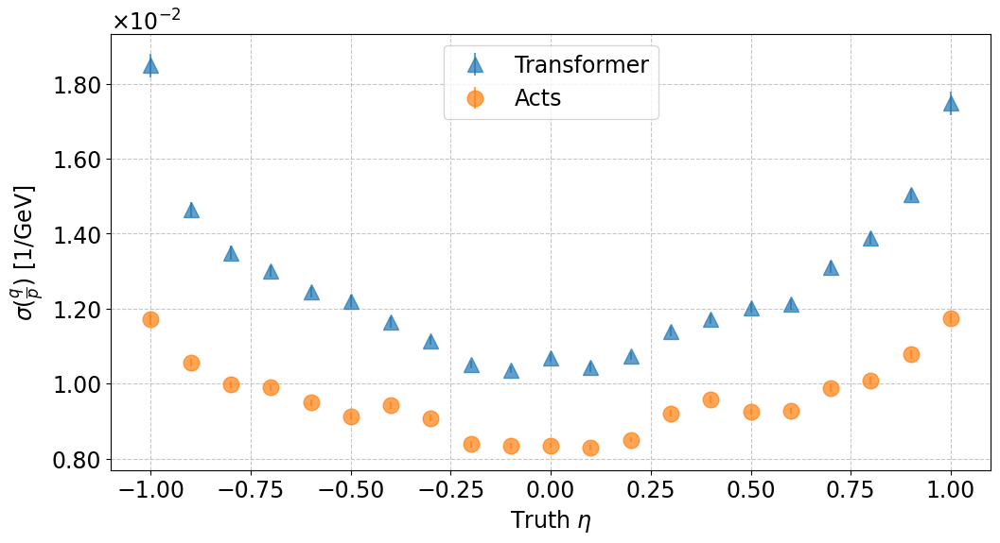

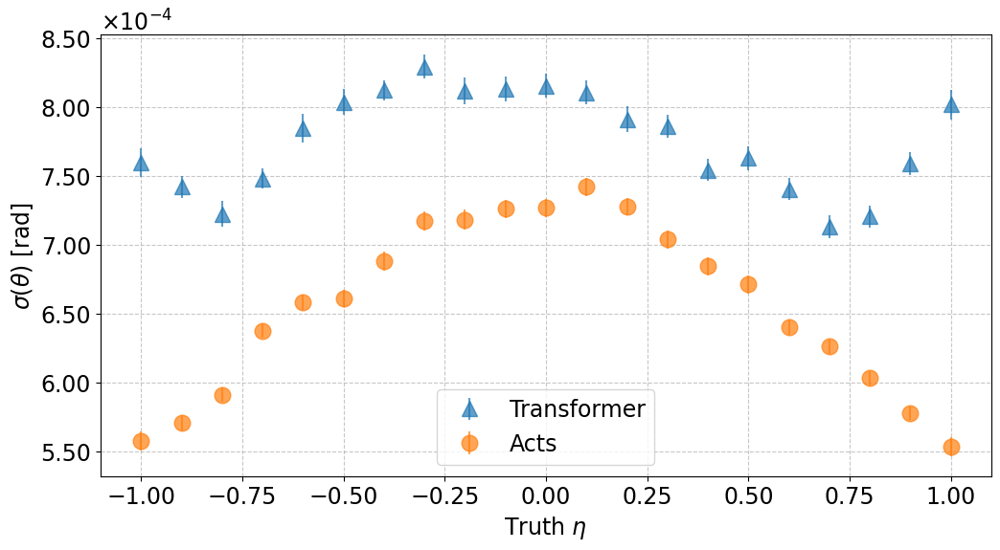

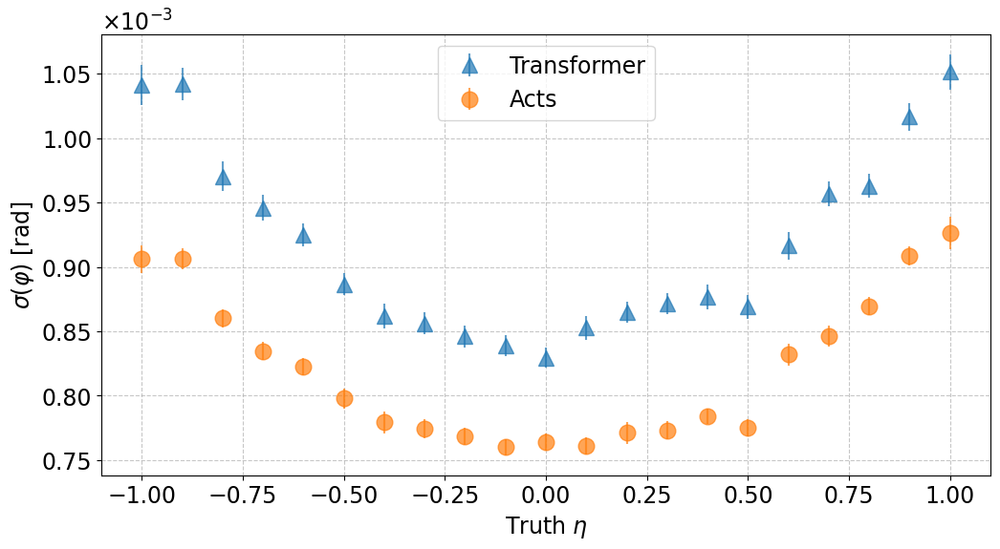

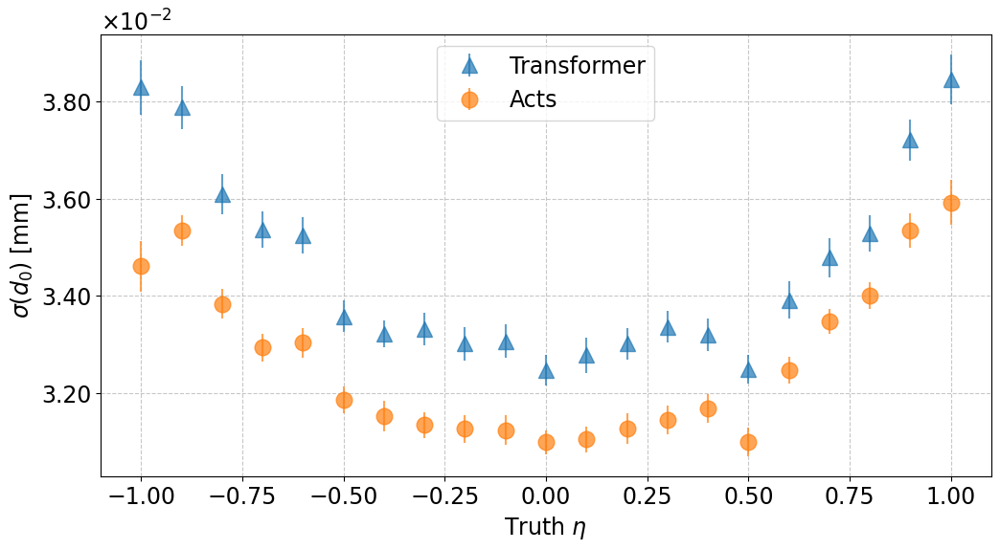

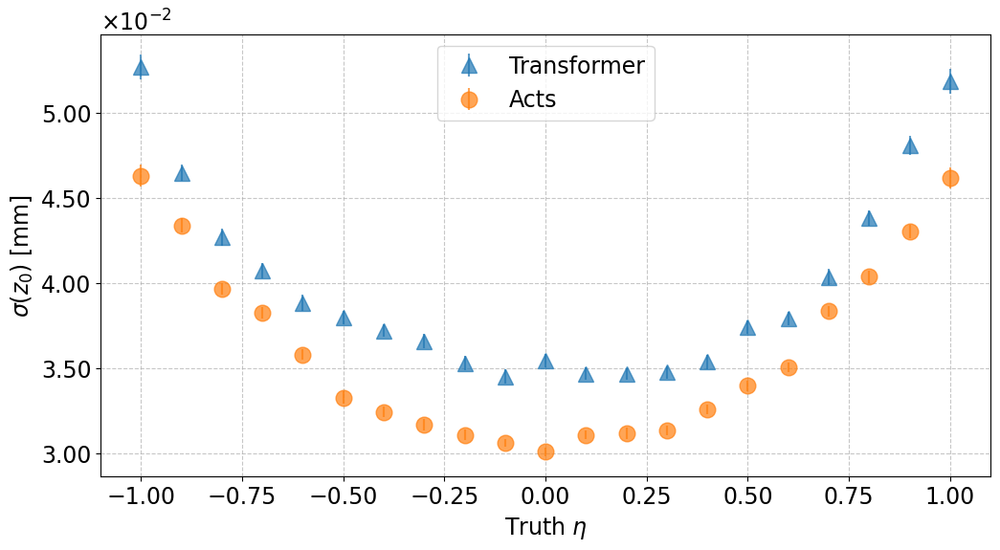

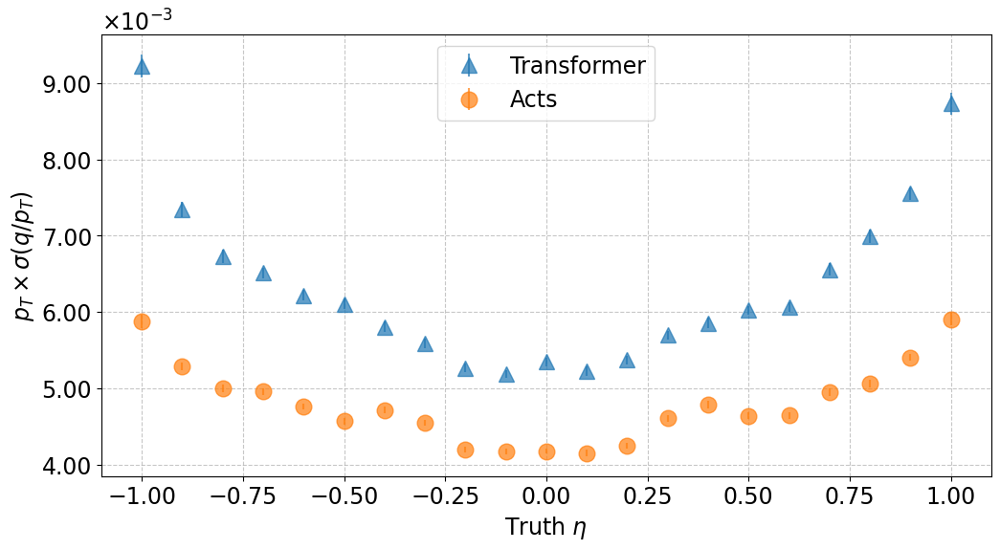

In [37]:
plot_resolutions(model_data_bins, output_dir, bin_centers, skip_measurements=False, xlabel="peta", skip_truth_hits=True)

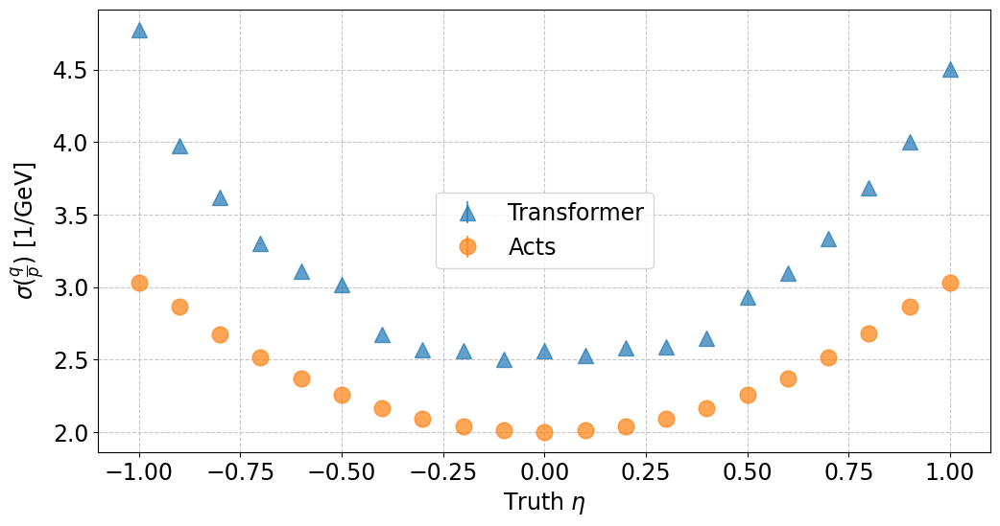

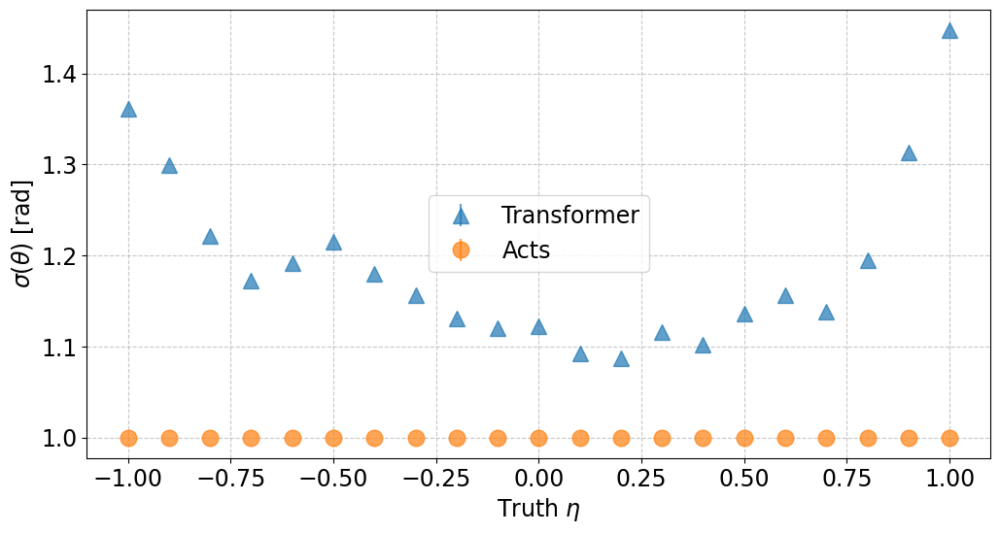

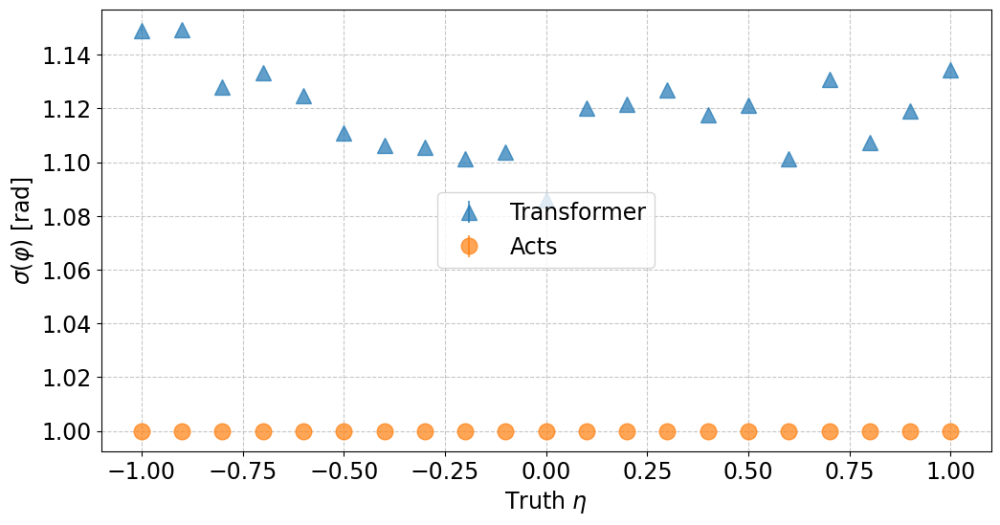

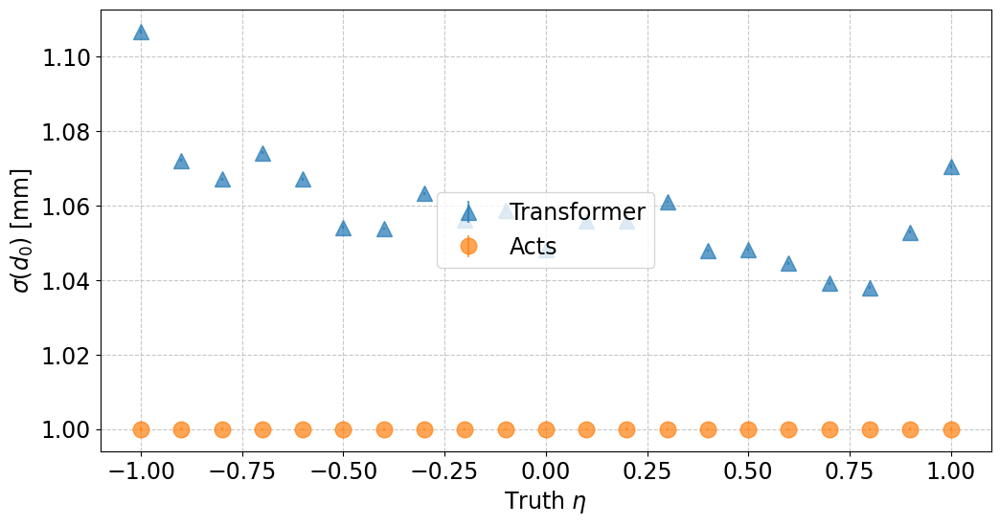

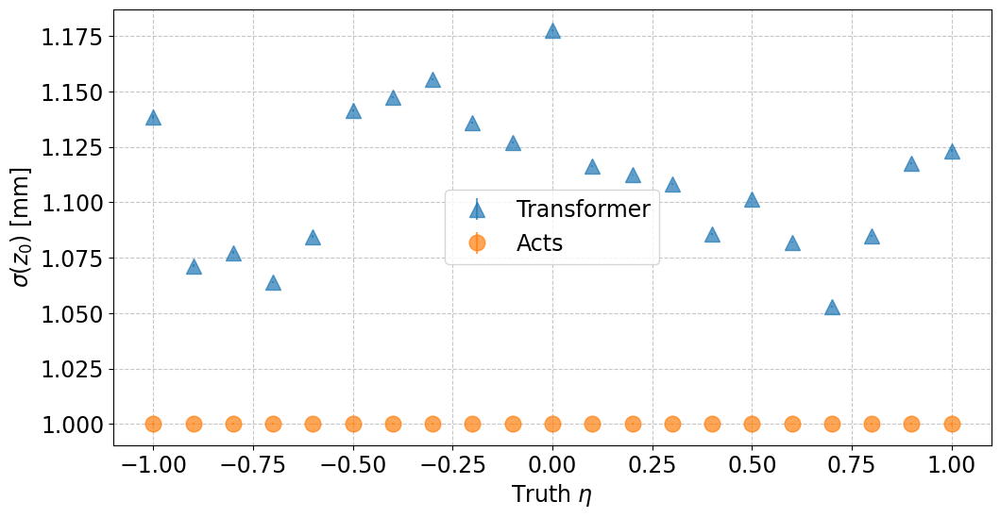

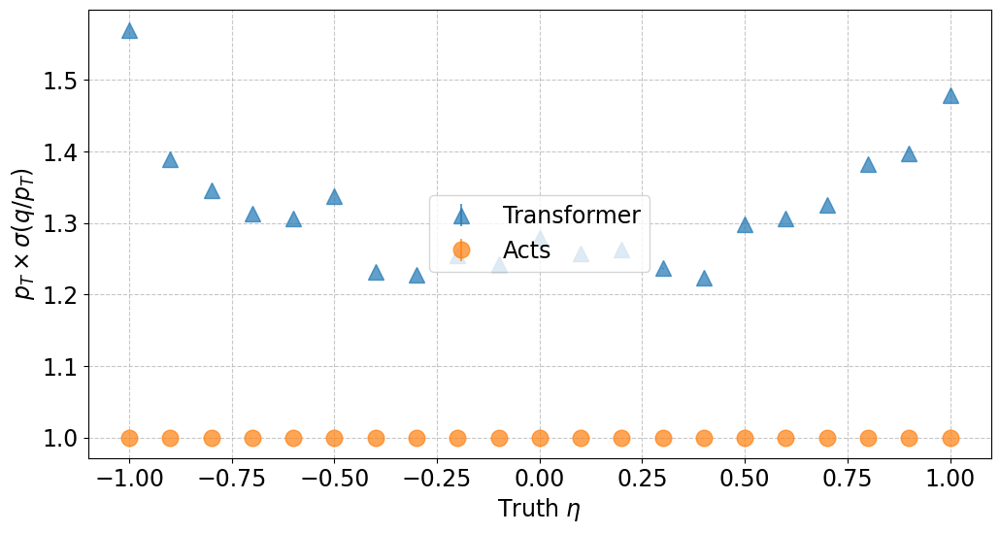

In [38]:
plot_ratios(model_data_bins, output_dir, bin_centers, reference_model="ACTS_Tracks", xlabel="peta", skip_truth_hits=True)

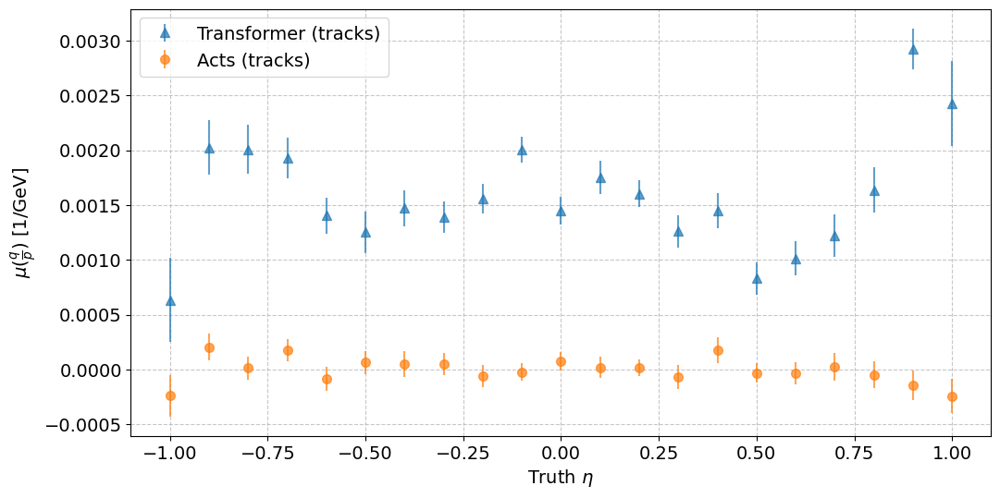

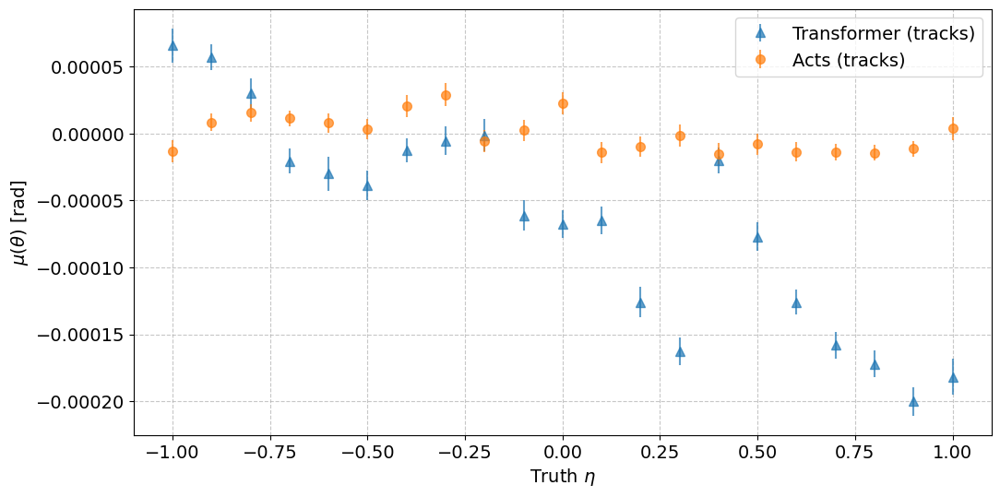

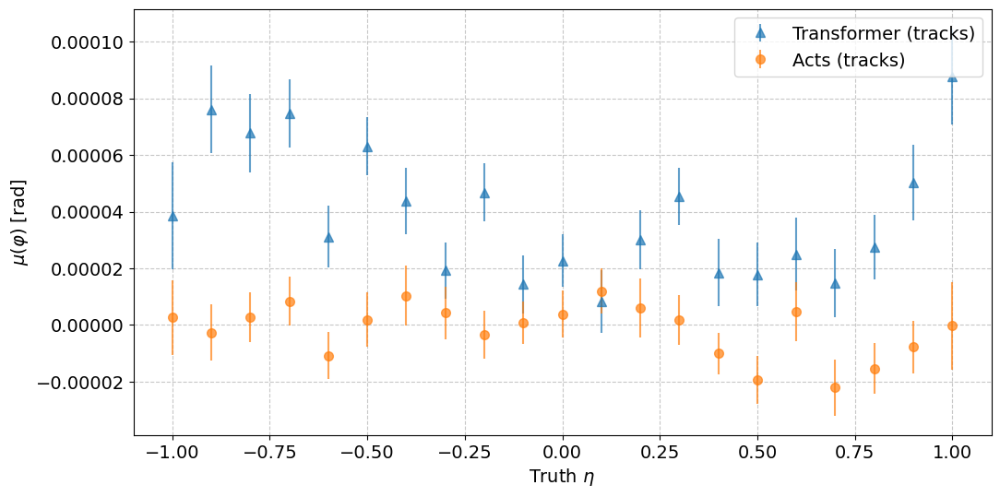

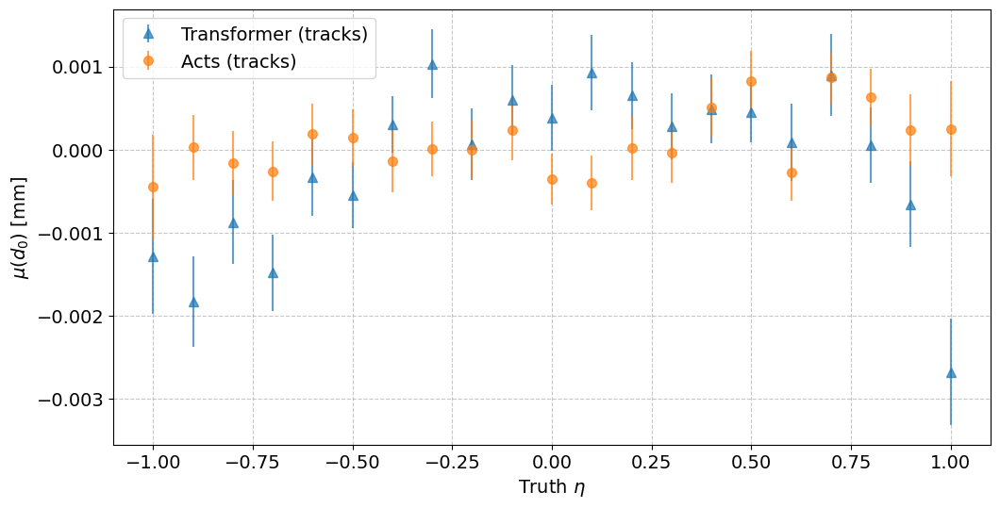

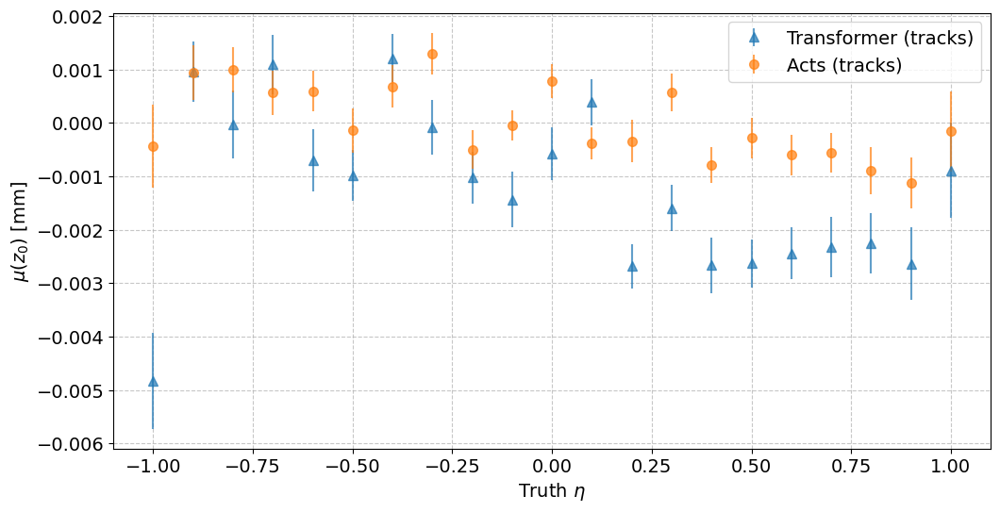

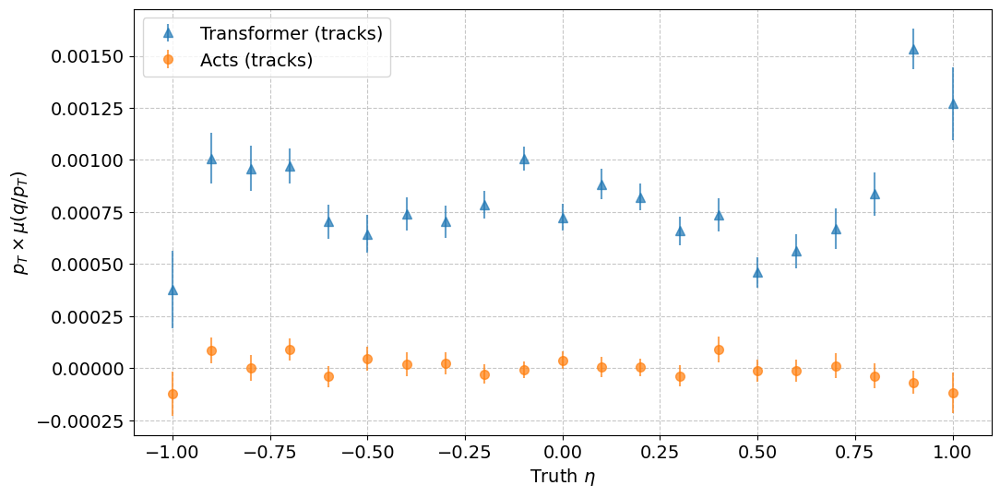

In [39]:
plot_bias(model_data_bins, output_dir, bin_centers, skip_measurements=False, xlabel="peta", skip_truth_hits=True)

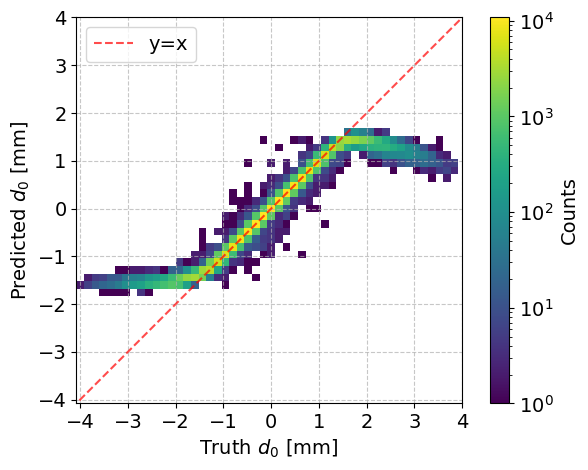

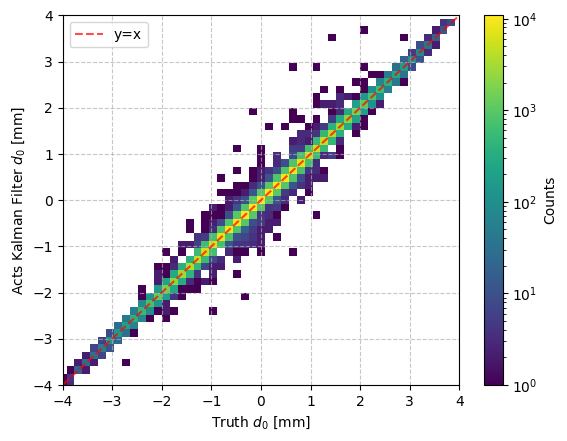

In [40]:
# plot d0 pred vs d0 truth 2D histogram
fontsize = 14
xmin, xmax = all_events_tracks["d0_truth"].min(), all_events_tracks["d0_truth"].max()
xmin = min(xmin, -xmax)
xmax = max(-xmin, xmax)
bins = [np.arange(xmin - (xmax - xmin) / 100, xmax + (xmax - xmin) / 100, (xmax - xmin) / 50), np.arange(xmin - (xmax - xmin) / 100, xmax + (xmax - xmin) / 100, (xmax - xmin) / 50)]
plt.figure()#figsize=(6, 6))
# plt.title("d0 Transformer Prediction vs Truth", fontsize=16)
# Log scale the color scale
import matplotlib.colors as colors
plt.hist2d(all_events_tracks["d0_truth"], all_events_tracks["d0_pred_measurement"], bins=bins, cmap="viridis", norm=colors.LogNorm())
plt.xlabel("Truth $d_0$ [mm]", fontsize=fontsize)
plt.ylabel("Predicted $d_0$ [mm]", fontsize=fontsize)
clb = plt.colorbar(label='Counts', norm=colors.LogNorm())
if fontsize is not None:
    clb.ax.tick_params(labelsize=fontsize)
    # clb.ax.set_label(zlabel, **kwargs)
    # Set the label size for the colorbar
    # print matplotlib.__version__
    import matplotlib
    if matplotlib.__version__ >= "3.7":
        clb.ax.xaxis.label.set_size(fontsize)
        clb.ax.yaxis.label.set_size(fontsize)
    else:
        clb.ax.xaxis.label.set_fontsize(fontsize)
        clb.ax.yaxis.label.set_fontsize(fontsize)
    # Set tick sizes
    clb.ax.tick_params(axis='both', which='major', labelsize=fontsize)
# plt.xlim(xmin, xmax)
# plt.ylim(xmin, xmax)
if fontsize is not None:
    plt.tick_params(axis="both", which="major", labelsize=fontsize)
# Add a diagonal line
max_val = max(all_events_tracks["d0_truth"].max(), all_events_tracks["d0_pred_measurement"].max()) + (xmax - xmin) / 100
min_val = min(all_events_tracks["d0_truth"].min(), all_events_tracks["d0_pred_measurement"].min()) - (xmax - xmin) / 100
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--", label="y=x", alpha=0.7)
plt.legend(fontsize=fontsize)
plt.grid(True, linestyle="--", alpha=0.7)

# Square plot
plt.gca().set_aspect('equal', adjustable='box')
# Make sure both axes have the same ticks
plt.xticks(np.linspace(xmin, xmax, 9))
plt.yticks(np.linspace(xmin, xmax, 9))
plt.tight_layout()
plt.savefig(output_dir / "d0_prediction_vs_truth.png", format="png", bbox_inches='tight')
plt.savefig(output_dir / "d0_prediction_vs_truth.svg", format="svg", bbox_inches='tight')

plt.show()
plt.figure()#figsize=(6, 6))
# plt.title("d0 ACTS Prediction vs Truth", fontsize=16)
# plot acts d0 
plt.hist2d(all_events_tracks["d0_truth"], all_events_tracks["eLOC0_fit"], bins=bins, cmap="viridis", norm=colors.LogNorm())
plt.colorbar(label='Counts', norm=colors.LogNorm())
# Add a diagonal line
max_val = max(all_events_tracks["d0_truth"].max(), all_events_tracks["eLOC0_fit"].max())
min_val = min(all_events_tracks["d0_truth"].min(), all_events_tracks["eLOC0_fit"].min())
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--", label="y=x", alpha=0.7)
plt.legend()
plt.grid(True, linestyle="--", alpha=0.7)
# plt.tight_layout(rect=[0, 0.03, 1, 0.95])
# plt.savefig(output_dir / "d0_prediction_vs_truth.png", format="png")
plt.xlabel("Truth $d_0$ [mm]")
plt.ylabel("Acts Kalman Filter $d_0$ [mm]")
plt.xlim(xmin, xmax)
plt.ylim(xmin, xmax)
plt.show()

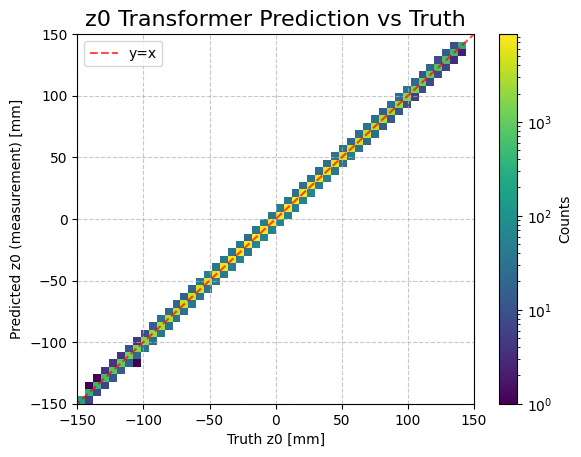

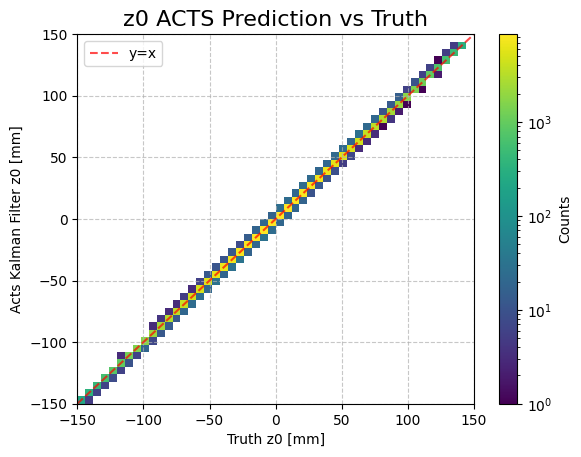

In [41]:
# plot z0 pred vs z0 truth 2D histogram
xmin, xmax = all_events_tracks["z0_truth"].min(), all_events_tracks["z0_truth"].max()
xmin = min(xmin, -xmax)
xmax = max(-xmin, xmax)
bins = [np.arange(xmin, xmax, (xmax - xmin) / 50), np.arange(xmin, xmax, (xmax - xmin) / 50)]
plt.figure()#figsize=(6, 6))
plt.title("z0 Transformer Prediction vs Truth", fontsize=16)
# Log scale the color scale
import matplotlib.colors as colors
plt.hist2d(all_events_tracks["z0_truth"], all_events_tracks["z0_pred_measurement"], bins=bins, cmap="viridis", norm=colors.LogNorm())
plt.xlabel("Truth z0 [mm]")
plt.ylabel("Predicted z0 (measurement) [mm]")
plt.colorbar(label='Counts', norm=colors.LogNorm())
plt.xlim(xmin, xmax)
plt.ylim(xmin, xmax)
# Add a diagonal line
max_val = max(all_events_tracks["z0_truth"].max(), all_events_tracks["z0_pred_measurement"].max())
min_val = min(all_events_tracks["z0_truth"].min(), all_events_tracks["z0_pred_measurement"].min())
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--", label="y=x", alpha=0.7)
plt.legend()
plt.grid(True, linestyle="--", alpha=0.7)
# plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()
plt.figure()#figsize=(6, 6))
plt.title("z0 ACTS Prediction vs Truth", fontsize=16)
# plot acts z0
plt.hist2d(all_events_tracks["z0_truth"], all_events_tracks["eLOC1_fit"], bins=bins, cmap="viridis", norm=colors.LogNorm())
plt.colorbar(label='Counts', norm=colors.LogNorm())
# Add a diagonal line
max_val = max(all_events_tracks["z0_truth"].max(), all_events_tracks["eLOC1_fit"].max())
min_val = min(all_events_tracks["z0_truth"].min(), all_events_tracks["eLOC1_fit"].min())
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--", label="y=x", alpha=0.7)
plt.legend()
plt.grid(True, linestyle="--", alpha=0.7)
# plt.tight_layout(rect=[0, 0.03, 1, 0.95])
# plt.savefig(output_dir / "d0_prediction_vs_truth.png", format="png")
plt.xlabel("Truth z0 [mm]")
plt.ylabel("Acts Kalman Filter z0 [mm]")
plt.xlim(xmin, xmax)
plt.ylim(xmin, xmax)
plt.show()

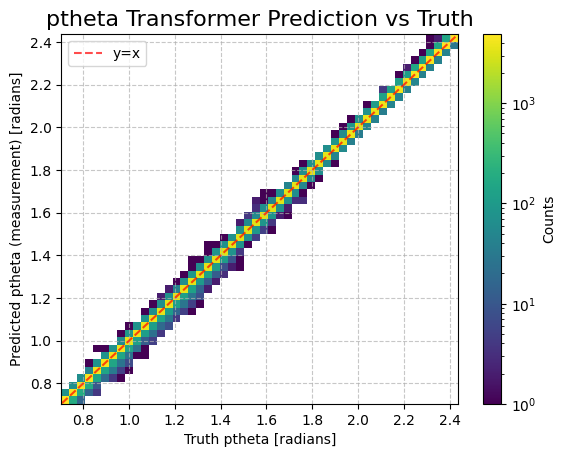

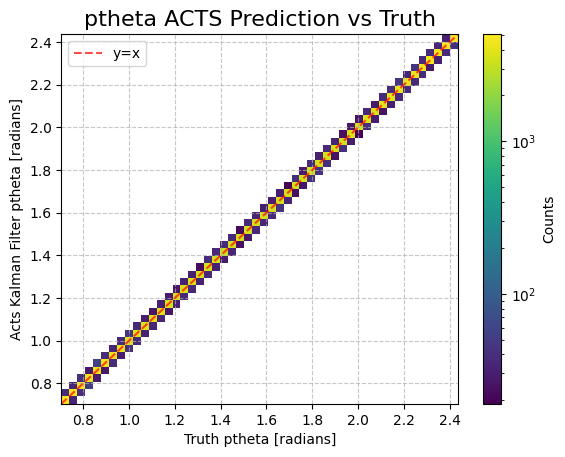

In [42]:
# plot ptheta pred vs ptheta truth 2D histogram
xmin, xmax = all_events_tracks["ptheta_truth"].min(), all_events_tracks["ptheta_truth"].max()
# xmin = min(xmin, -xmax)
# xmax = max(-xmin, xmax)
bins = [np.arange(xmin, xmax, (xmax - xmin) / 50), np.arange(xmin, xmax, (xmax - xmin) / 50)]
plt.figure()#figsize=(6, 6))
plt.title("ptheta Transformer Prediction vs Truth", fontsize=16)
# Log scale the color scale
import matplotlib.colors as colors
plt.hist2d(all_events_tracks["ptheta_truth"], all_events_tracks["ptheta_pred_measurement"], bins=bins, cmap="viridis", norm=colors.LogNorm())
plt.xlabel("Truth ptheta [radians]")
plt.ylabel("Predicted ptheta (measurement) [radians]")
plt.colorbar(label='Counts', norm=colors.LogNorm())
plt.xlim(xmin, xmax)
plt.ylim(xmin, xmax)
# Add a diagonal line
max_val = max(all_events_tracks["ptheta_truth"].max(), all_events_tracks["ptheta_pred_measurement"].max())
min_val = min(all_events_tracks["ptheta_truth"].min(), all_events_tracks["ptheta_pred_measurement"].min())
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--", label="y=x", alpha=0.7)
plt.legend()
plt.grid(True, linestyle="--", alpha=0.7)
# plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()
plt.figure()#figsize=(6, 6))
plt.title("ptheta ACTS Prediction vs Truth", fontsize=16)
# plot acts ptheta
plt.hist2d(all_events_tracks["ptheta_truth"], all_events_tracks["eTHETA_fit"], bins=bins, cmap="viridis", norm=colors.LogNorm())
plt.colorbar(label='Counts', norm=colors.LogNorm())
# Add a diagonal line
max_val = max(all_events_tracks["ptheta_truth"].max(), all_events_tracks["eTHETA_fit"].max())
min_val = min(all_events_tracks["ptheta_truth"].min(), all_events_tracks["eTHETA_fit"].min())
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--", label="y=x", alpha=0.7)
plt.legend()
plt.grid(True, linestyle="--", alpha=0.7)
# plt.tight_layout(rect=[0, 0.03, 1, 0.95])
# plt.savefig(output_dir / "d0_prediction_vs_truth.png", format="png")
plt.xlabel("Truth ptheta [radians]")
plt.ylabel("Acts Kalman Filter ptheta [radians]")
plt.xlim(xmin, xmax)
plt.ylim(xmin, xmax)
plt.show()

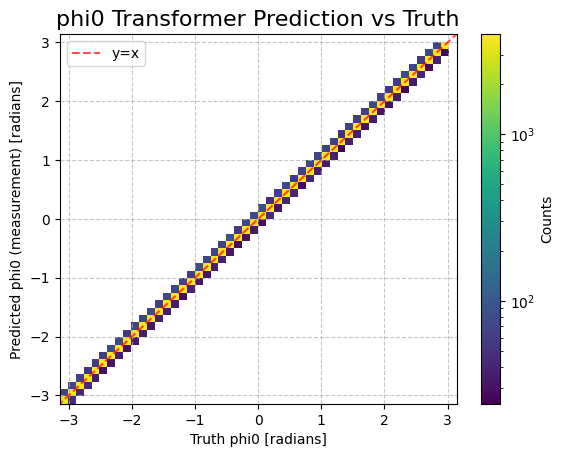

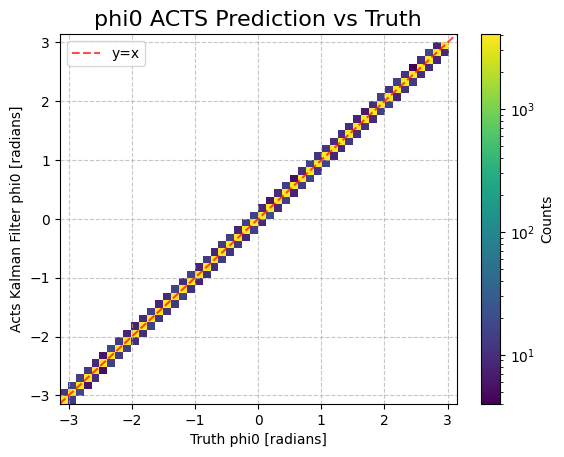

In [43]:
# plot phi0 pred vs phi0 truth 2D histogram
xmin, xmax = all_events_tracks["phi0_truth"].min(), all_events_tracks["phi0_truth"].max()
# xmin = min(xmin, -xmax)
# xmax = max(-xmin, xmax)
bins = [np.arange(xmin, xmax, (xmax - xmin) / 50), np.arange(xmin, xmax, (xmax - xmin) / 50)]
plt.figure()#figsize=(6, 6))
plt.title("phi0 Transformer Prediction vs Truth", fontsize=16)
# Log scale the color scale
import matplotlib.colors as colors
plt.hist2d(all_events_tracks["phi0_truth"], all_events_tracks["phi0_pred_measurement"], bins=bins, cmap="viridis", norm=colors.LogNorm())
plt.xlabel("Truth phi0 [radians]")
plt.ylabel("Predicted phi0 (measurement) [radians]")
plt.colorbar(label='Counts', norm=colors.LogNorm())
plt.xlim(xmin, xmax)
plt.ylim(xmin, xmax)
# Add a diagonal line
max_val = max(all_events_tracks["phi0_truth"].max(), all_events_tracks["phi0_pred_measurement"].max())
min_val = min(all_events_tracks["phi0_truth"].min(), all_events_tracks["phi0_pred_measurement"].min())
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--", label="y=x", alpha=0.7)
plt.legend()
plt.grid(True, linestyle="--", alpha=0.7)
# plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()
plt.figure()#figsize=(6, 6))
plt.title("phi0 ACTS Prediction vs Truth", fontsize=16)
# plot acts phi0
plt.hist2d(all_events_tracks["phi0_truth"], all_events_tracks["ePHI_fit"], bins=bins, cmap="viridis", norm=colors.LogNorm())
plt.colorbar(label='Counts', norm=colors.LogNorm())
# Add a diagonal line
max_val = max(all_events_tracks["phi0_truth"].max(), all_events_tracks["ePHI_fit"].max())
min_val = min(all_events_tracks["phi0_truth"].min(), all_events_tracks["ePHI_fit"].min())
plt.plot([min_val, max_val], [min_val, max_val], color="red", linestyle="--", label="y=x", alpha=0.7)
plt.legend()
plt.grid(True, linestyle="--", alpha=0.7)
# plt.tight_layout(rect=[0, 0.03, 1, 0.95])
# plt.savefig(output_dir / "d0_prediction_vs_truth.png", format="png")
plt.xlabel("Truth phi0 [radians]")
plt.ylabel("Acts Kalman Filter phi0 [radians]")
plt.xlim(xmin, xmax)
plt.ylim(xmin, xmax)
plt.show()

# Truth Particle Hits

In [44]:
from copy import deepcopy

all_events_particles_list = []
all_events_processed = []
all_hits_list = []
dataset_wrapper.test_dataset.truth_tracks = True
for i in range(len(dataset_wrapper.test_dataset.available_events)):
    event = dataset_wrapper.test_dataset.available_events[i]
    # print(f"Loading event {event}")
    event_files = dataset_wrapper.test_dataset._load_event(event)
    print(event_files[0].columns)
    print(dataset_wrapper.test_dataset.__dict__)
    processed_event = dataset_wrapper.test_dataset._preprocess_groups(
        event_files=deepcopy(event_files)
    )

    processed_event = list(processed_event)
    # Group the processed_event into one dataframe
    processed_event = pd.concat(processed_event, ignore_index=True)
    processed_event = processed_event.rename(columns={"peta": "eta"})
    particle_columns = [
        "vx",
        "vy",
        "vz",
        "vt",
        "px",
        "py",
        "pz",
        "m",
        "q",
        "pT",
        "eta",
        "qopT",
        "qpT",
        "phi0",
        "ptheta",
        "d0",
        "z0",
        "q_over_p",
    ]
    processed_event = processed_event.rename(
        columns=lambda x: (f"{x}_truth" if x in particle_columns else x)
    )
    processed_event = processed_event.rename(
        columns={"n_hits_group": "n_particle_hits"}
    )

    # Keep only one particle_id per event_id
    particles_processed = processed_event.drop_duplicates(
        subset=["event_id", "particle_id"], keep="first"
    )
    print(f"{particles_processed.columns = }")
    particles_processed = particles_processed[
        [
            "particle_id",
            "particle_type",
            "process",
            "vx_truth",
            "vy_truth",
            "vz_truth",
            "vt_truth",
            "px_truth",
            "py_truth",
            "pz_truth",
            "m_truth",
            "q_truth",
            "event_id",
            "pT_truth",
            "eta_truth",
            # "qopT_truth",
            # "qpT_truth",
            "phi0_truth",
            "ptheta_truth",
            "q_over_p_truth",
            "d0_truth",
            "z0_truth",
            "n_particle_hits",
        ]
    ].reset_index(drop=True)

    particles = particles_processed

    # Merge with hits dataframe
    hits = processed_event

    # # Compare dphi and dphi_offset
    # print("Comparing dphi and dphi_offset")
    # print(hits[["dphi", "dphi_offset"]])
    # print(hits[["dphi", "dphi_offset"]].describe())
    # print(hits[["dphi", "dphi_offset"]].info())
    # print(hits["dphi"].equals(hits["dphi_offset"]))
    # # Make sure "dphi" and "dphi_offset" are the same
    # assert (
    #     hits["dphi"].values == hits["dphi_offset"].values
    # ).all(), "There are mismatched values in the dphi and dphi_offset columns of the hits dataframe"

    # Make sure there is no NaN in the tx, ty, tz columns of the hits dataframe
    assert (
        hits["tx"].notna().all()
    ), "There are NaN values in the tx column of the hits dataframe"
    assert (
        hits["ty"].notna().all()
    ), "There are NaN values in the ty column of the hits dataframe"
    assert (
        hits["tz"].notna().all()
    ), "There are NaN values in the tz column of the hits dataframe"
    # Count the number of duplicates in the hits dataframe
    duplicates = hits.duplicated(subset=["event_id", "hit_id"], keep="first")
    n_duplicates = duplicates.sum()
    if n_duplicates > 0:
        print(
            f"Warning: There are {n_duplicates} duplicates in the hits dataframe for event {event}"
        )
    #     # Print the duplicates
    #     all_duplicates = hits.duplicated(subset=[["event_id", "hit_id"]], keep=False)
    #     duplicates_hits = hits[all_duplicates]
    #     # Print the duplicates grouped by hit_id
    #     duplicates_grouped = duplicates_hits.groupby([["event_id", "hit_id"]])
    #     # Show ["hit_id", "particle_id", "particle_id_track", "track_id"] for each group
    #     # Set the index to hit_id
    #     duplicates_summary = duplicates_grouped[
    #         ["event_id", "particle_id", "particle_id_track", "track_id"]
    #     ].apply(lambda x: x)
    #     # Print the summary
    #     print(duplicates_summary)

    #     print(f"Number of duplicates: {n_duplicates}")

    # Reset particles index
    particles = particles.reset_index(drop=True)

    # Add the event to the list
    all_events_particles_list.append(particles)
    # all_events_processed.append(processed_event)
    all_hits_list.append(hits)
    print(f"{particles.shape[0] = }")
    print(f"{len(hits['particle_id'].unique()) = }")
    print(f"{hits.shape = }")
    # assert particles.shape[0] == len(hits[["event_id", "particle_id"]].unique())
    # break
    # if i > 10:
    #     break

# Concatenate all the events
all_events_particles = pd.concat(all_events_particles_list, ignore_index=True)
all_events_hits = pd.concat(all_hits_list, ignore_index=True)
# 4 min 50.2 seconds
# 2 min 34.1 seconds
# 1 min 36.1 seconds without sorting and scattering cut

AssertionError: Expected exactly one particles file, got 0

In [ ]:
print(all_events_particles.columns)
del all_events_particles["qopT_pred"]
del all_events_particles["qopT_pred_x"]
del all_events_particles["qopT_pred_y"]
del all_events_particles["pz_pred"]
del all_events_particles["pz_pred_x"]
del all_events_particles["pz_pred_y"]
print(all_events_particles.columns)

Index(['particle_id', 'particle_type', 'process', 'vx_truth', 'vy_truth',
       'vz_truth', 'vt_truth', 'px_truth', 'py_truth', 'pz_truth', 'm_truth',
       'q_truth', 'event_id', 'pT_truth', 'eta_truth', 'phi0_truth',
       'ptheta_truth', 'q_over_p_truth', 'd0_truth', 'z0_truth',
       'n_particle_hits', 'qopT_pred_x', 'pz_pred_x', 'qopT_pred_y',
       'pz_pred_y', 'qopT_pred', 'pz_pred'],
      dtype='object')
Index(['particle_id', 'particle_type', 'process', 'vx_truth', 'vy_truth',
       'vz_truth', 'vt_truth', 'px_truth', 'py_truth', 'pz_truth', 'm_truth',
       'q_truth', 'event_id', 'pT_truth', 'eta_truth', 'phi0_truth',
       'ptheta_truth', 'q_over_p_truth', 'd0_truth', 'z0_truth',
       'n_particle_hits'],
      dtype='object')


In [66]:
# save particle_id to csv
all_events_particles["particle_id"].to_csv(output_dir / "particle_ids_test.csv", index=False)
# load particle_id from csv
loaded_particle_ids = pd.read_csv(output_dir / "particle_ids_test.csv")
# compare
print(f"{all_events_particles['particle_id'].equals(loaded_particle_ids['particle_id']) = }")
# print differences
print(f"{np.max(np.abs(all_events_particles['particle_id'] - loaded_particle_ids['particle_id'])) = }")
# save loaded again
loaded_particle_ids.to_csv(output_dir / "particle_ids_test_loaded.csv", index=False)
# load again
loaded_particle_ids_again = pd.read_csv(output_dir / "particle_ids_test_loaded.csv")
# compare
print(f"{loaded_particle_ids_again['particle_id'].equals(loaded_particle_ids['particle_id']) = }")
# print differences
print(f"{np.max(np.abs(loaded_particle_ids_again['particle_id'] - loaded_particle_ids['particle_id'])) = }")

all_events_particles['particle_id'].equals(loaded_particle_ids['particle_id']) = False
np.max(np.abs(all_events_particles['particle_id'] - loaded_particle_ids['particle_id'])) = 0.0
loaded_particle_ids_again['particle_id'].equals(loaded_particle_ids['particle_id']) = True
np.max(np.abs(loaded_particle_ids_again['particle_id'] - loaded_particle_ids['particle_id'])) = 0


In [ ]:
# Load the model predictions from the file (if it exists)
# only [event, particle_id, q/p_T_pred, pz_pred] are saved
if output_dir.exists():
    model_predictions_file = output_dir / "model_predictions.csv"
    if model_predictions_file.exists():
        print(f"Loading model predictions from {model_predictions_file}")
        model_predictions = pd.read_csv(model_predictions_file, dtype={"event_id": "uint64", "particle_id": "uint64"})
        print(f"{model_predictions.columns = }")
        # Merge the model predictions with the all_events_particles dataframe
        all_events_particles = all_events_particles.merge(
            model_predictions,
            on=["event_id", "particle_id"],
            how="left", # Preserve original shape of dataframe
            # suffixes=("", "_pred_save"),
            validate="one_to_one",
        )
        print(f"{model_predictions.head()}")
        # There should be no missing values in the predictions
        for variable in model_predictions.columns:
            assert all_events_particles[variable].notna().all(), f"There are missing values in the {variable}. {all_events_particles[variable].isna().sum()} missing values."
        print(f"Model predictions loaded and merged with all_events_particles.")
    else:
        print(f"No model predictions found at {model_predictions_file}.")

No model predictions found at Results/ActsODD/rdphiz_n_hits_7_qopT_pz_POC_Acts_muons_root_eta_1_trained_ODD_full_odd_output_muons_2_splits_eta_1_measurements/model_predictions.csv.


In [46]:
for variable in config["output_variables"]:
    if f"{variable}_pred" in all_events_particles.columns:
        del all_events_particles[f"{variable}_pred"]

In [ ]:
# Sort for grouping
all_events_hits = all_events_hits.sort_values(["event_id", "particle_id", "tr"])

import numpy as np
import torch
from time import time

import torch
# from torch.nn.utils.rnn import pad_sequence

# def process_batch(hits_tensor_batch, mask_tensor_batch, batch_row_data, ml_model, config, rows):
#     """
#     Processes a batch of particles, performs model prediction, and appends results to `rows`.
#     This version includes padding to ensure all tensors have the same size.

#     Parameters:
#     - hits_tensor_batch: List of tensors containing input data for the batch.
#     - mask_tensor_batch: List of tensors containing mask data for the batch.
#     - batch_row_data: List containing the row data for each particle in the batch.
#     - ml_model: The machine learning model to use for predictions.
#     - config: Configuration dictionary with output variables.
#     - rows: List to append prediction results.

#     Returns:
#     - Updated `rows` list containing prediction results for the batch.
#     """

    
#     # Pad the sequences to ensure they have the same length in the second dimension
#     hits_tensor_batch_padded = pad_sequence(hits_tensor_batch, batch_first=True)
#     mask_tensor_batch_padded = pad_sequence(mask_tensor_batch, batch_first=True, padding_value=0)

#     # Model prediction
#     pred = ml_model(hits_tensor_batch_padded, mask=mask_tensor_batch_padded)

#     # Process the predictions
#     for i, row_data in enumerate(batch_row_data):
#         for j, col in enumerate(config["output_variables"]):
#             row_data[f"{col}_pred"] = pred[i, j].item()

#         # if "dphi0" in config["output_variables"]:
#         #     phi_offset = hits_tensor_batch[i][hits_tensor_batch[i][:, 1] == 0, 0].item()  # Assuming phi is at column index 1
#         #     row_data["phi0_pred"] = row_data["dphi0_pred"] + phi_offset
#         if "dphi0" in config["output_variables"]:
#             # Get the phi of the first hit
#             # phi_offset = hits_tensor_batch[i][hits_tensor_batch[i][:, 1] == 0, 0].item()  # Assuming phi is at column index 1
#             # row_data["phi0_pred"] = row_data["dphi0_pred"] + phi_offset
#             row_data["phi0_pred"] = row_data["dphi0_pred"] + row_data["phi_offset"]

#         rows.append(row_data)  # Append processed row

#     return rows


# Main loop for batching
batch_size = 64

if not all(f"{col}_pred" in all_events_particles.columns for col in config["output_variables"]):
    print("No model predictions found, running the model on the test dataset.")
    ml_model = models["MSE"]["model"]
    ml_model.eval()
    start_time = time()

    rows = []

    # Create empty dataframe for particle predictions
    particle_predictions = pd.DataFrame(columns=["event_id", "particle_id"] + [f"{col}_pred" for col in config["output_variables"]] + (["phi0_pred"] if "dphi0" in config["output_variables"] else []))

    matching_columns = [col for col in particle_predictions.columns if col in all_events_particles.columns]
    particle_predictions = particle_predictions.astype(all_events_particles.dtypes[matching_columns].to_dict())

    last_log = 0
    hits_groups = all_events_hits.groupby(["event_id", "particle_id"])

    processed_particles = 0
    progress_interval = 1000

    batch_hits_tensor = []
    batch_mask_tensor = []
    batch_row_data = []

    with torch.no_grad():
        for group_key, hits_sel in hits_groups:
            event, particle_id = group_key
            n_particle_hits = int(hits_sel["n_particle_hits"].values[0])

            assert len(hits_sel) == n_particle_hits, f"Particle {particle_id} in event {event} hit count mismatch"

            # Prepare input for model
            input_array = hits_sel[dataset_wrapper.test_dataset.input_variables].values
            hits_tensor = torch.tensor(input_array, dtype=torch.float32)
            mask_tensor = torch.ones(n_particle_hits, dtype=torch.bool)

            # Accumulate tensors for batch processing
            batch_hits_tensor.append(hits_tensor)
            batch_mask_tensor.append(mask_tensor)

            # Prepare row data
            row_data = {
                "event_id": event,
                "particle_id": particle_id,
            }
            if "dphi0" in config["output_variables"]:
                row_data["phi_offset"] = hits_sel.iloc[0]["tphi"]
                assert hits_sel.iloc[0]["dphi"] == 0, "First hit dphi is not zero after calculation."
            batch_row_data.append(row_data)

            # If batch is full, process the batch
            if len(batch_hits_tensor) >= batch_size:
                # Process batch using the helper function
                rows = process_batch(batch_hits_tensor, batch_mask_tensor, batch_row_data, ml_model, config, rows)

                # Clear batch lists after processing
                batch_hits_tensor = []
                batch_mask_tensor = []
                batch_row_data = []

            processed_particles += 1
            if processed_particles - last_log >= progress_interval:
                last_log = processed_particles
                elapsed = time() - start_time
                print(f"Progress: {processed_particles} / {len(all_events_particles)}")
                print(f"Time elapsed: {elapsed / processed_particles:.6f} seconds per track")

        # If any remaining particles in the last batch (less than batch_size)
        if len(batch_hits_tensor) > 0:
            rows = process_batch(batch_hits_tensor, batch_mask_tensor, batch_row_data, ml_model, config, rows)

    # Create the DataFrame from the rows collected during batching
    particle_predictions = pd.DataFrame(rows)

    # Save predictions
    if output_dir.exists():
        model_predictions_file = output_dir / "model_predictions.csv"
        print(f"Saving model predictions to {model_predictions_file}")
        particle_predictions.to_csv(model_predictions_file, index=False)

    # Merge the predictions with the original dataset
    all_events_particles = all_events_particles.merge(particle_predictions, on=["event_id", "particle_id"], how="left", validate="one_to_one")

# 2 min 8.4 seconds 64
# 1 min 59.6 seconds 128

NameError: name 'all_events_particles' is not defined

In [ ]:
# Set n_particle_hits type to int
all_events_particles["n_particle_hits"] = all_events_particles["n_particle_hits"].astype(int)

NameError: name 'all_events_particles' is not defined

Computing resolution bins for q_over_p


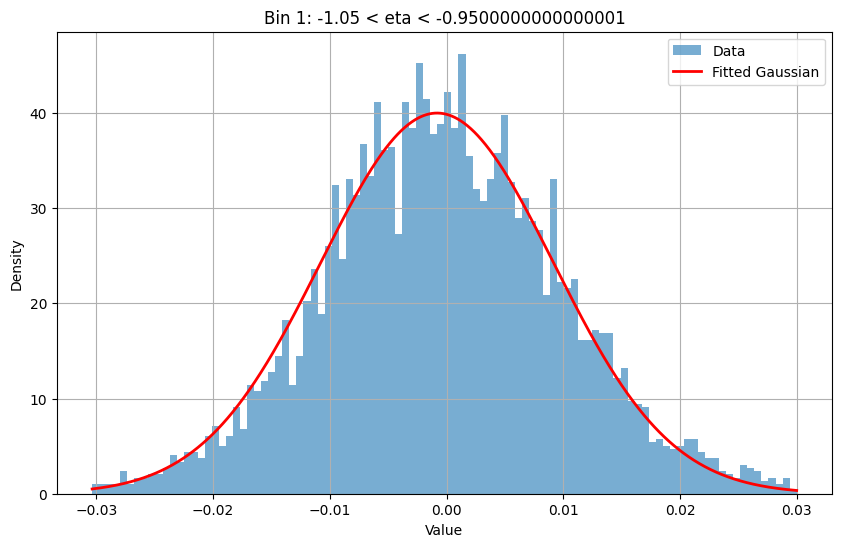

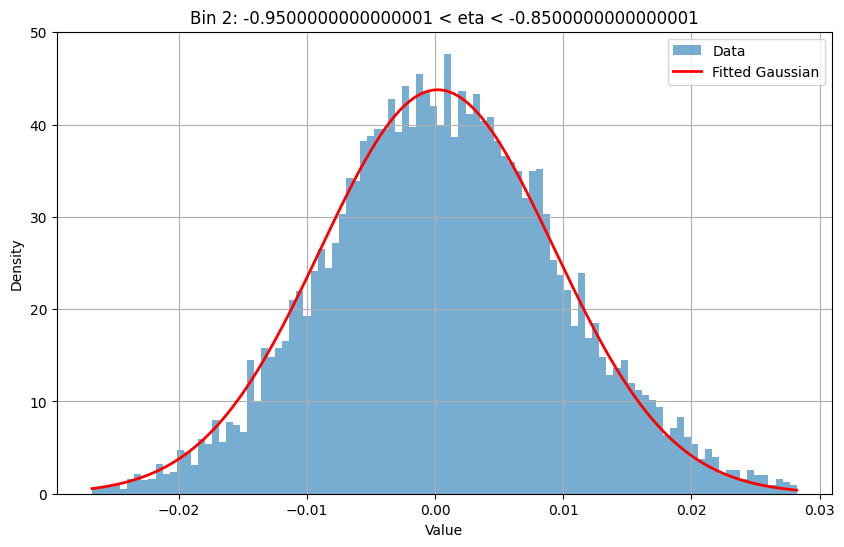

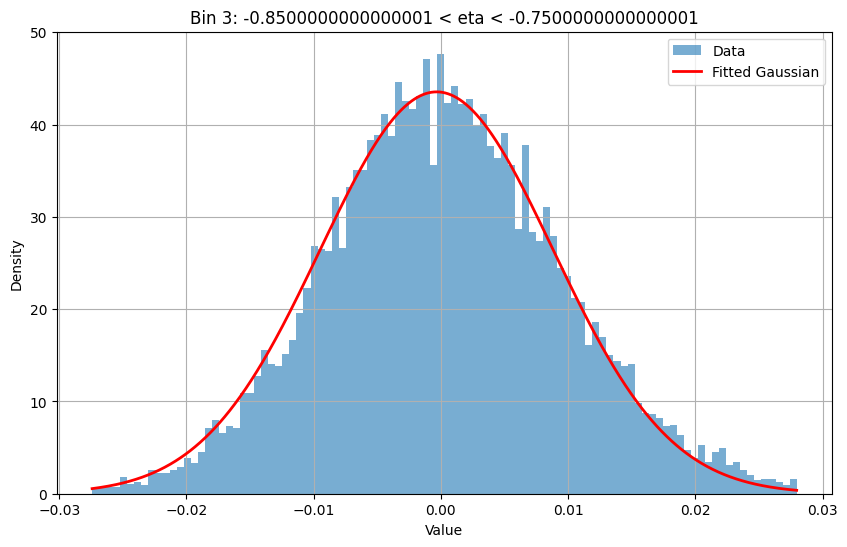

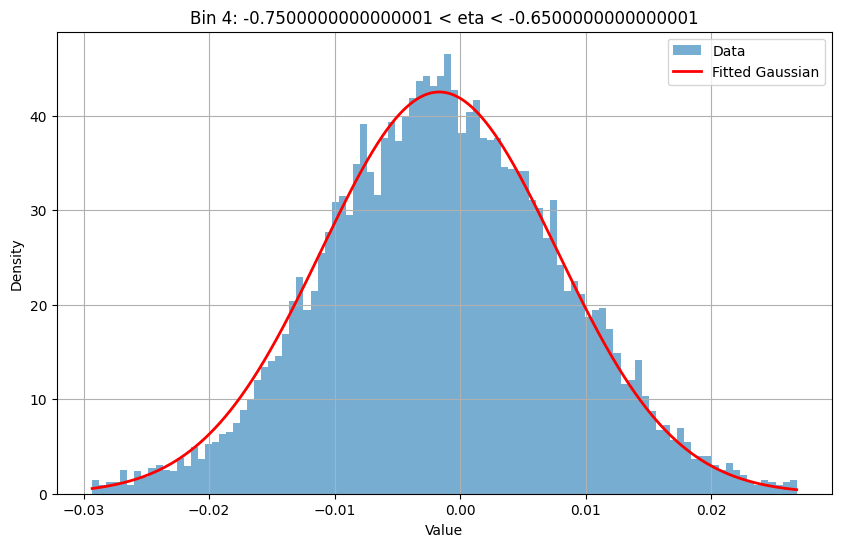

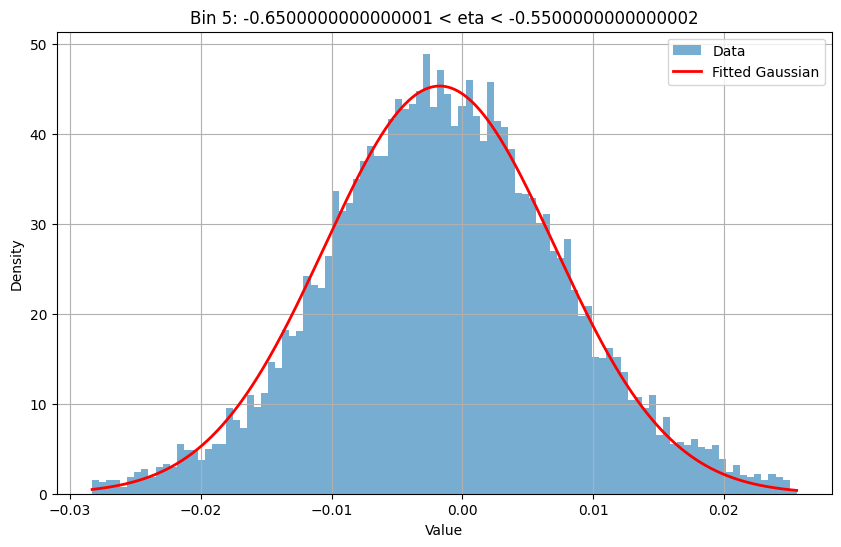

...

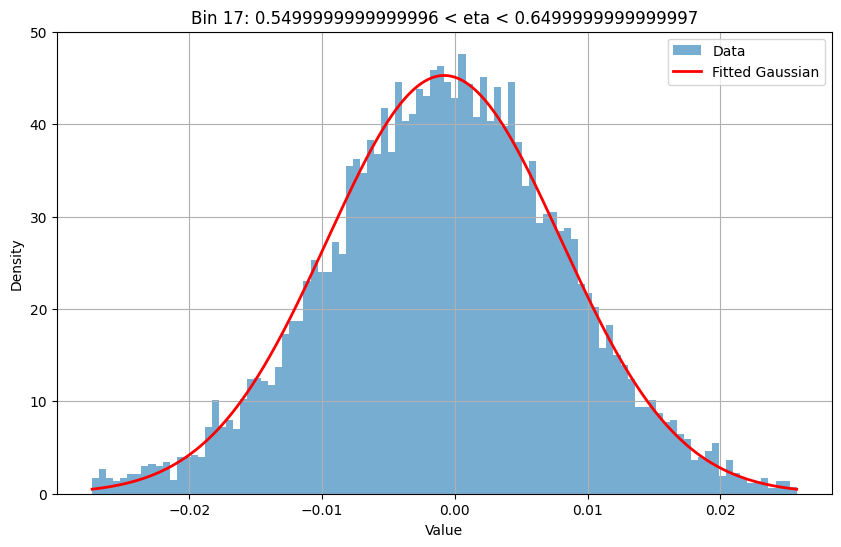

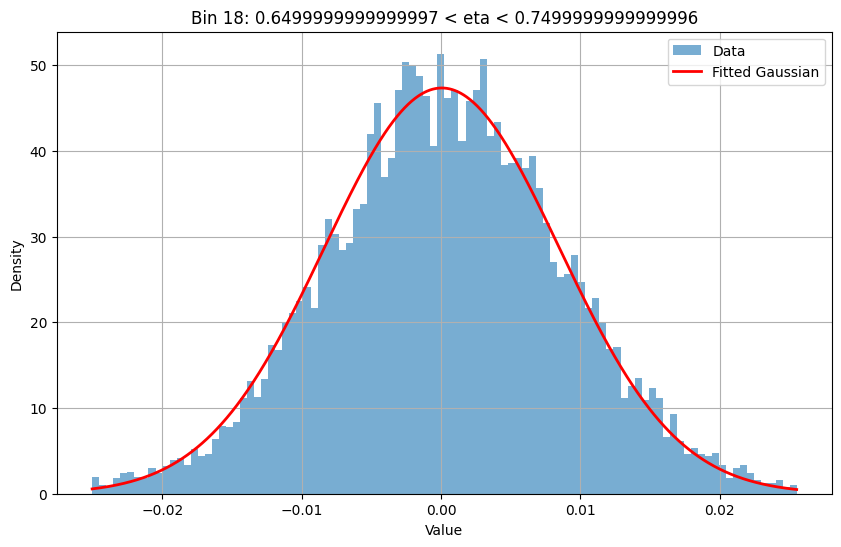

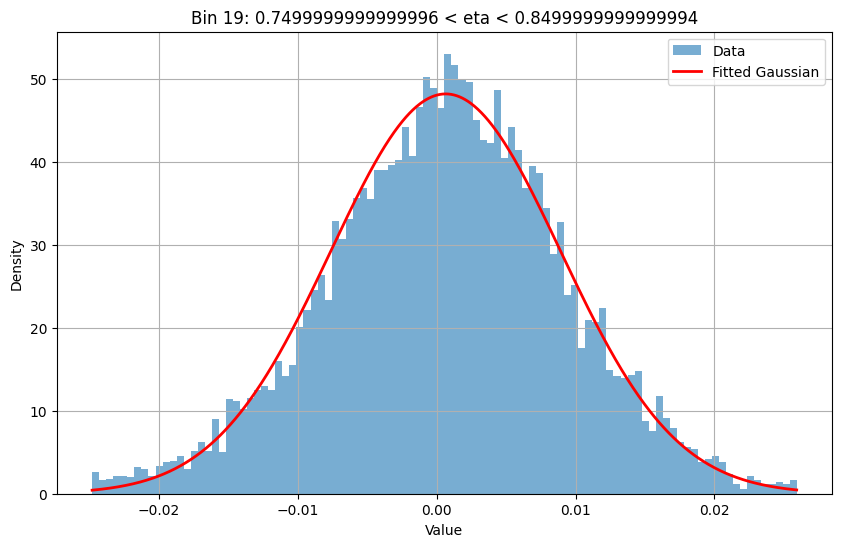

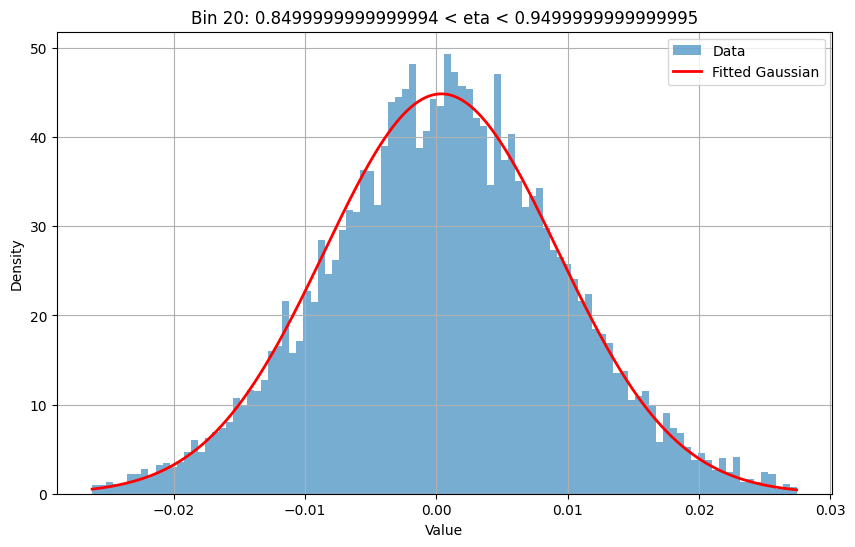

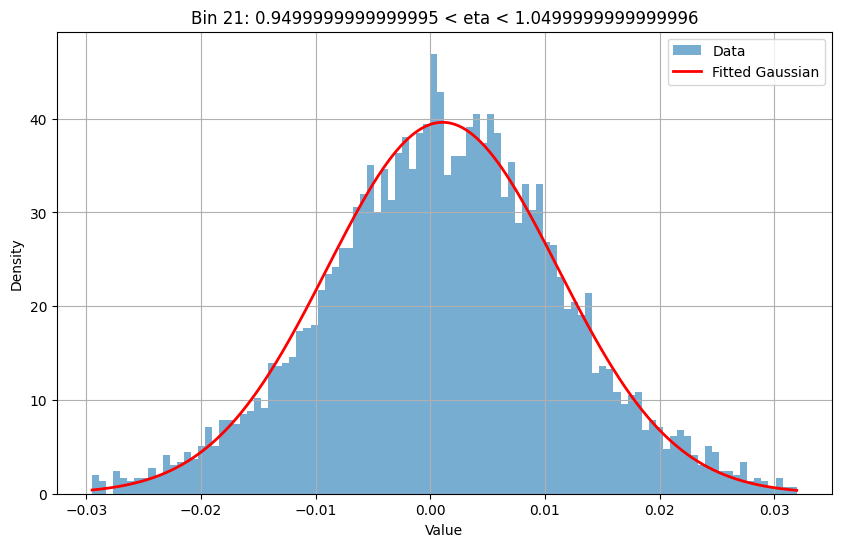

Computing resolution bins for ptheta


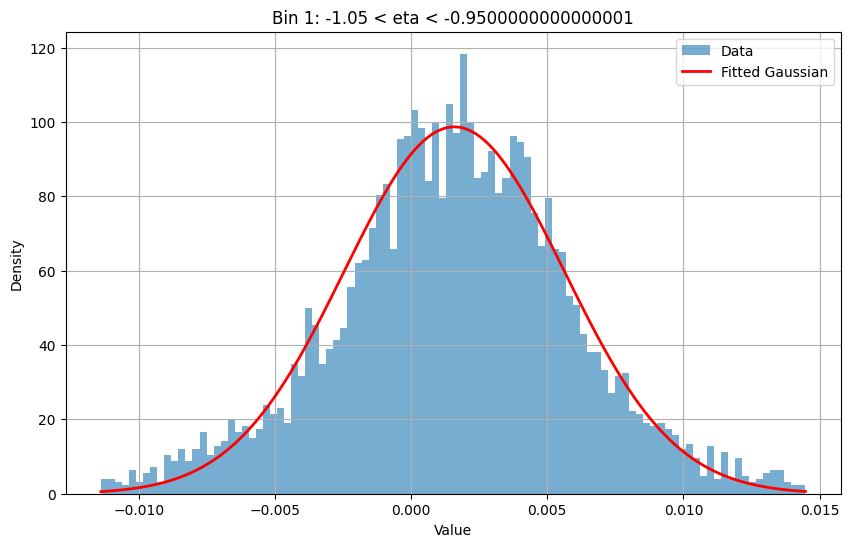

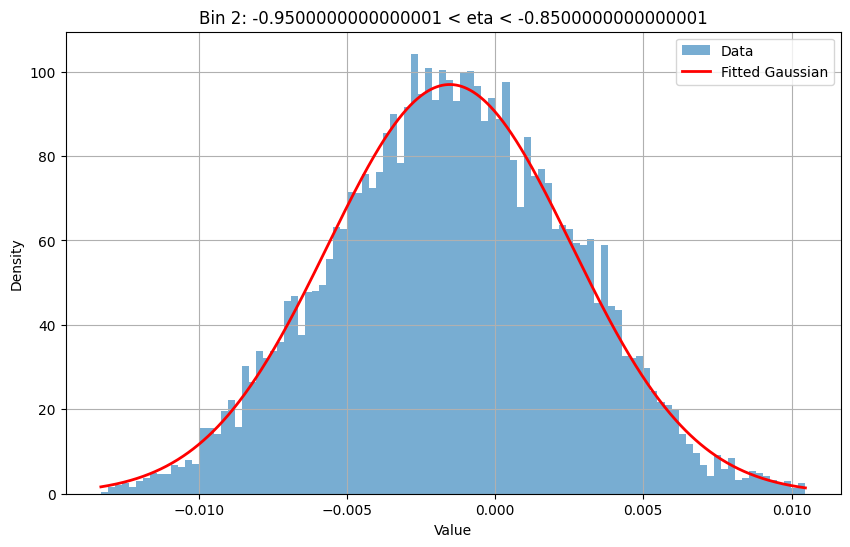

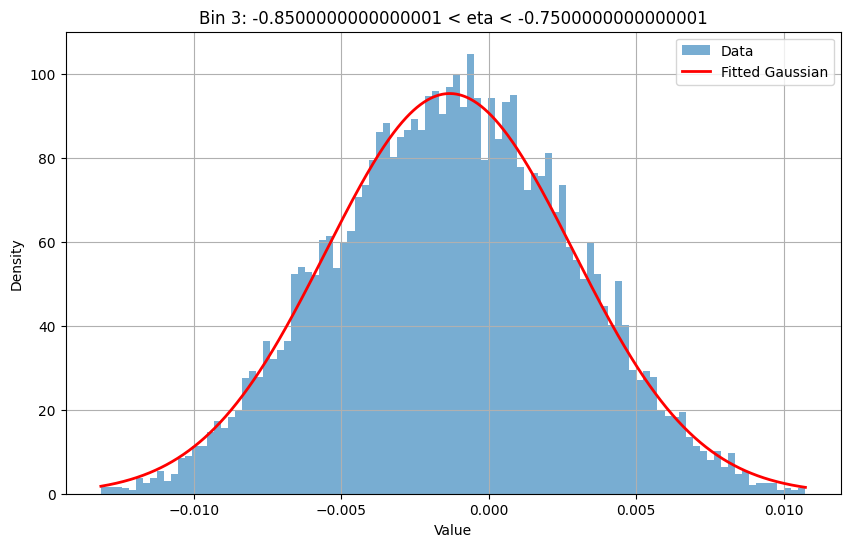

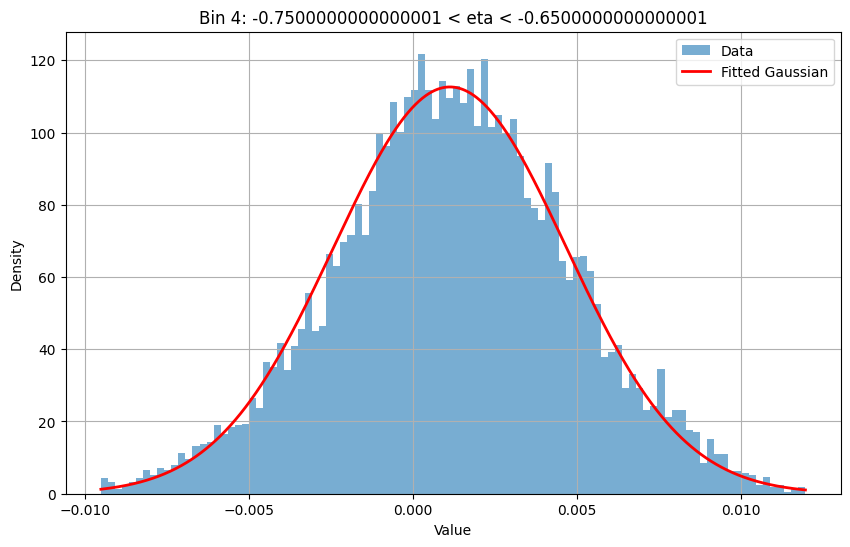

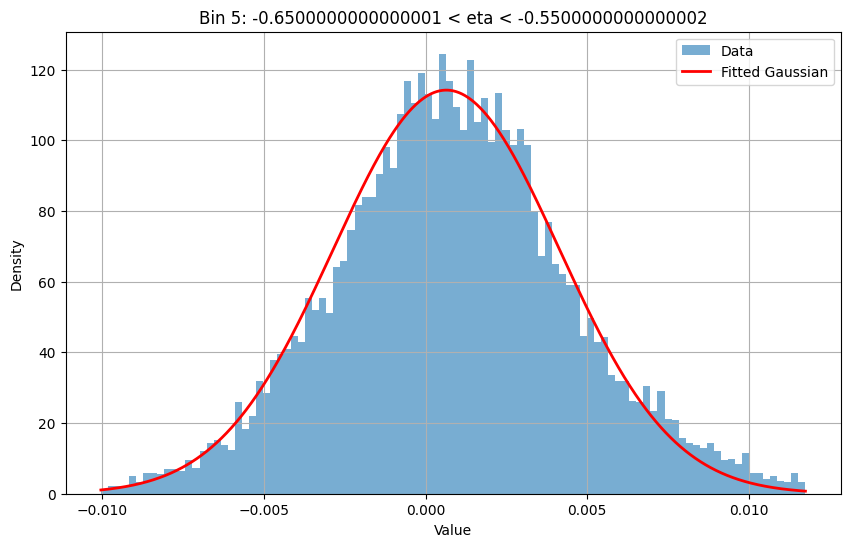

...

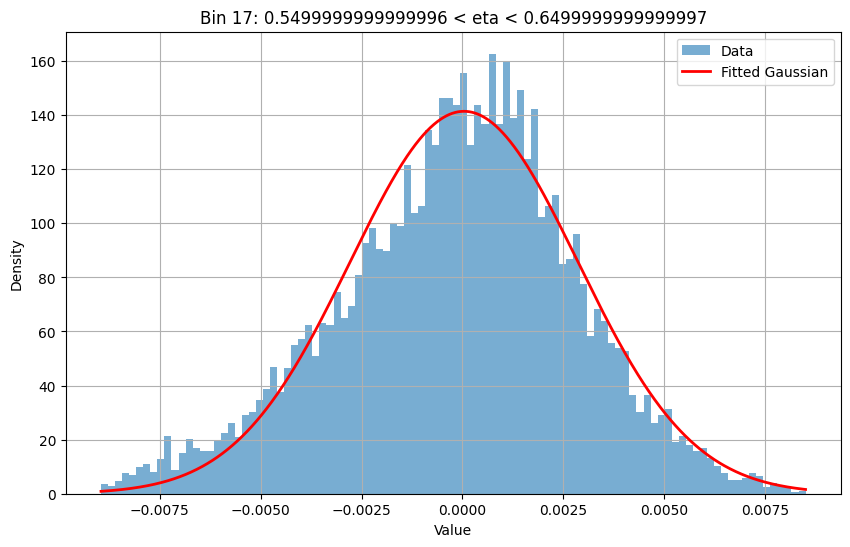

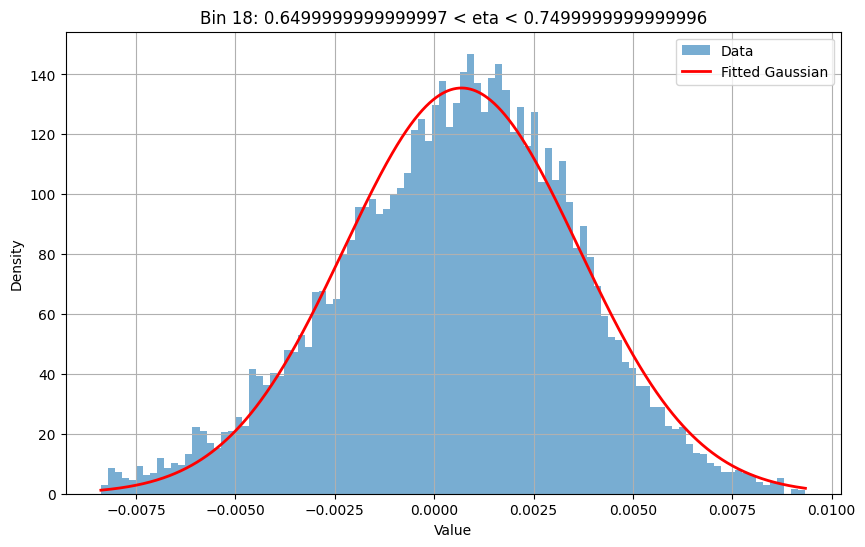

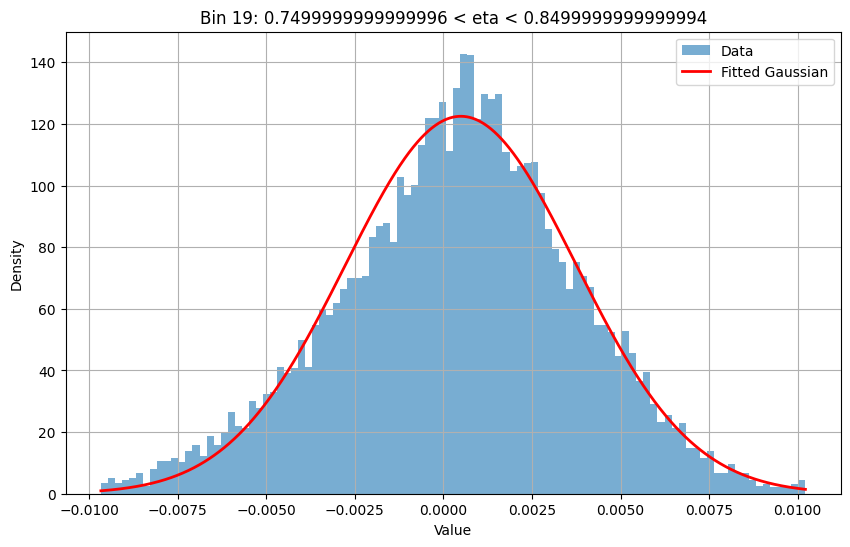

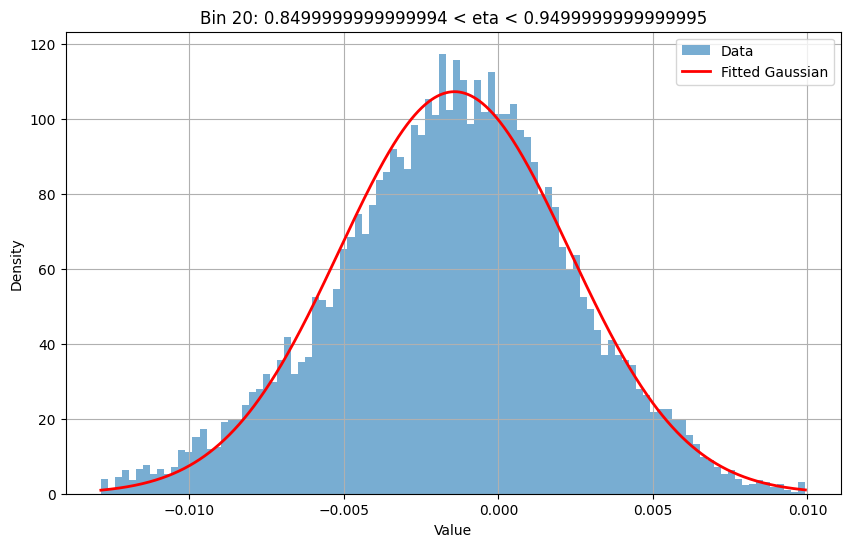

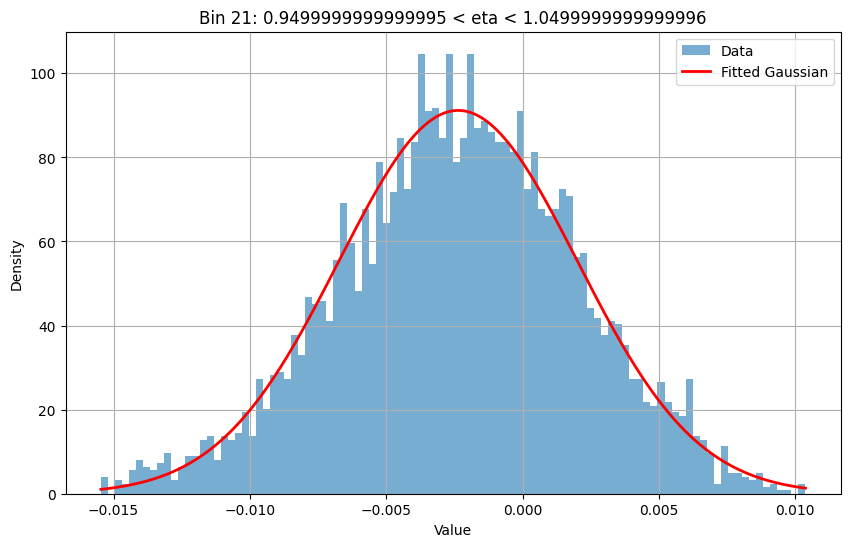

Computing resolution bins for phi0


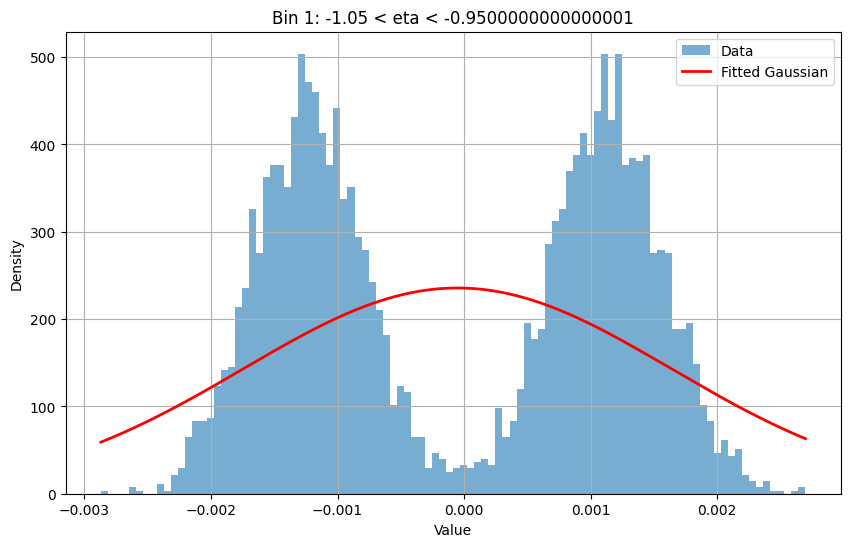

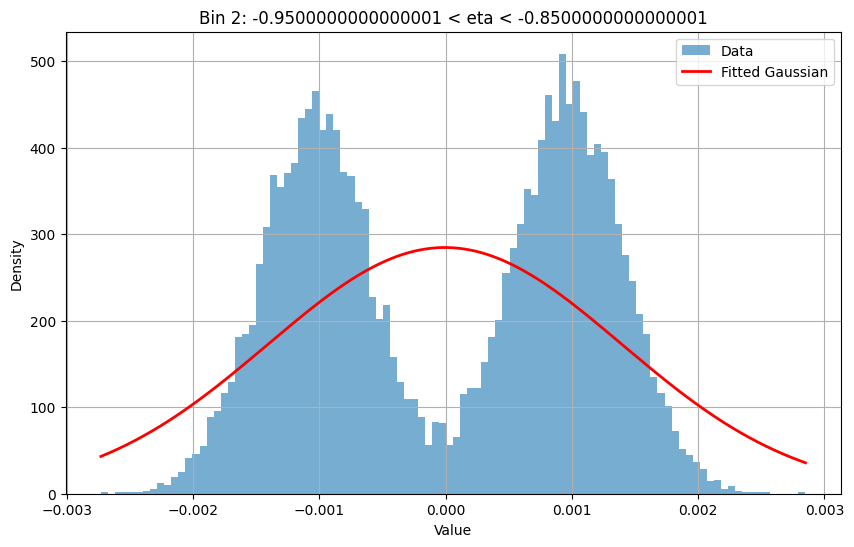

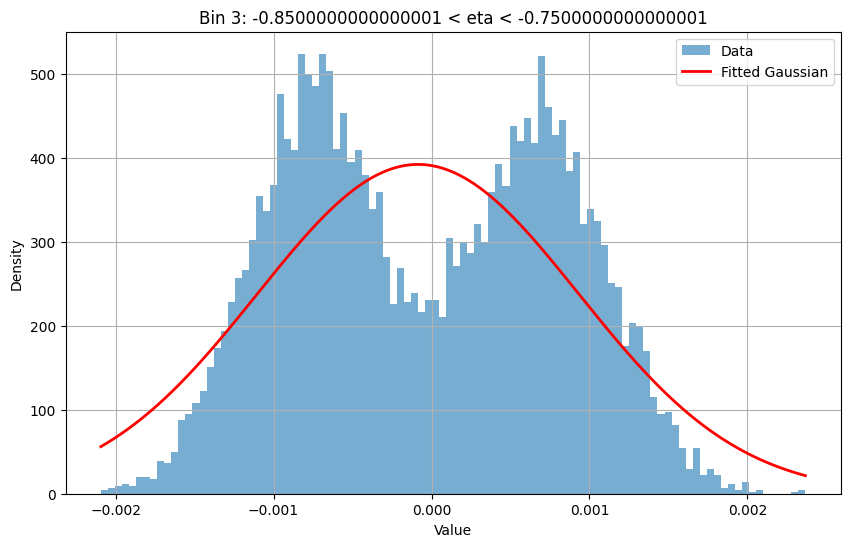

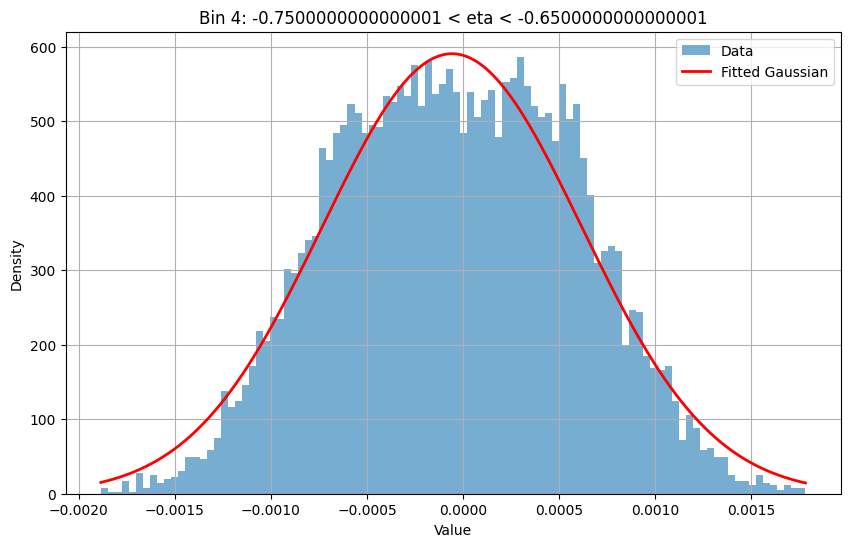

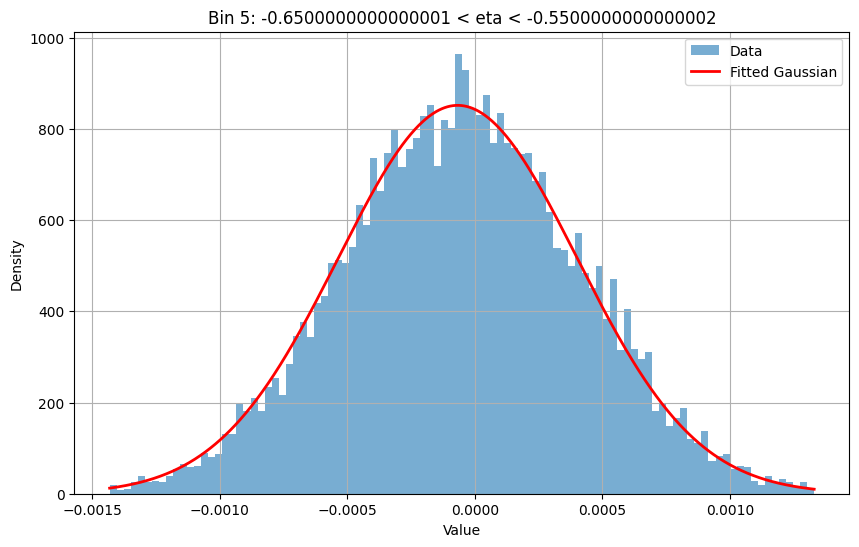

...

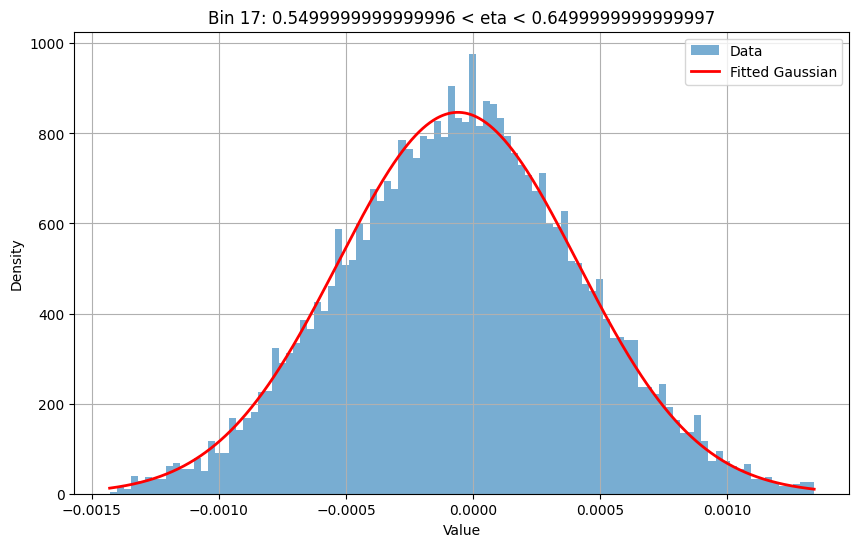

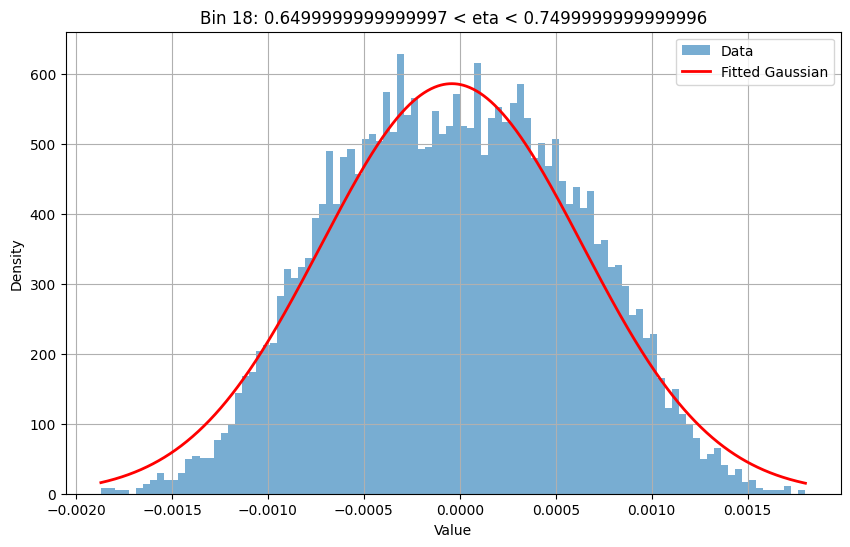

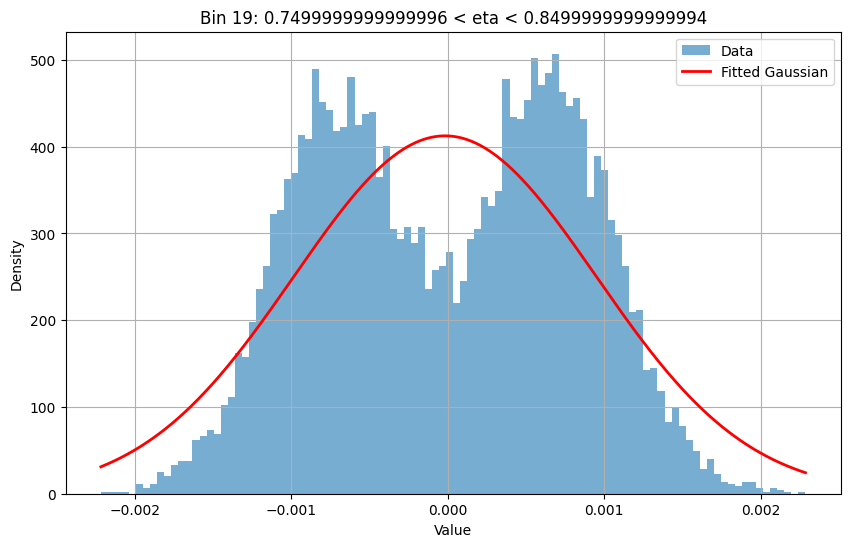

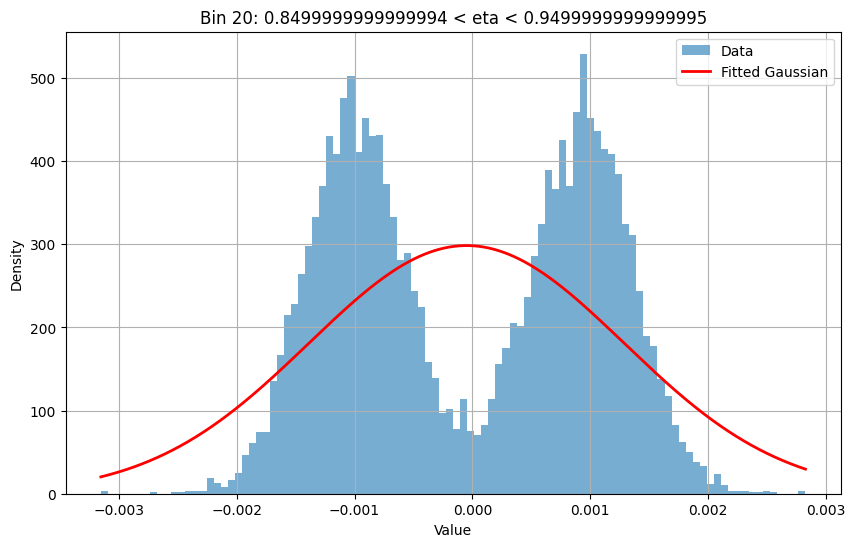

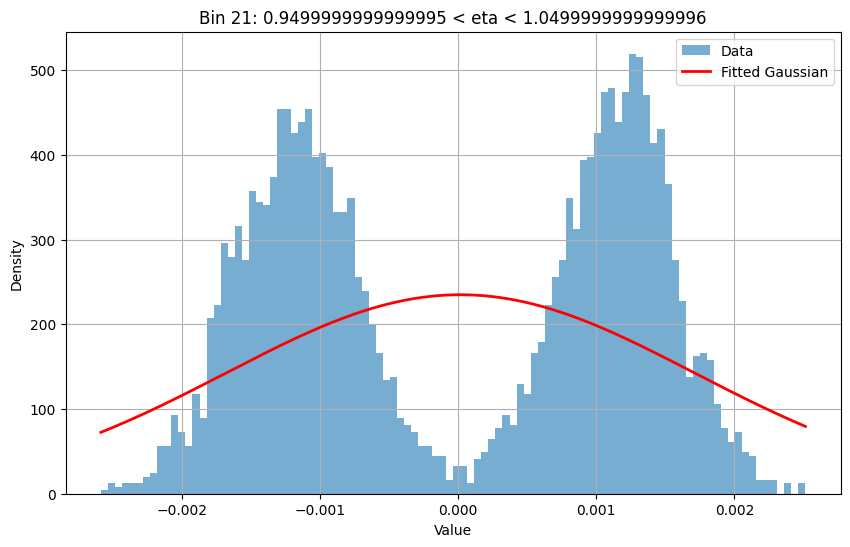

Computing resolution bins for d0


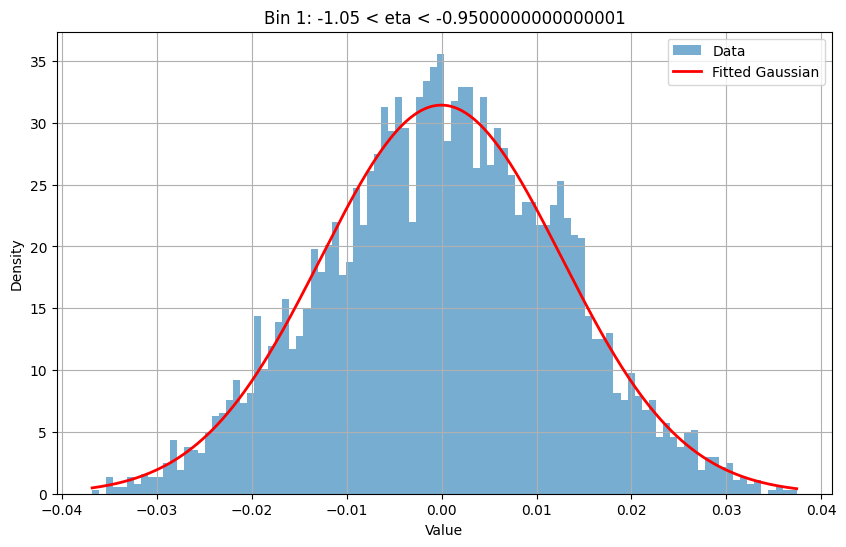

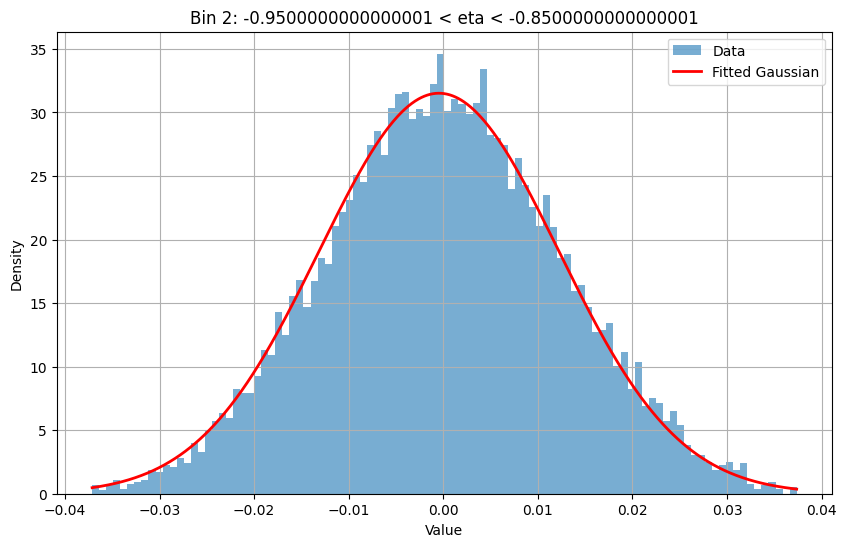

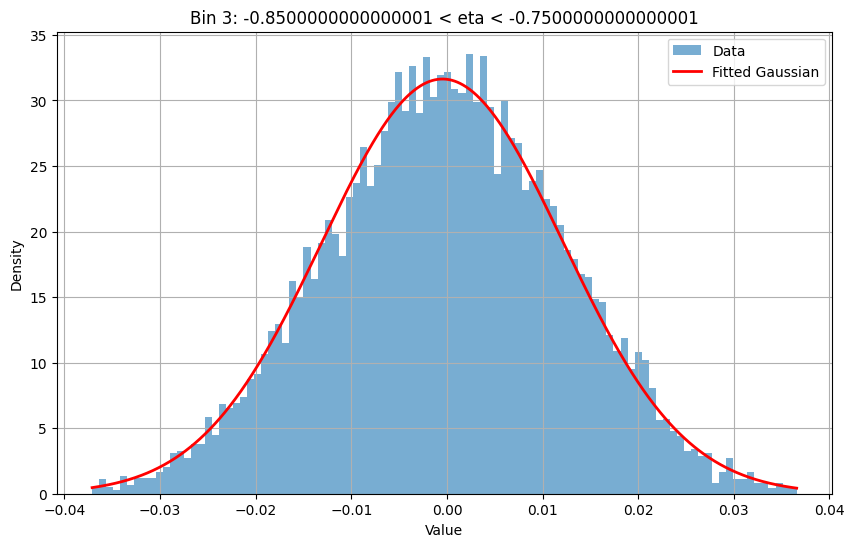

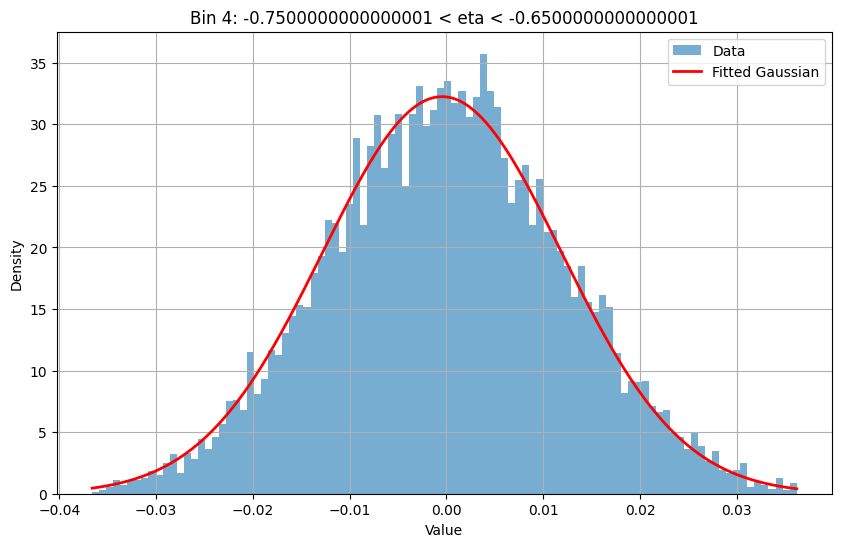

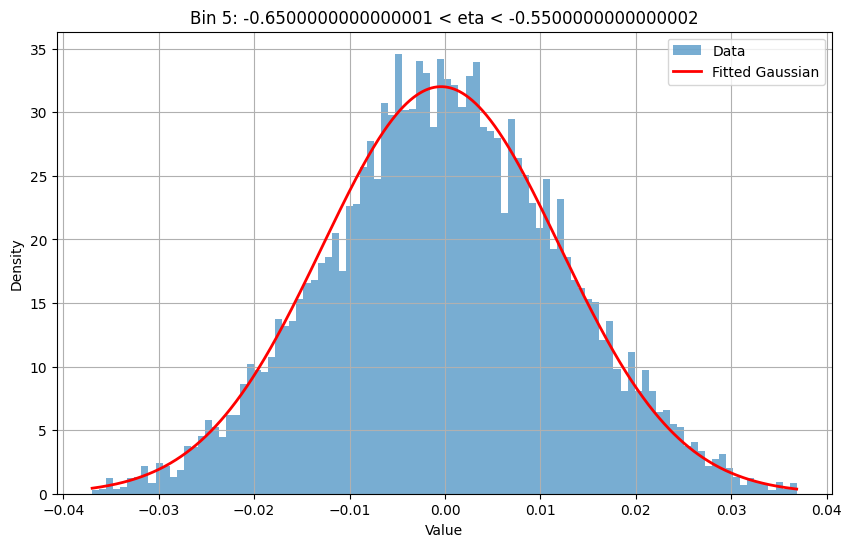

...

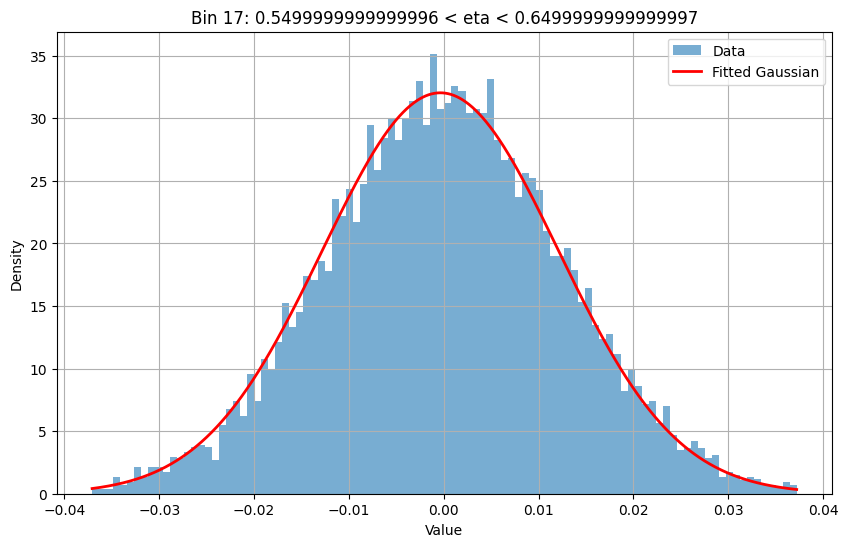

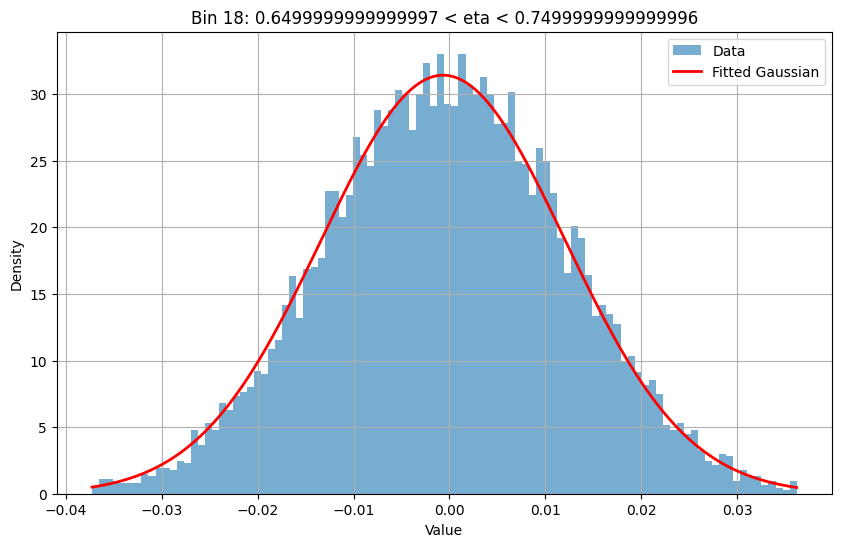

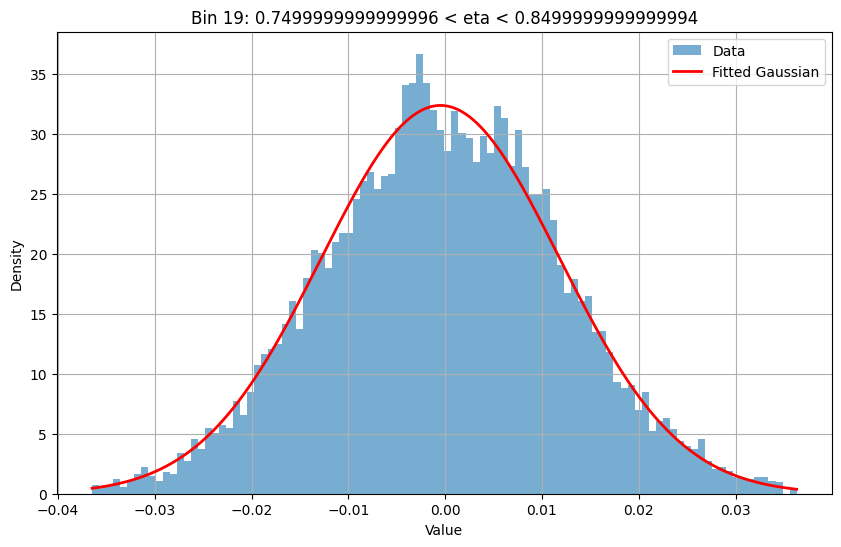

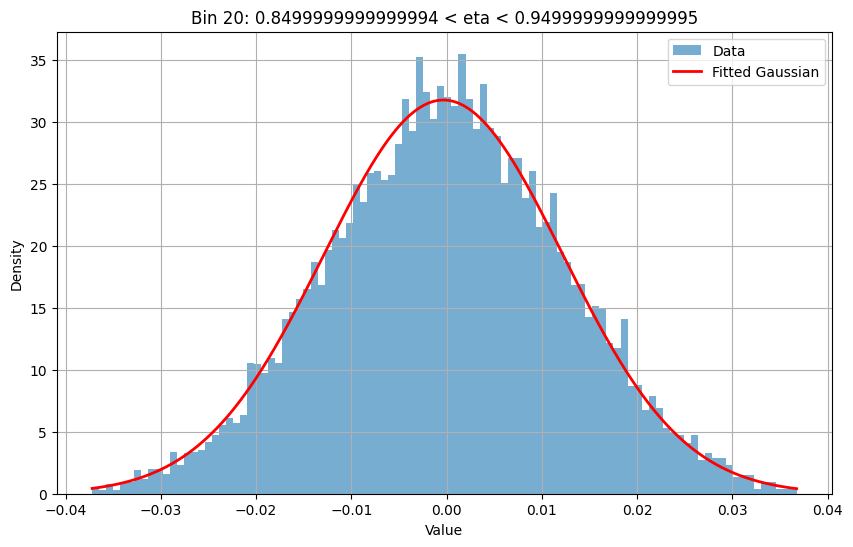

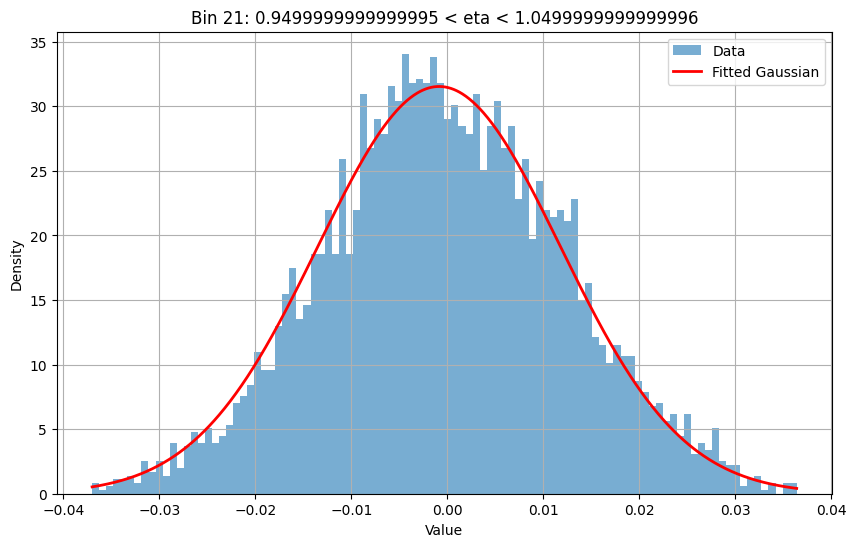

Computing resolution bins for z0


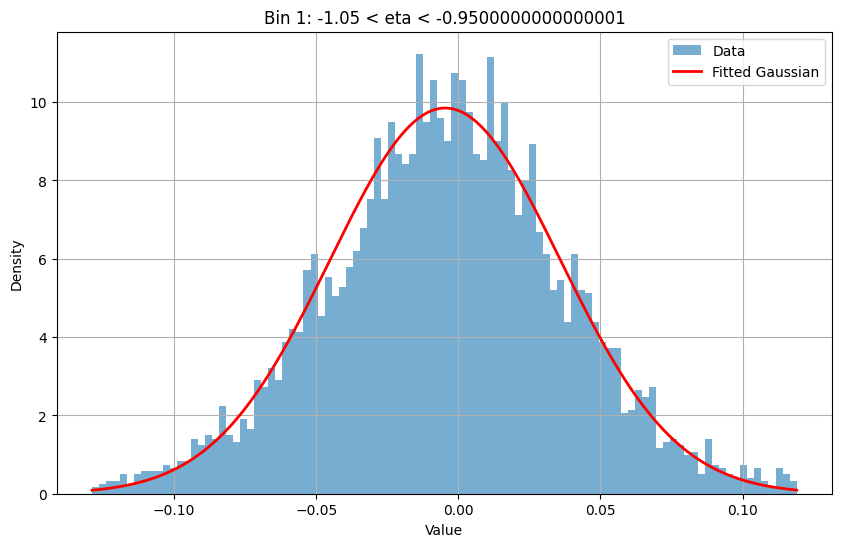

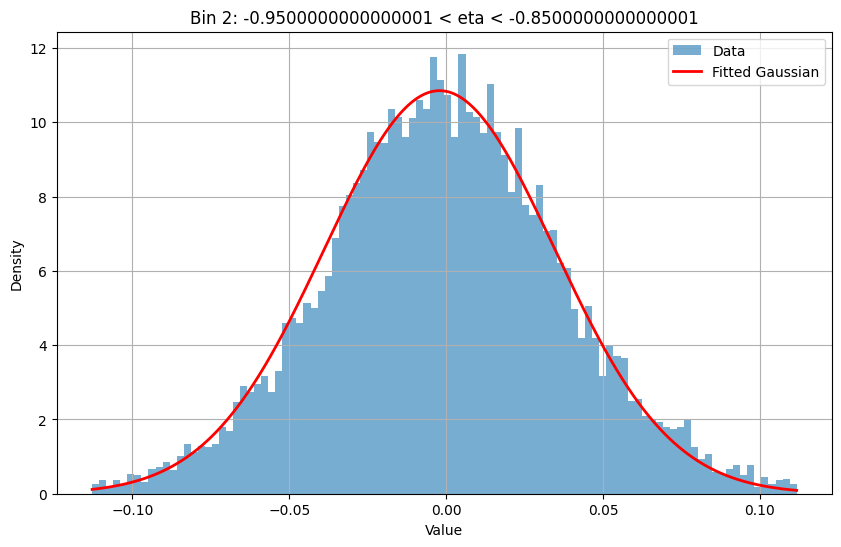

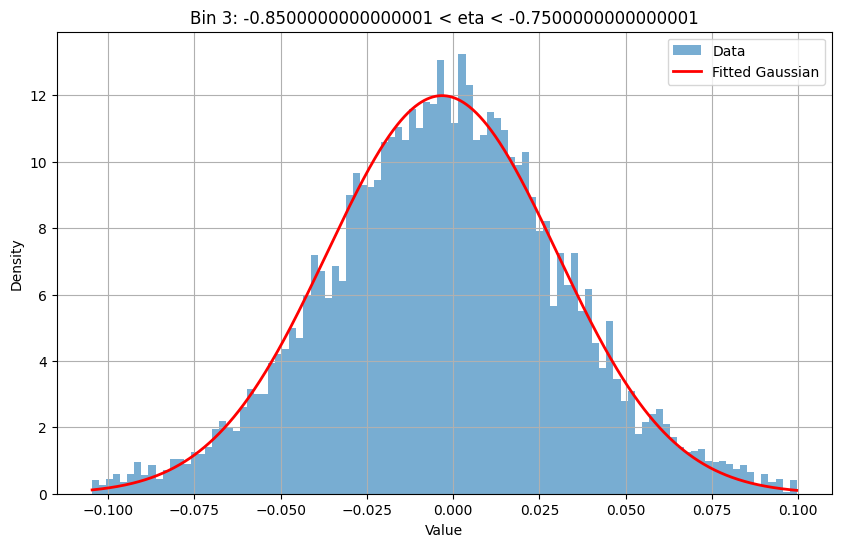

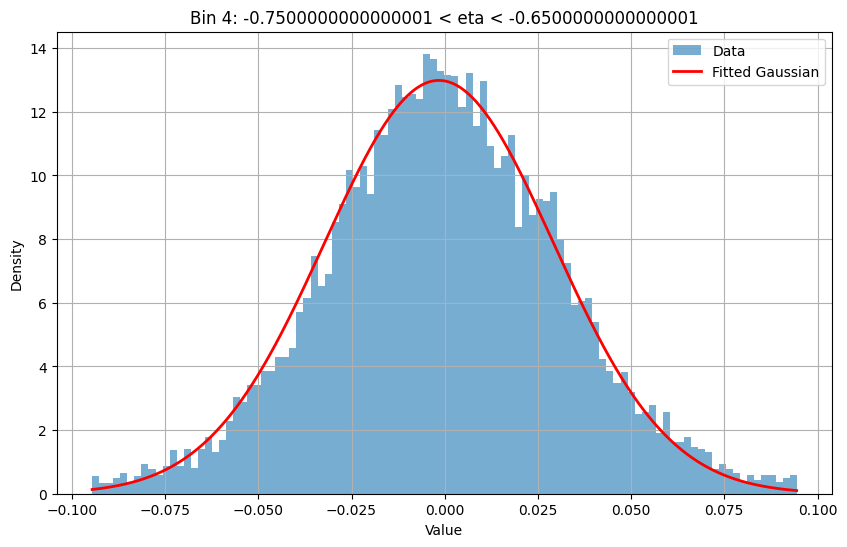

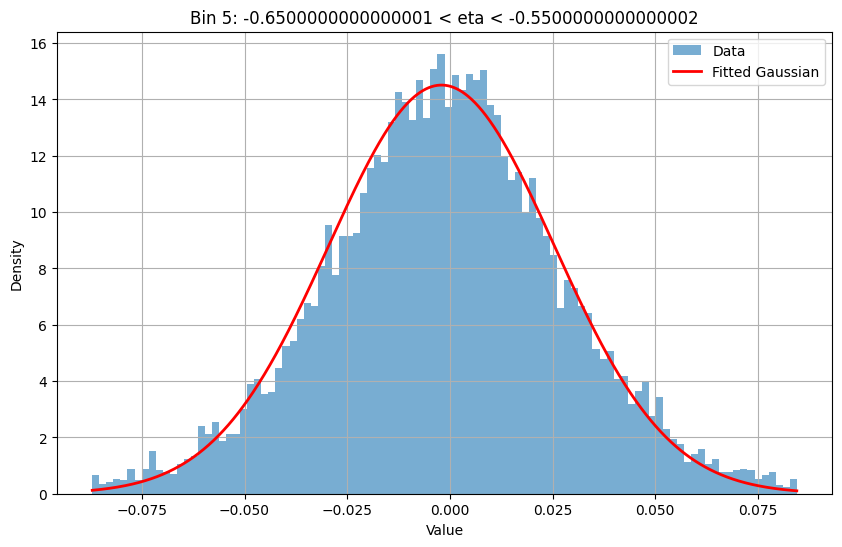

...

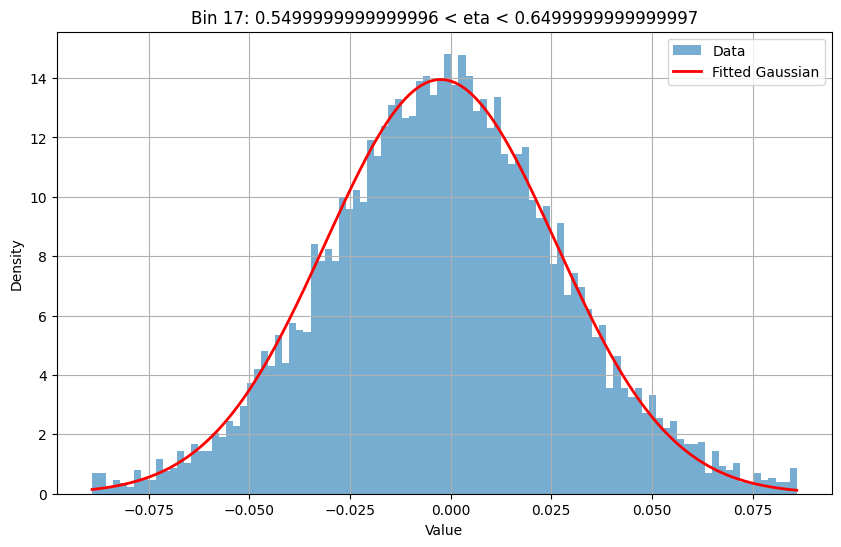

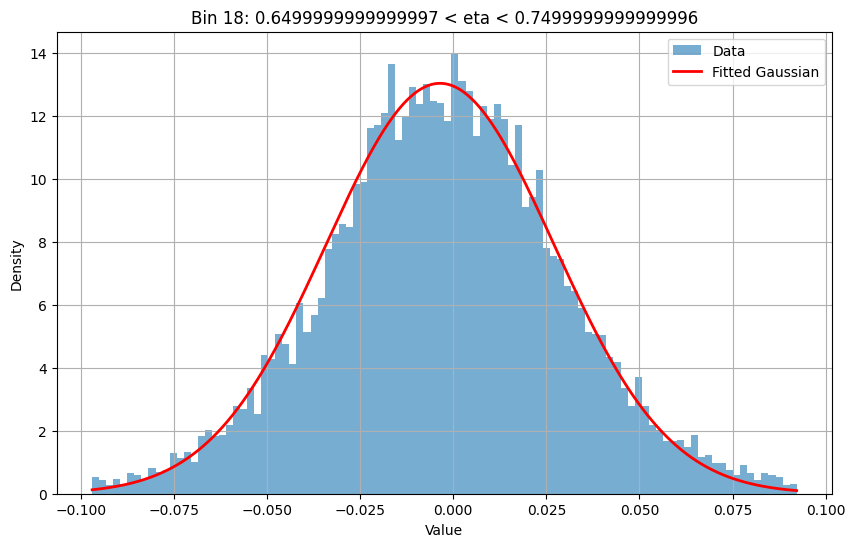

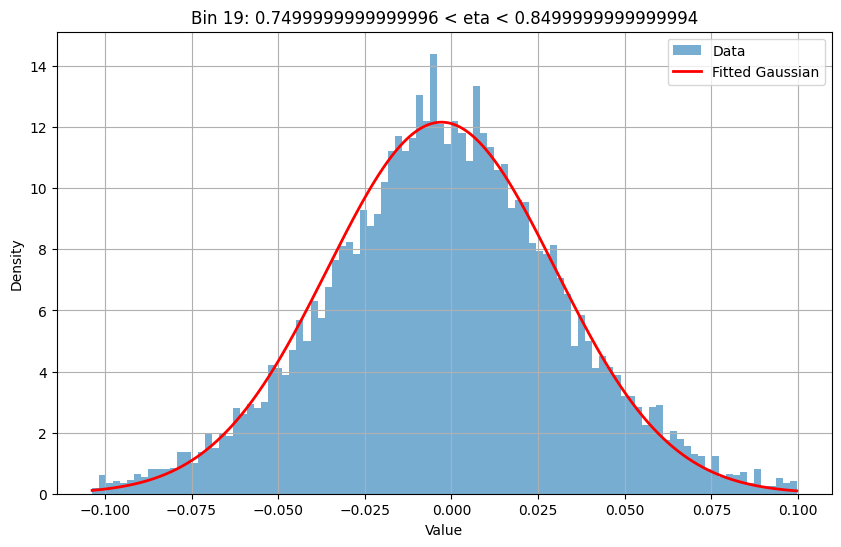

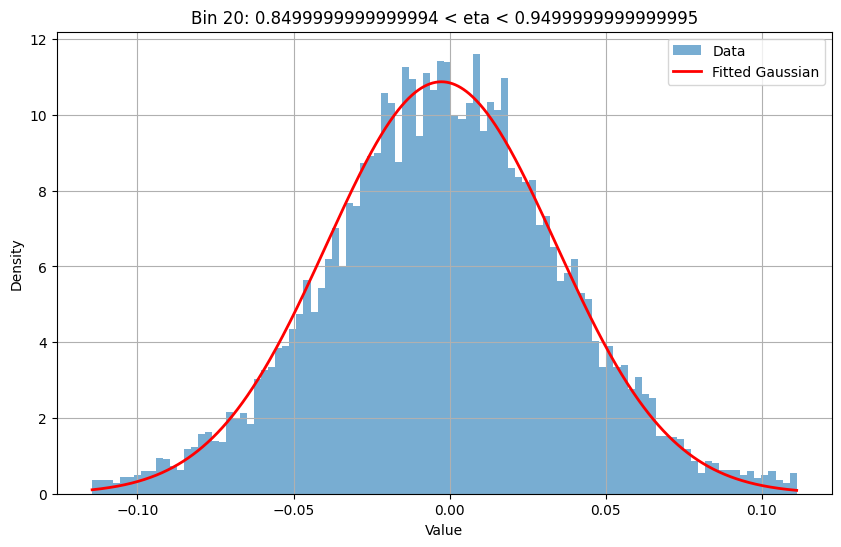

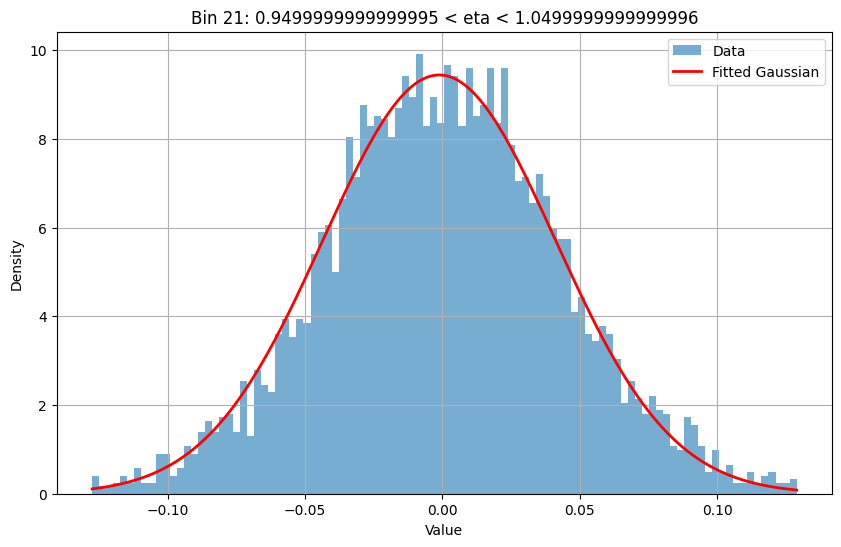

In [ ]:
model_name = "MSE_particles_truth"
# peta = all_events_tracks["eta_truth"]
bin_size = 0.1
eta_bins = np.arange(
    -(config["max_abs_eta"] + bin_size / 2),
    config["max_abs_eta"] + bin_size / 2 + bin_size,
    bin_size,
)
bin_centers = 0.5 * (eta_bins[:-1] + eta_bins[1:])
peta = all_events_particles["eta_truth"]
# model_data_bins = {}
for variable in config["output_variables"] + ["q_over_pT"]:
    if variable == "q_over_pT":
        pi_true_values = 1/p_to_pt(1/all_events_particles["q_over_p_truth"], all_events_particles["ptheta_truth"])
        # pi_pred_values = 1/p_to_pt(1/all_events_particles["q_over_p_pred"], all_events_particles["ptheta_truth"])
        pi_pred_values = 1/p_to_pt(1/all_events_particles["q_over_p_pred"], all_events_particles["ptheta_pred"])
    if variable == "dphi0":
        variable = "phi0"
    print(f"Computing resolution bins for {variable}")
    model_data_bins.setdefault(variable, {})
    if variable == "qopT":
        print(all_events_particles.columns)
        pi_true_values = all_events_particles["q_truth"] / all_events_particles["pT_truth"]
        pi_pred_values = all_events_particles["qopT_pred"]
    else:
        # pi_true_values = all_events_particles["q_over_p_truth"]
        # pi_pred_values = all_events_particles["q_over_p_pred"]
        # pi_true_values = 1/p_to_pt(1/all_events_particles["q_over_p_truth"], all_events_particles["ptheta_truth"])
        # pi_pred_values = 1/p_to_pt(1/all_events_particles["q_over_p_pred"], all_events_particles["ptheta_pred"])
        pi_true_values = all_events_particles[f"{variable}_truth"]
        pi_pred_values = all_events_particles[f"{variable}_pred"]

    model_data_bins[variable] = compute_resolution_bins(
                peta, eta_bins, pi_true_values, pi_pred_values, model_data_bins[variable], model_name=model_name, show=True
            )
    

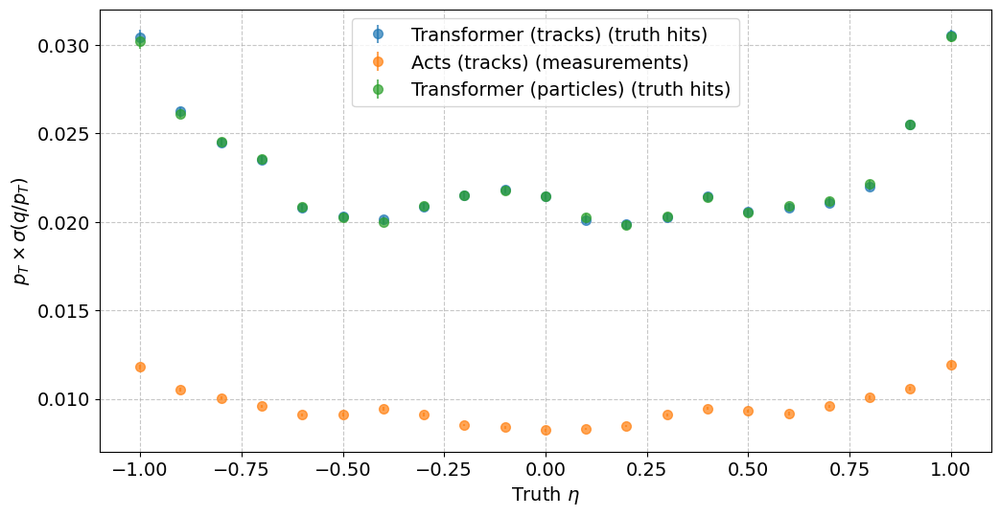

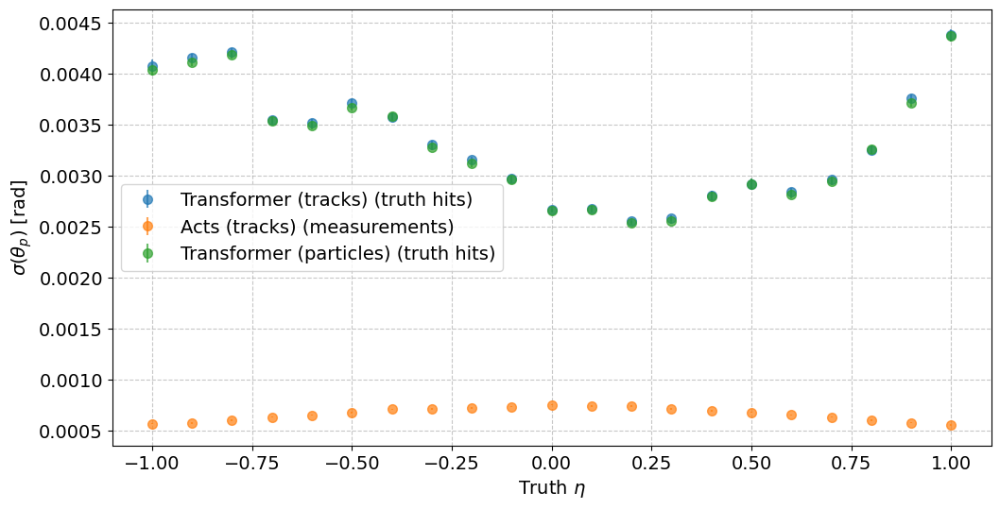

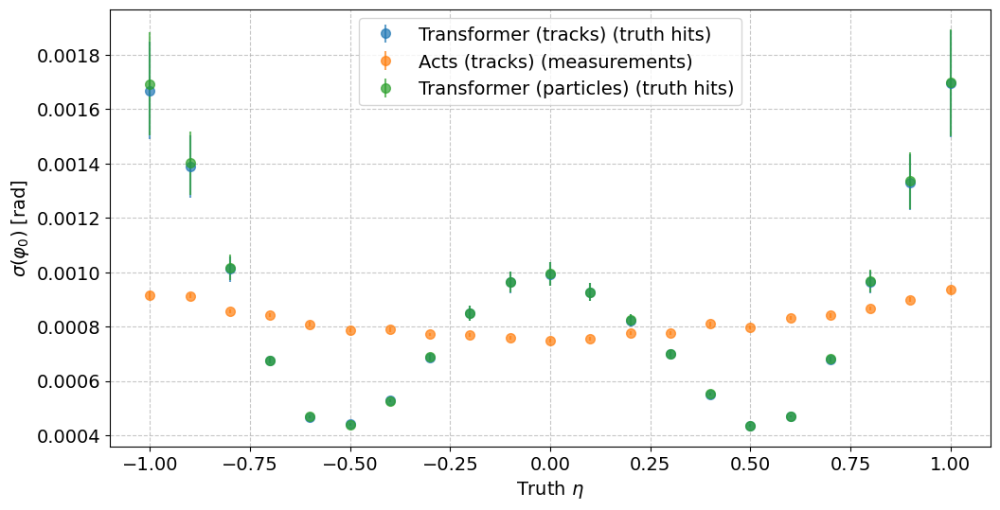

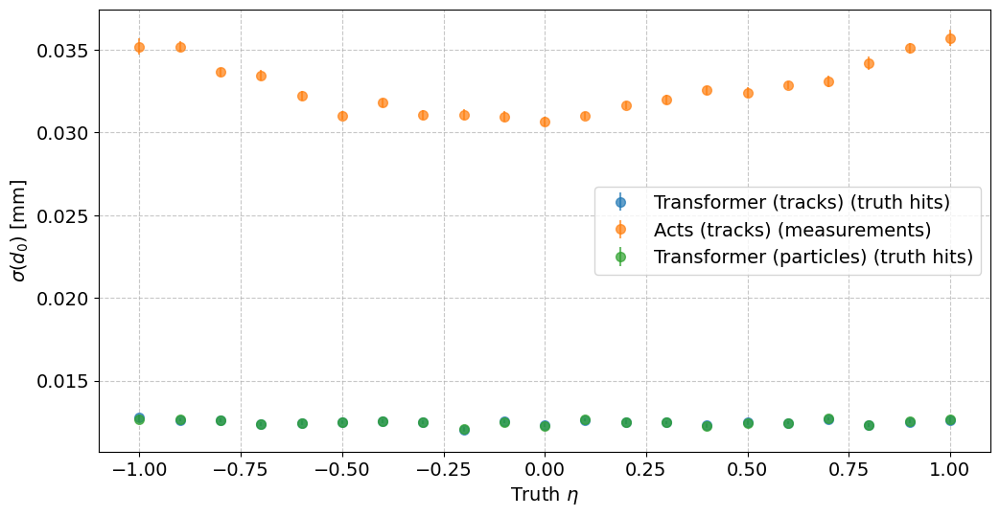

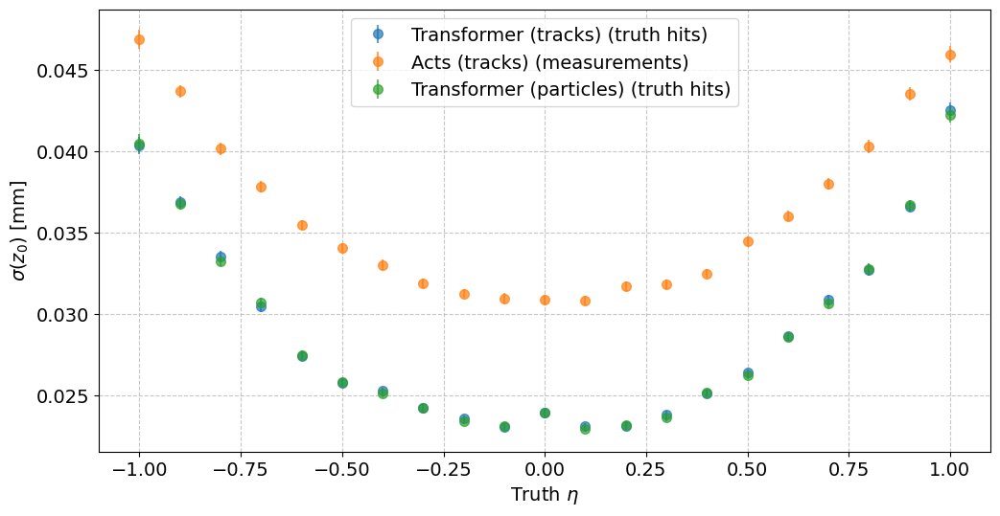

In [ ]:
plot_resolutions(model_data_bins, output_dir, bin_centers, skip_measurements=True)

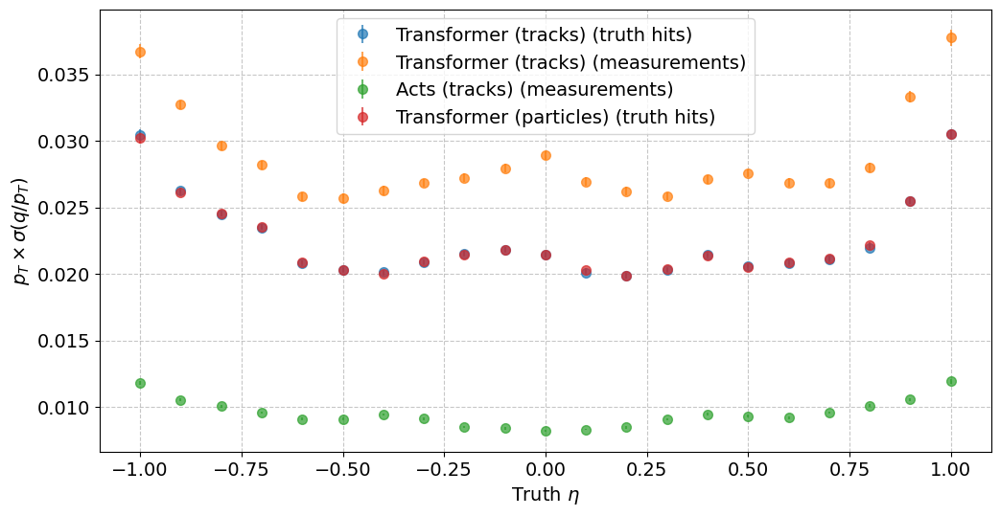

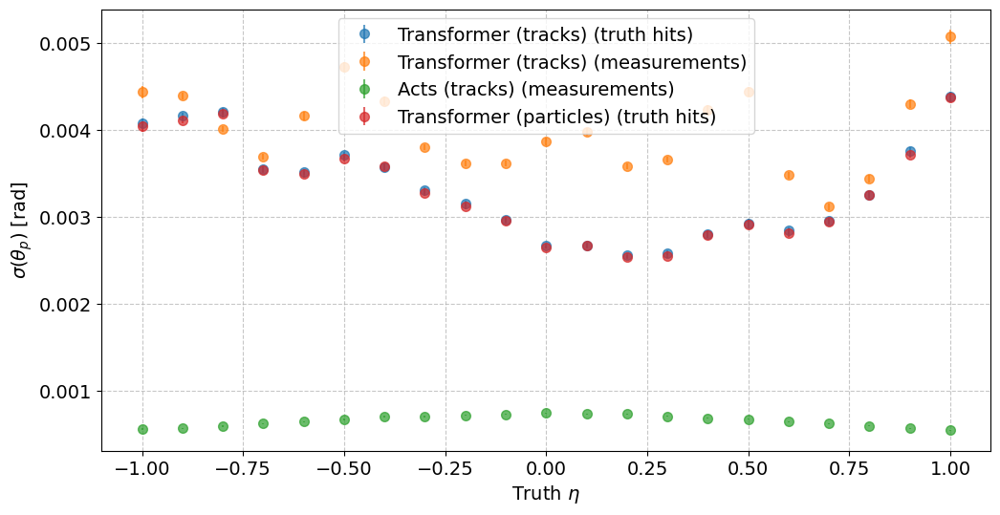

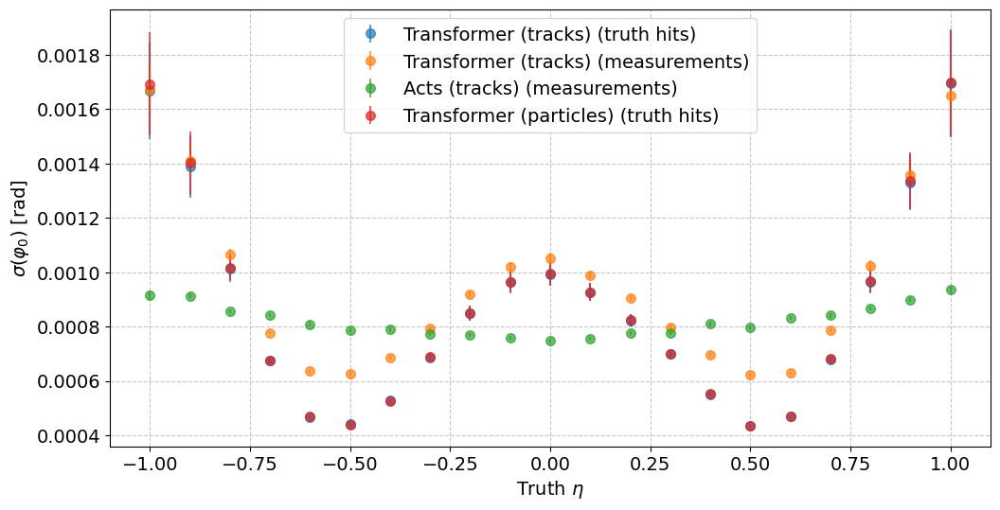

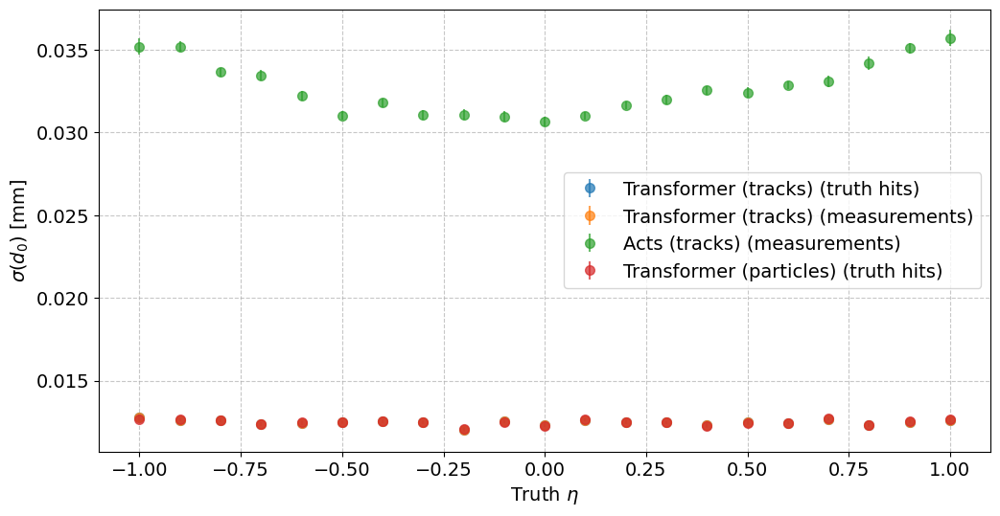

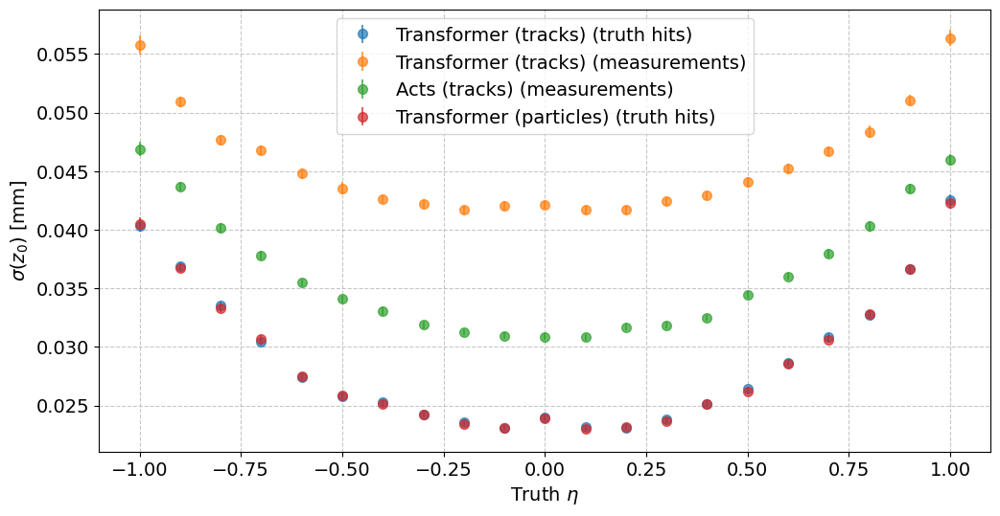

In [ ]:
plot_resolutions(model_data_bins, output_dir, bin_centers, skip_measurements=False)

In [1]:
print(all_events_particles.shape)
print(all_events_particles_list[0].shape)

NameError: name 'all_events_particles' is not defined